In [ ]:
import os
import random
import numpy as np
from numpy import genfromtxt
import pandas as pd
import math
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader, random_split
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.sampler import SubsetRandomSampler

import sys
import shutil
import warnings

In [ ]:
if 'google.colab' in str(get_ipython()):

  # To run in Gogogle Colab
  # You have to create a folder IFT6759 in your google drive 
  # and put all content of the folder ift-6759-forecast-project 

  #@title Mount your Google Drive

  %matplotlib inline
  %load_ext autoreload
  %autoreload 2

  from google.colab import drive
  #drive.mount('/content/gdrive')
  drive.mount("/content/gdrive", force_remount=True)

  folder = "/content/gdrive/MyDrive/IFT6759" #@param {type:"string"}
  !ln -Ts $folder /content/IFT6759 2> /dev/null

  # Add the assignment folder to Python path
  if '/content/IFT6759' not in sys.path:
      sys.path.insert(0, '/content/IFT6759')

  sys.path.insert(0,'/content/gdrive/MyDrive/IFT6759/functions')
  import utils
  import load_creator
  sys.path.insert(0,'/content/gdrive/MyDrive/IFT6759/models')
  import SUNSET
  import convGRU

else:

  import models.SUNSET as SUNSET
  import models.convGRU as convGRU
  import functions.utils as utils
  import functions.load_creator as load_creator

Mounted at /content/gdrive


In [ ]:
# Create device to use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
# set Random seed

seed = 10
torch.backends.cudnn.deterministic = True
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
if device.type=='cuda':
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [ ]:
# define folder location

dir_path = os.getcwd()

if 'google.colab' in str(get_ipython()):
  dir_path = os.path.join(dir_path, "gdrive/MyDrive/IFT6759")

data_folder = os.path.join(dir_path, "data")
model_folder = os.path.join(dir_path, "models")

#define file location

images_trainval_path = os.path.join(data_folder,'images_trainval.npy')
pv_log_trainval_path = os.path.join(data_folder,'pv_log_trainval.npy')
datetime_trainval_path = os.path.join(data_folder,'datetime_trainval.npy')

images_test_path = os.path.join(data_folder,'images_test.npy')
pv_log_test_path = os.path.join(data_folder,'pv_log_test.npy')
datetime_test_path = os.path.join(data_folder,'datetime_test.npy')

In [ ]:
# load PV output and images for the trainval set

pv_log_trainval = np.load(pv_log_trainval_path)
images_trainval = np.load(images_trainval_path)
images_trainval = images_trainval.reshape(images_trainval.shape[0],3,64,64)
datetimes_trainval = np.load(datetime_trainval_path, allow_pickle=True)

# load PV output and images for the test set

pv_log_test = np.load(pv_log_test_path)
images_test = np.load(images_test_path)
images_test = images_test.reshape(images_test.shape[0],3,64,64)
datetimes_test = np.load(datetime_test_path, allow_pickle=True)# get weather classification

# train
w_class_train_path = os.path.join(data_folder,'train_label_3_classes_d.csv')
w_class_train = pd.read_csv(w_class_train_path)

index_train_sunny = np.where(w_class_train == 'Sunny')[0].tolist()
index_train_cloudy = np.where(w_class_train == 'Cloudy')[0].tolist()
index_train_overcast = np.where(w_class_train == 'Overcast')[0].tolist() 

#test
w_class_test_path = os.path.join(data_folder,'test_label_3_classes_d.csv')
w_class_test = pd.read_csv(w_class_test_path)

index_test_sunny = np.where(w_class_test == 'Sunny')[0].tolist()
index_test_cloudy = np.where(w_class_test == 'Cloudy')[0].tolist()
index_test_overcast = np.where(w_class_test == 'Overcast')[0].tolist()

In [ ]:
np.shape(index_test_sunny), np.shape(index_test_cloudy), np.shape(index_test_overcast)

((5926,), (2941,), (1043,))

In [ ]:
#Sunny

pv_log_trainval_sunny = pv_log_trainval[index_train_sunny] 
images_trainval_sunny = images_trainval[index_train_sunny]
datetimes_trainval_sunny = datetimes_trainval[index_train_sunny]

pv_log_test_sunny = pv_log_test[index_test_sunny]
images_test_sunny = images_test[index_test_sunny]
datetimes_test_sunny = datetimes_test[index_test_sunny]

# cloudy

pv_log_trainval_cloudy = pv_log_trainval[index_train_cloudy] 
images_trainval_cloudy = images_trainval[index_train_cloudy]
datetimes_trainval_cloudy = datetimes_trainval[index_train_cloudy]

pv_log_test_cloudy = pv_log_test[index_test_cloudy]
images_test_cloudy = images_test[index_test_cloudy]
datetimes_test_cloudy = datetimes_test[index_test_cloudy]

# overcast

pv_log_trainval_overcast = pv_log_trainval[index_train_overcast] 
images_trainval_overcast = images_trainval[index_train_overcast]
datetimes_trainval_overcast = datetimes_trainval[index_train_overcast]

pv_log_test_overcast = pv_log_test[index_test_overcast]
images_test_overcast = images_test[index_test_overcast]
datetimes_test_overcast = datetimes_test[index_test_overcast]

In [ ]:
def weight_reset(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        m.reset_parameters()

In [ ]:
#import importlib
#importlib.reload(utils)
#importlib.reload(SUNSET)
#importlib.reload(convGRU)
#importlib.reload(load_creator)

<module 'load_creator' from '/content/gdrive/MyDrive/IFT6759/functions/load_creator.py'>

In [ ]:
# seq_len, epochs, lr, weight_decay, conv_layers, convGRU_layers, fc_layers
epochs = 100

configs = {
  1:  (1, epochs, 3e-6, 1e-5, 2, 0, 2, 'Baseline 2-0-2'),
  2:  (1, epochs, 5e-6, 1e-5, 2, 0, 0, 'Sunny - 2-0-0'),
  3:  (1, epochs, 5e-6, 1e-5, 1, 1, 2, 'Overcast - 2-0-1'),
  4:  (2, epochs, 5e-5, 1e-5, 0, 2, 2, 'Seq 2 - 0-2-2'),
  5:  (3, epochs, 3e-5, 1e-5, 2, 1, 2, 'Seq 3 - 0-2-2'),  
  6:  (2, epochs, 3e-5, 1e-5, 0, 2, 0, 'Seq 2 - 0-2-0'),
  7:  (2, epochs, 5e-5, 1e-5, 0, 3, 2, 'Seq 2 - 0-3-2'),
  8:  (2, epochs, 5e-5, 1e-5, 0, 3, 1, 'Seq 2 - 0-3-1'),
  9:  (2, epochs, 5e-5, 1e-5, 0, 3, 0, 'Seq 2 - 0-3-0'),
  10: (3, epochs, 5e-5, 1e-5, 2, 1, 2, 'Seq 3 - 0-2-2'),
  11: (2, epochs, 5e-5, 1e-5, 0, 2, 0, 'Seq 2 - 0-2-0'),
  12: (3, epochs, 5e-5, 1e-5, 0, 3, 2, 'Seq 3 - 0-3-2'),
  13: (2, epochs, 3e-5, 1e-5, 1, 1, 0, 'Seq 2 - 1-1-0'), 
  14: (2, epochs, 3e-5, 1e-5, 2, 3, 2, 'Seq 2 - 2-1-2'),
  15: (2, epochs, 3e-5, 1e-5, 2, 3, 2, 'Seq 2 - 2-3-2'),
  16: (2, epochs, 3e-5, 1e-5, 2, 3, 2, 'Seq 2 - 2-2-0'),
  17: (2, epochs, 3e-5, 1e-5, 2, 3, 2, 'Seq 2 - 0-3-1')
  }
 


# All data - SUNSET Architecture (Baseline)

In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[1]

num_epochs = 50
batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval, datetimes_test, images_trainval, images_test, 
                                                         pv_log_trainval, pv_log_test, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' valid loss: ' + str(Valid_losses[-1]) )
        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )


epoch: 0 train loss: 8.572193189959695 valid loss: 4.151148088991565
epoch: 1 train loss: 3.4861948678980683 valid loss: 3.311451250156786
epoch: 2 train loss: 3.115940949570481 valid loss: 3.138286132691831
epoch: 3 train loss: 2.9432904734546446 valid loss: 3.054382996308377
epoch: 4 train loss: 2.831786728914735 valid loss: 2.9496183401143625
epoch: 5 train loss: 2.7420055922597917 valid loss: 2.8838375208120075
epoch: 6 train loss: 2.6562544634200047 valid loss: 2.8162913082483563
epoch: 7 train loss: 2.589391135457267 valid loss: 2.736398823409478
epoch: 8 train loss: 2.5104467186368282 valid loss: 2.6877084941234166
epoch: 9 train loss: 2.4591057626988904 valid loss: 2.627082916802572
epoch: 10 train loss: 2.4034485173971882 valid loss: 2.5924731808939847
epoch: 11 train loss: 2.353826828392397 valid loss: 2.551834796305656
epoch: 12 train loss: 2.311595961262992 valid loss: 2.521333916726238
epoch: 13 train loss: 2.2742739231819606 valid loss: 2.484989591875203
epoch: 14 train l

#  All data - SUNSET Architecture (Baseline)

epoch: 0 train loss: 8.298561335207133 Test loss: 4.133322891941015


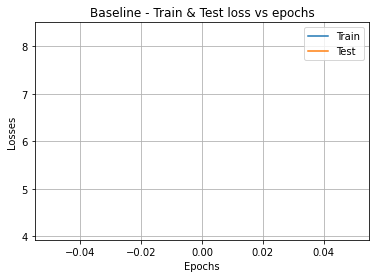

epoch: 1 train loss: 3.551516073464928 Test loss: 3.395209120411412


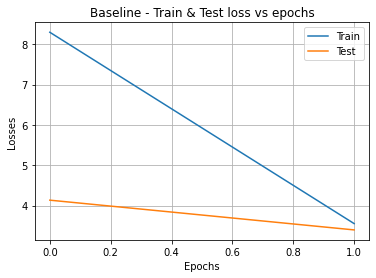

epoch: 2 train loss: 3.204822640839063 Test loss: 3.1500605521128207


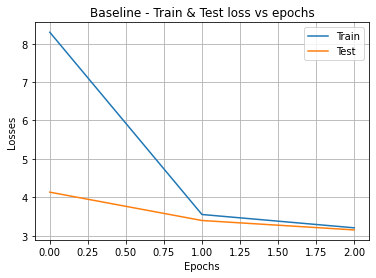

epoch: 3 train loss: 3.0264836398983466 Test loss: 3.034263987642574


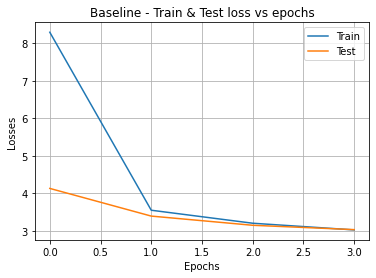

epoch: 4 train loss: 2.8940907999262593 Test loss: 2.9856534502649135


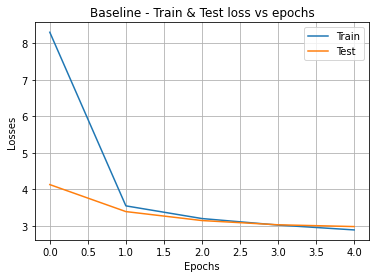

epoch: 5 train loss: 2.8006601999144873 Test loss: 2.9202092051056163


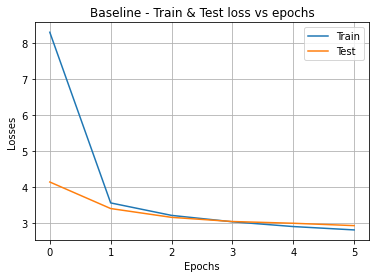

epoch: 6 train loss: 2.7179465399316323 Test loss: 2.8729733272979945


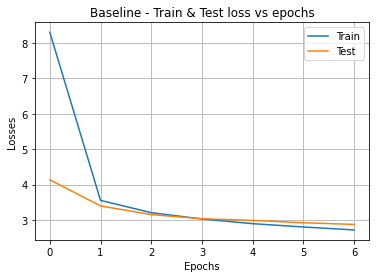

epoch: 7 train loss: 2.6392876322853605 Test loss: 2.8003235563632782


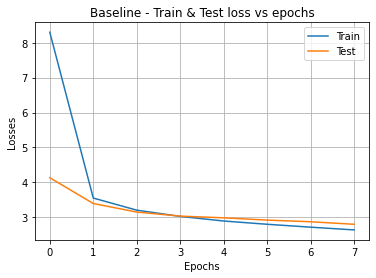

epoch: 8 train loss: 2.5778128468719412 Test loss: 2.7652200917205785


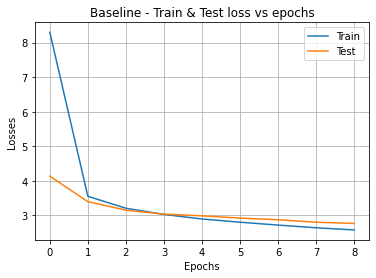

epoch: 9 train loss: 2.518535764891915 Test loss: 2.700322806466897


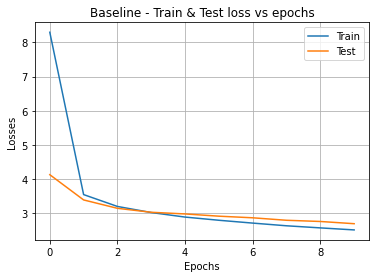

epoch: 10 train loss: 2.4580227363632665 Test loss: 2.662146927400861


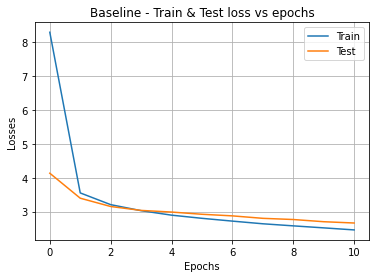

epoch: 11 train loss: 2.4125238923908303 Test loss: 2.620055293023123


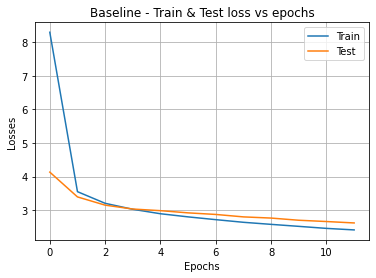

epoch: 12 train loss: 2.3648646870312873 Test loss: 2.5923142097379803


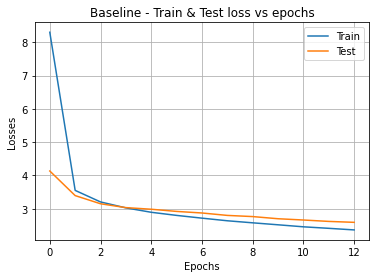

epoch: 13 train loss: 2.3312077542204817 Test loss: 2.560487087492433


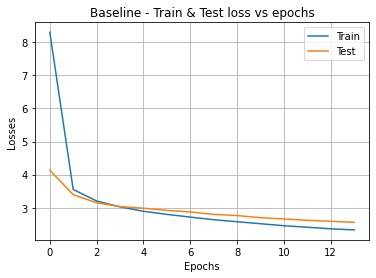

epoch: 14 train loss: 2.2882593403730183 Test loss: 2.5343937649661172


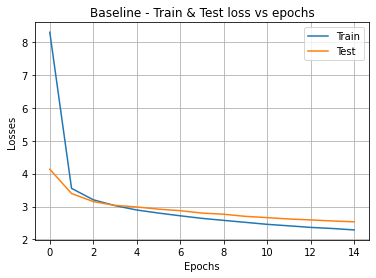

epoch: 15 train loss: 2.2495211877333467 Test loss: 2.4984162612877303


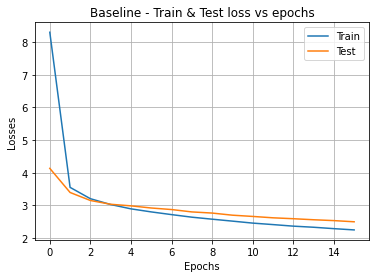

epoch: 16 train loss: 2.220143309055601 Test loss: 2.5022069973927086


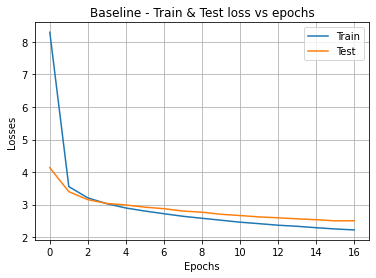

epoch: 17 train loss: 2.1918625227419413 Test loss: 2.4963239846415566


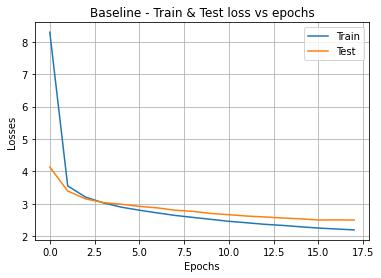

epoch: 18 train loss: 2.159955090539495 Test loss: 2.4794802636084907


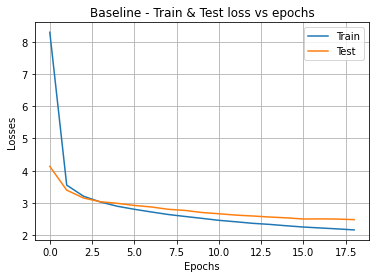

epoch: 19 train loss: 2.136337330637919 Test loss: 2.453741766972663


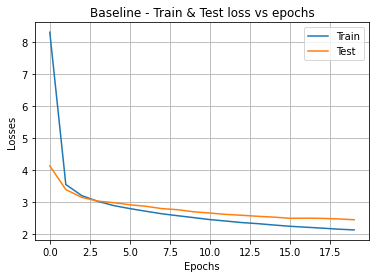

epoch: 20 train loss: 2.104602272116621 Test loss: 2.4543262445165115


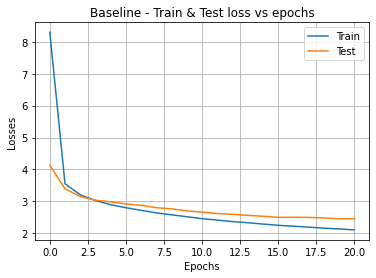

epoch: 21 train loss: 2.0791657197415816 Test loss: 2.4417133516959635


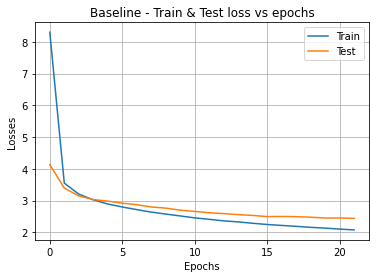

epoch: 22 train loss: 2.0645007117020815 Test loss: 2.4263749040441462


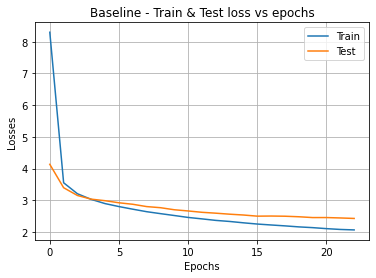

epoch: 23 train loss: 2.0363414268954885 Test loss: 2.4183566196103947


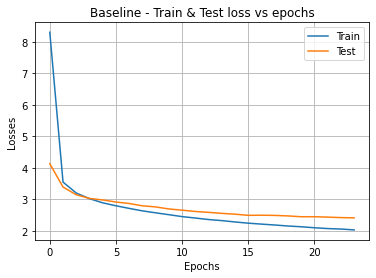

epoch: 24 train loss: 2.013654498289874 Test loss: 2.418786703295469


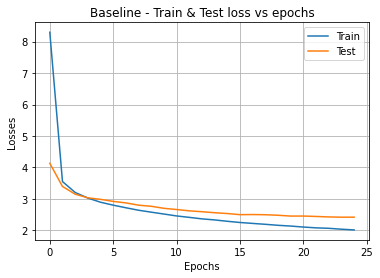

epoch: 25 train loss: 1.9981789188401853 Test loss: 2.418219117609627


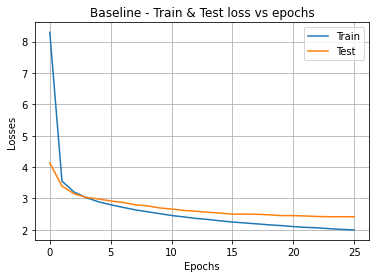

epoch: 26 train loss: 1.9770936791999627 Test loss: 2.4243804717145228


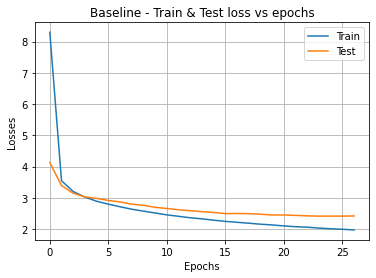

epoch: 27 train loss: 1.9573986886791908 Test loss: 2.414403995442679


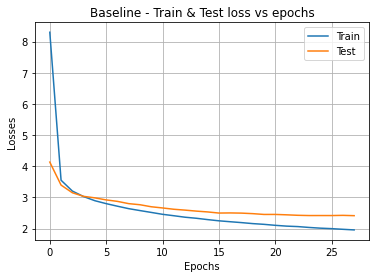

epoch: 28 train loss: 1.9373705714696383 Test loss: 2.416183500592912


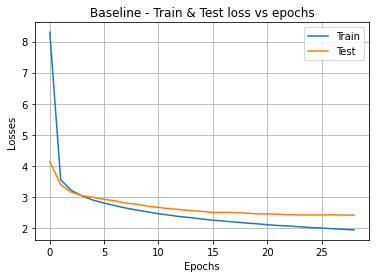

epoch: 29 train loss: 1.9222548493706535 Test loss: 2.4030670160204752


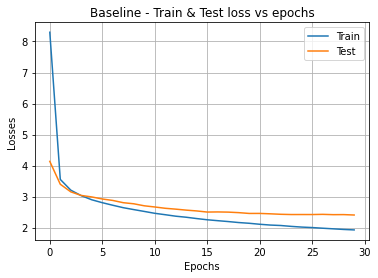

epoch: 30 train loss: 1.9044197606053945 Test loss: 2.3910007152722157


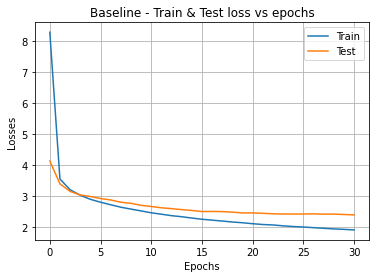

epoch: 31 train loss: 1.889473850564701 Test loss: 2.414526928936485


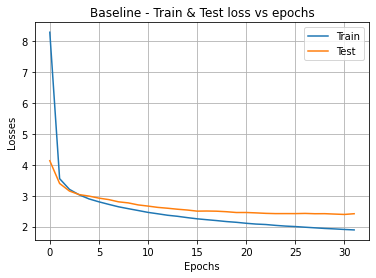

epoch: 32 train loss: 1.8672273826541557 Test loss: 2.387789597936588


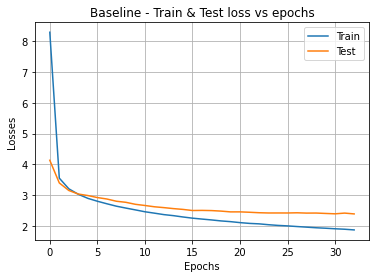

epoch: 33 train loss: 1.852574889410825 Test loss: 2.399287171683573


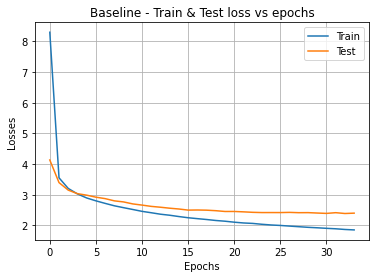

epoch: 34 train loss: 1.8298222670360065 Test loss: 2.415373727220024


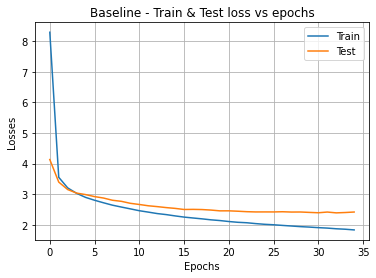

epoch: 35 train loss: 1.8234952272684766 Test loss: 2.4014757694263706


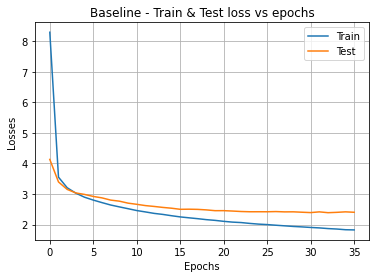

epoch: 36 train loss: 1.8064484606905113 Test loss: 2.4003167780681958


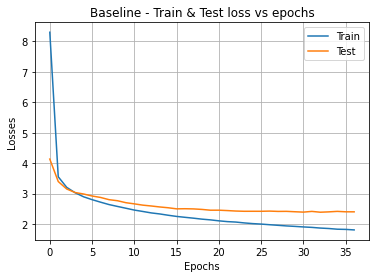

epoch: 37 train loss: 1.7942893508876743 Test loss: 2.3943093342073367


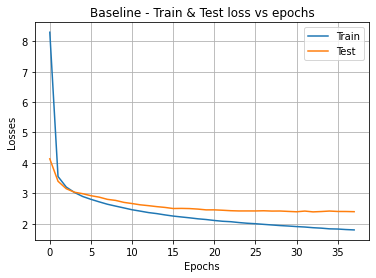

epoch: 38 train loss: 1.7749988176748215 Test loss: 2.4053498442856984


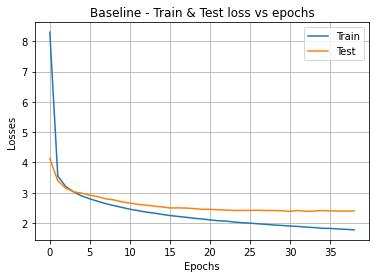

split: 0 test loss: 2.387789597936588
Mean test loss: 2.387789597936588


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[1]

num_epochs = 50
batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval, datetimes_test, images_trainval, images_test, 
                                                         pv_log_trainval, pv_log_test, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

# if split = False, valid_loaders = test_loader

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Baseline - Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()
        
        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

epoch: 0 train loss: 8.832849603658339 Test loss: 4.372547550958786


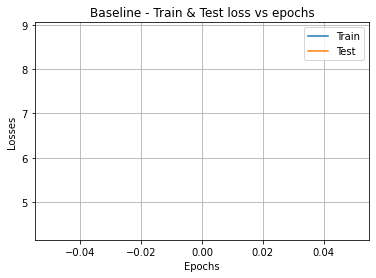

epoch: 1 train loss: 3.625133651137269 Test loss: 3.3846731115806428


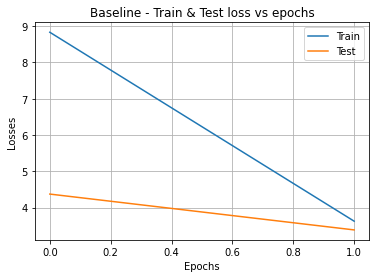

epoch: 2 train loss: 3.2514658625530255 Test loss: 3.230432559274595


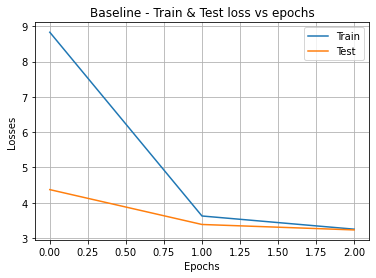

epoch: 3 train loss: 3.066749107828815 Test loss: 3.0194660715129107


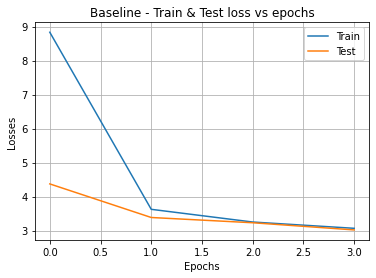

epoch: 4 train loss: 2.925894747058019 Test loss: 2.9541835416613362


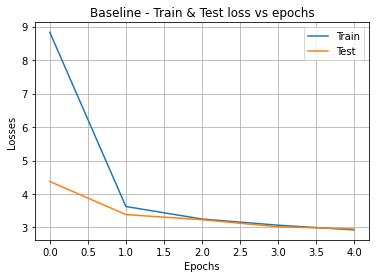

epoch: 5 train loss: 2.8285033740931893 Test loss: 2.8976434135139244


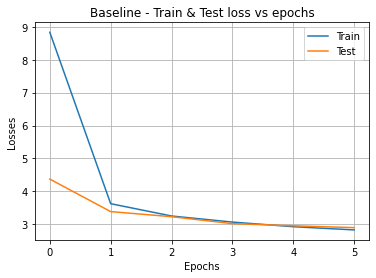

epoch: 6 train loss: 2.724789833636645 Test loss: 2.8403934660711614


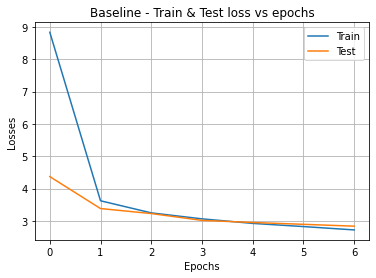

epoch: 7 train loss: 2.6531434242050476 Test loss: 2.7606417655952225


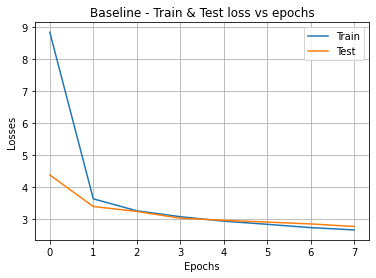

epoch: 8 train loss: 2.5772230093271618 Test loss: 2.7291544036781703


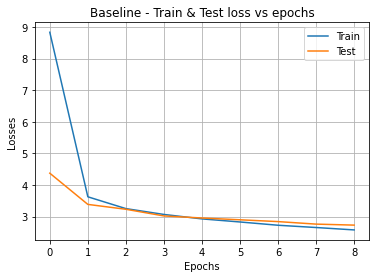

epoch: 9 train loss: 2.517033856331184 Test loss: 2.6944608224505124


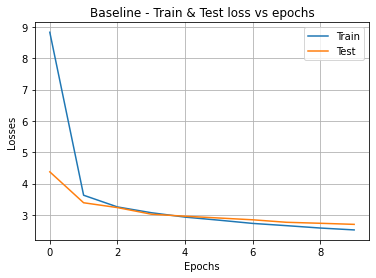

epoch: 10 train loss: 2.4589427734744853 Test loss: 2.6780562569344224


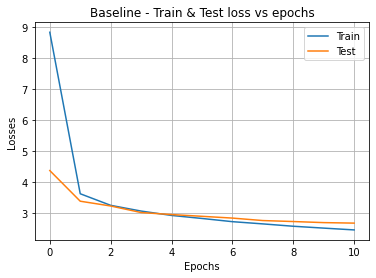

epoch: 11 train loss: 2.4089196798456305 Test loss: 2.6515916100349988


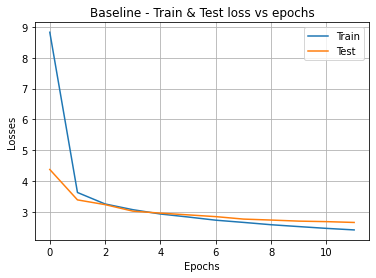

epoch: 12 train loss: 2.3733405829118297 Test loss: 2.600749641672944


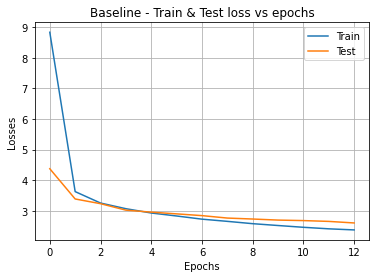

epoch: 13 train loss: 2.3327754277754718 Test loss: 2.566735428911562


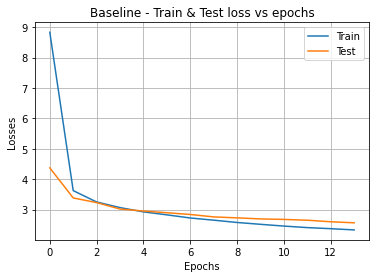

epoch: 14 train loss: 2.2928135391200146 Test loss: 2.560669431888372


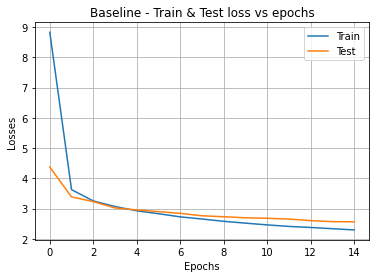

epoch: 15 train loss: 2.2547658269466933 Test loss: 2.544452274901952


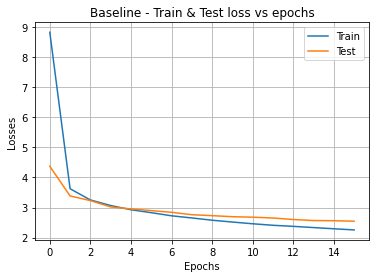

epoch: 16 train loss: 2.22518200724503 Test loss: 2.5228074892126755


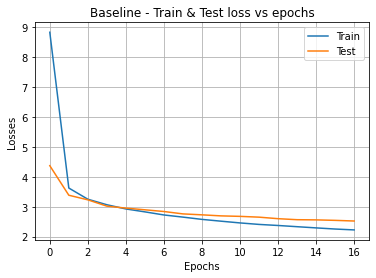

epoch: 17 train loss: 2.1996248780808023 Test loss: 2.496093885662621


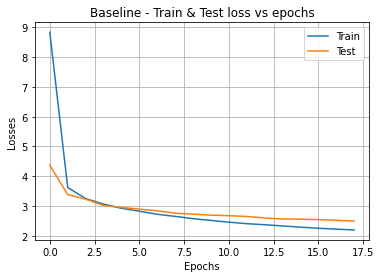

epoch: 18 train loss: 2.166995426210084 Test loss: 2.486502404321893


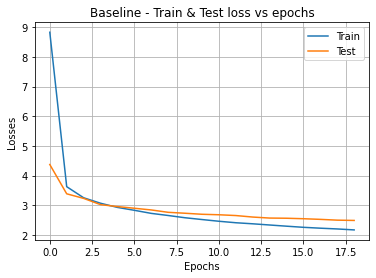

epoch: 19 train loss: 2.134918263774952 Test loss: 2.4655874489834155


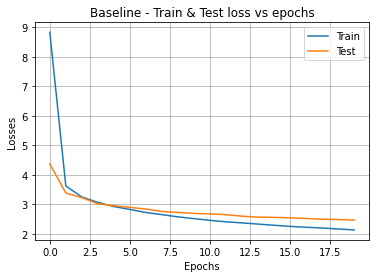

epoch: 20 train loss: 2.111332672276304 Test loss: 2.4667316558730765


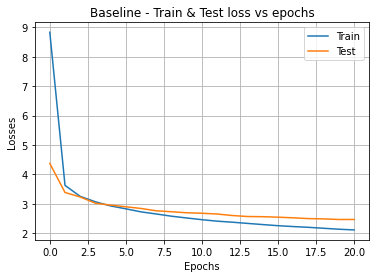

epoch: 21 train loss: 2.088644248809379 Test loss: 2.4345237331564573


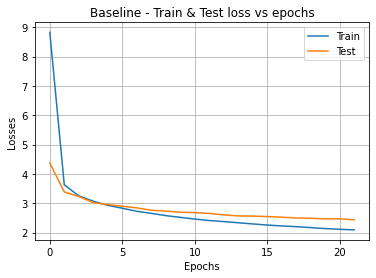

epoch: 22 train loss: 2.058848455852869 Test loss: 2.4341848766105176


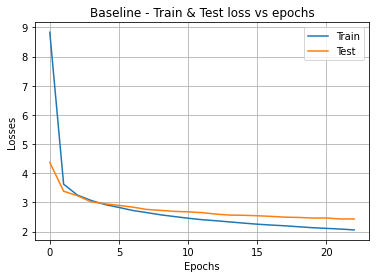

epoch: 23 train loss: 2.038362130105714 Test loss: 2.428861613347459


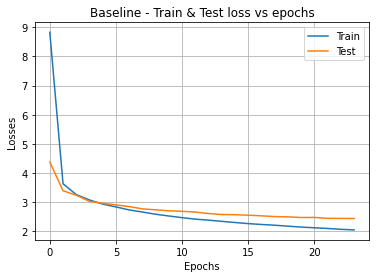

epoch: 24 train loss: 2.0165075421715444 Test loss: 2.415894838030425


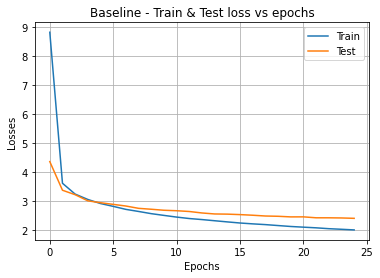

epoch: 25 train loss: 1.9936835726094253 Test loss: 2.419984682369373


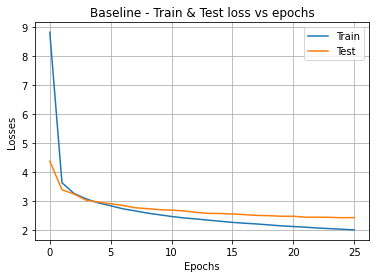

epoch: 26 train loss: 1.9761209429204056 Test loss: 2.412841512868513


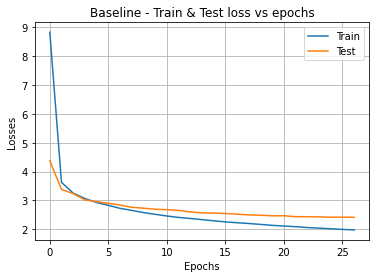

epoch: 27 train loss: 1.9453652813647009 Test loss: 2.3858983667617437


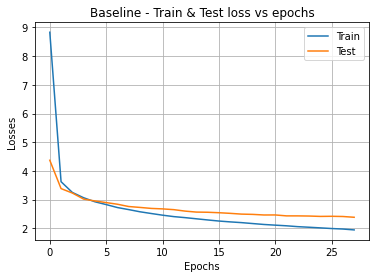

epoch: 28 train loss: 1.9325684124326923 Test loss: 2.389053747862135


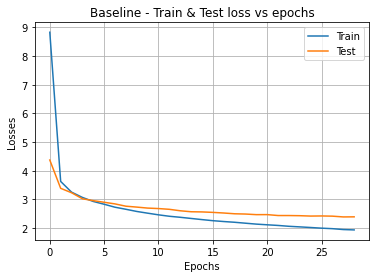

epoch: 29 train loss: 1.9170510570895076 Test loss: 2.400153102773769


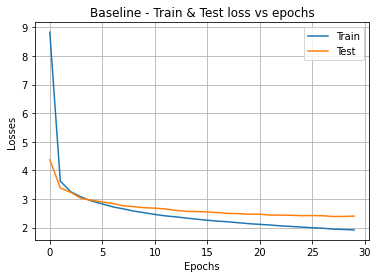

epoch: 30 train loss: 1.8939576683577133 Test loss: 2.3955116901032194


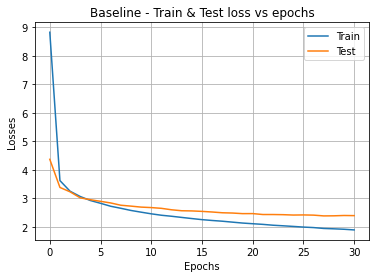

epoch: 31 train loss: 1.8715914456507938 Test loss: 2.3844082711105954


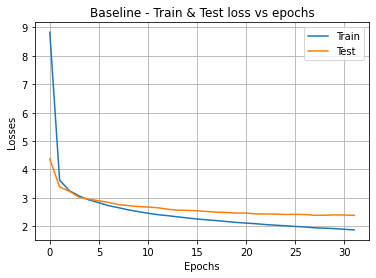

epoch: 32 train loss: 1.8645541010122026 Test loss: 2.3768278428077423


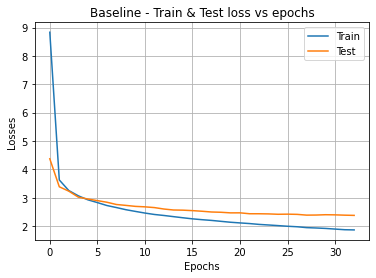

epoch: 33 train loss: 1.844193561721236 Test loss: 2.395492263798216


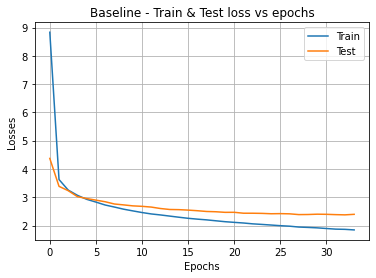

epoch: 34 train loss: 1.8338690440019132 Test loss: 2.361577046289559


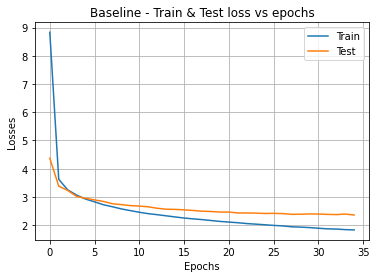

epoch: 35 train loss: 1.8129917377164029 Test loss: 2.3869968431372803


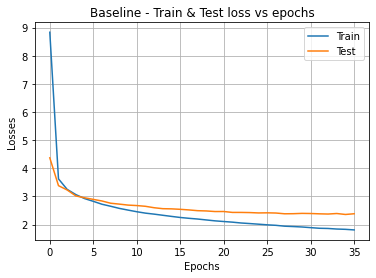

epoch: 36 train loss: 1.7969860055283704 Test loss: 2.376463925138904


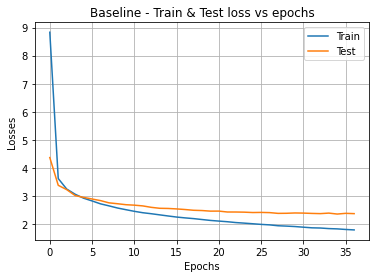

epoch: 37 train loss: 1.7793490843826238 Test loss: 2.3551893782760396


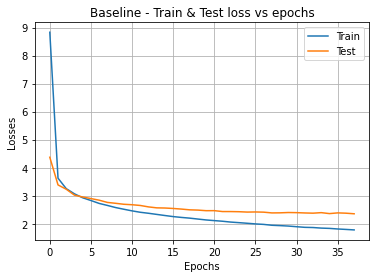

epoch: 38 train loss: 1.7634322888459535 Test loss: 2.359506350756658


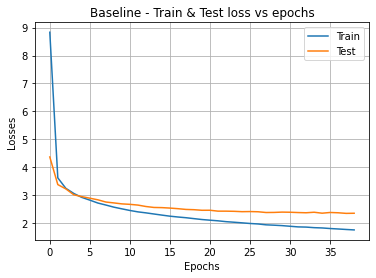

epoch: 39 train loss: 1.745533319050541 Test loss: 2.3542166101004502


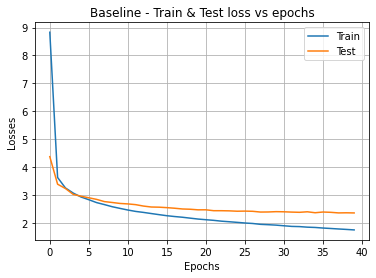

epoch: 40 train loss: 1.7400383292608885 Test loss: 2.3506968892945888


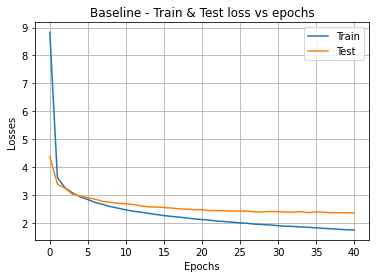

epoch: 41 train loss: 1.7182714154122936 Test loss: 2.346575072617553


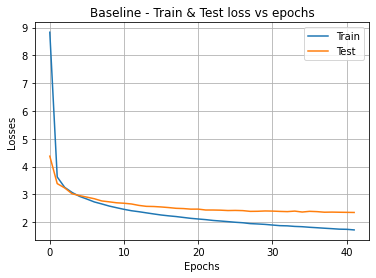

epoch: 42 train loss: 1.7075367733026898 Test loss: 2.340746746051761


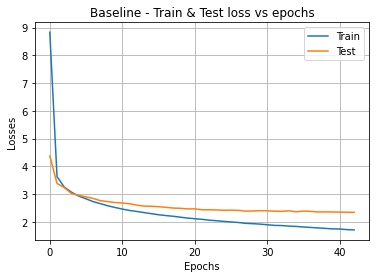

epoch: 43 train loss: 1.6940389312570783 Test loss: 2.331504911854022


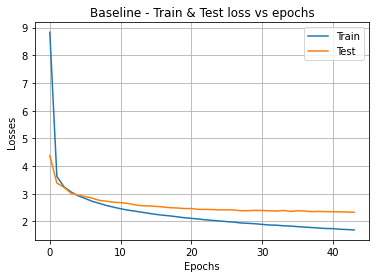

epoch: 44 train loss: 1.6764781140101443 Test loss: 2.342144159198141


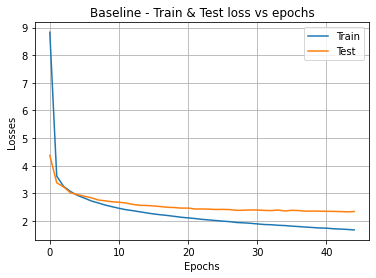

epoch: 45 train loss: 1.6637530544247172 Test loss: 2.3599499350143023


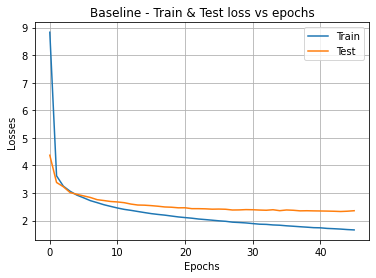

epoch: 46 train loss: 1.65390166037741 Test loss: 2.348415682029548


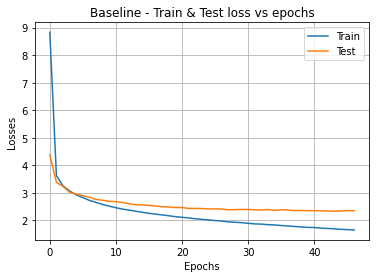

epoch: 47 train loss: 1.634909549230454 Test loss: 2.331032915508215


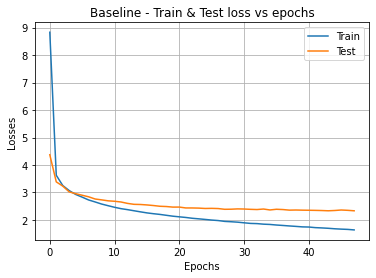

epoch: 48 train loss: 1.625043835188077 Test loss: 2.3398441657155864


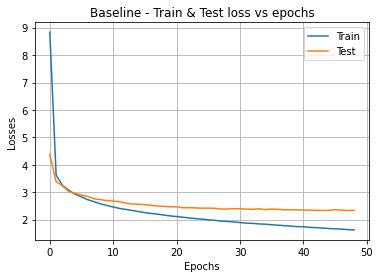

epoch: 49 train loss: 1.6144490758257475 Test loss: 2.352468361935163


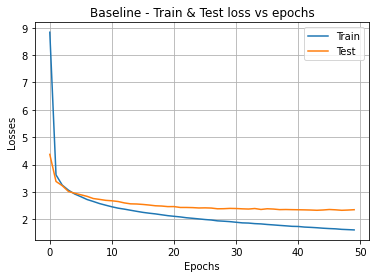

split: 0 test loss: 2.331032915508215
Mean test loss: 2.331032915508215


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[1]

num_epochs = 50
batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval, datetimes_test, images_trainval, images_test, 
                                                         pv_log_trainval, pv_log_test, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

# if split = False, valid_loaders = test_loader

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Baseline - Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()
        
        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

# All Data - ConvGRU (0-2-2) -  Seq len = 2

epoch: 0 train loss: 3.9684015566134194 Test loss: 2.8559503046499684


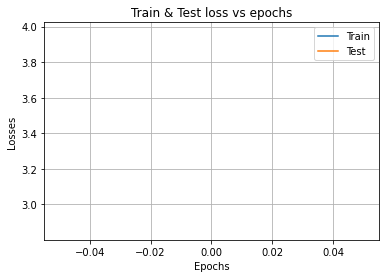

epoch: 1 train loss: 2.5667554625936337 Test loss: 2.552962266461239


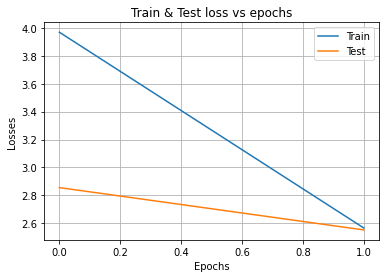

epoch: 2 train loss: 2.3184947910206746 Test loss: 2.4518350899906736


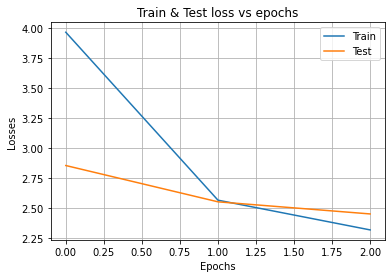

epoch: 3 train loss: 2.167742304489496 Test loss: 2.374085652183636


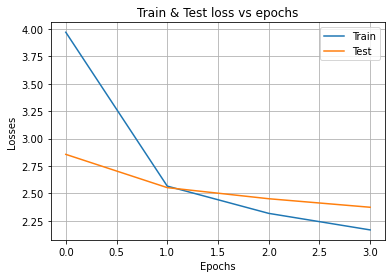

epoch: 4 train loss: 2.060440863838678 Test loss: 2.3319340347053945


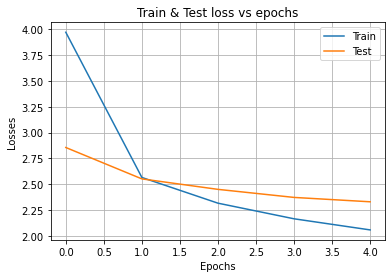

epoch: 5 train loss: 1.966690040968153 Test loss: 2.497439790737315


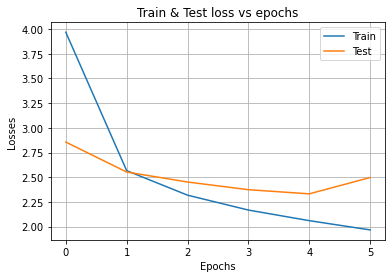

epoch: 6 train loss: 1.8927181859455018 Test loss: 2.3770250193626006


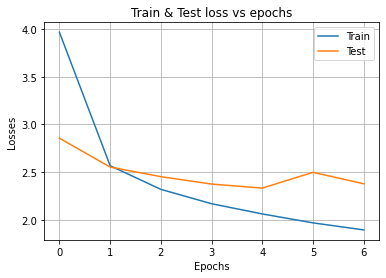

epoch: 7 train loss: 1.8326986210084546 Test loss: 2.346487989661767


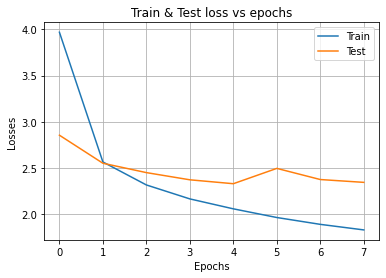

epoch: 8 train loss: 1.7507186993105757 Test loss: 2.4290789497326015


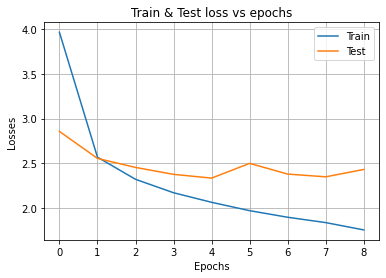

epoch: 9 train loss: 1.7123495482178377 Test loss: 2.3994978739544446


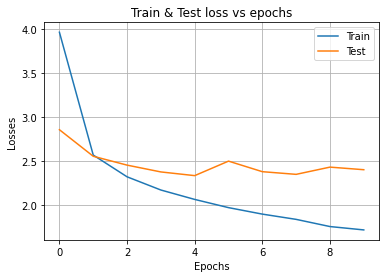

epoch: 10 train loss: 1.6372706347001882 Test loss: 2.503212324507745


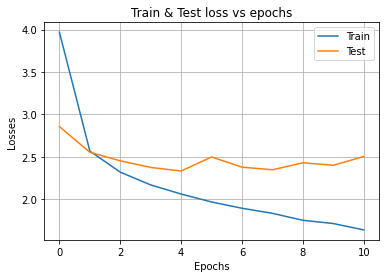

epoch: 11 train loss: 1.5811666055380558 Test loss: 2.579780215185112


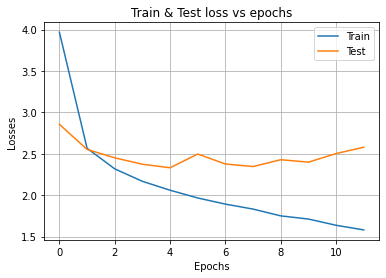

split: 0 test loss: 2.3319340347053945
Mean test loss: 2.3319340347053945


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[4]

num_epochs = 50
batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval, datetimes_test, images_trainval, images_test, 
                                                         pv_log_trainval, pv_log_test, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

# if split = False, valid_loaders = test_loader

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()


        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

# All data - ConvGRU (0-2-2) seq len = 3

3
epoch: 0 train loss: 5.510466355714457 Test loss: 3.31380069210513


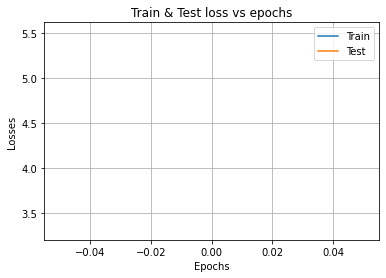

epoch: 1 train loss: 2.891856371809585 Test loss: 3.05875535263816


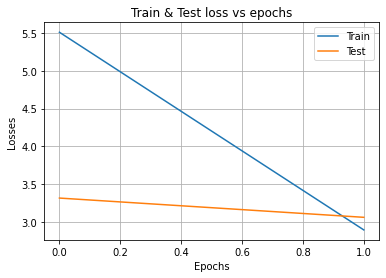

epoch: 2 train loss: 2.6305396871709403 Test loss: 2.7983567884337783


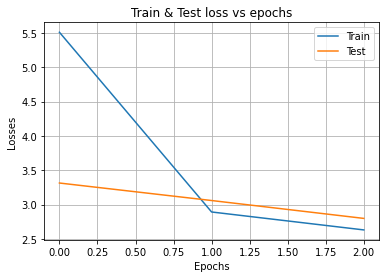

epoch: 3 train loss: 2.460171829904526 Test loss: 2.626426453206987


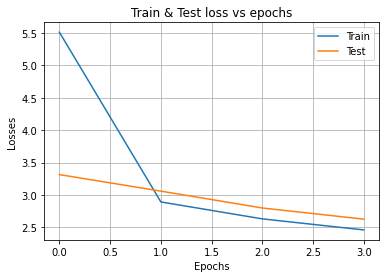

epoch: 4 train loss: 2.3539405018180344 Test loss: 2.5434465463500673


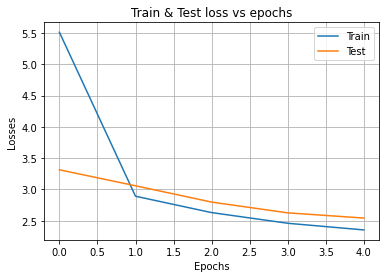

epoch: 5 train loss: 2.257890667313403 Test loss: 2.5266243966574278


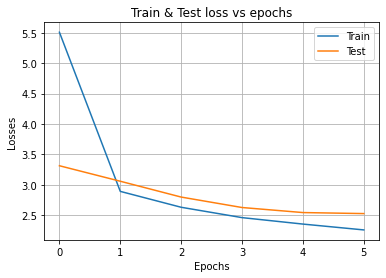

epoch: 6 train loss: 2.183211066943252 Test loss: 2.5635393981768355


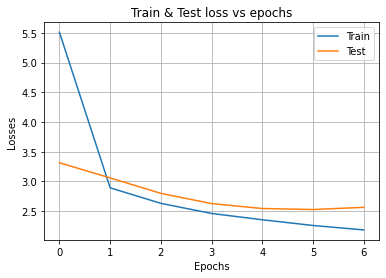

epoch: 7 train loss: 2.1213600882664063 Test loss: 2.415365311109872


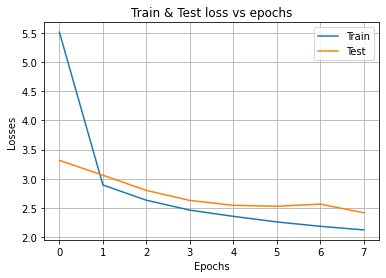

epoch: 8 train loss: 2.07976206487642 Test loss: 2.383272867918112


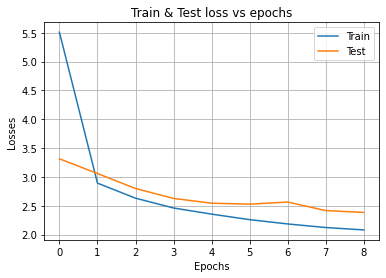

epoch: 9 train loss: 2.026088106726906 Test loss: 2.396489908703125


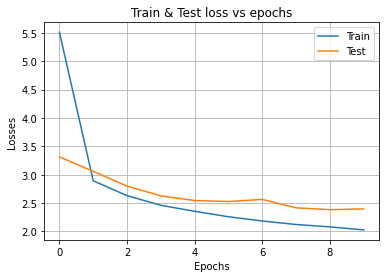

epoch: 10 train loss: 1.977780131745605 Test loss: 2.4253538768809593


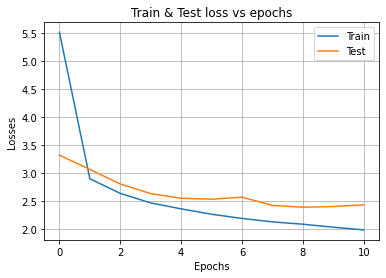

epoch: 11 train loss: 1.923159115389362 Test loss: 2.420578762795378


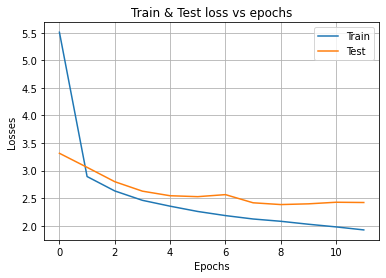

epoch: 12 train loss: 1.8758318092408084 Test loss: 2.387901536413575


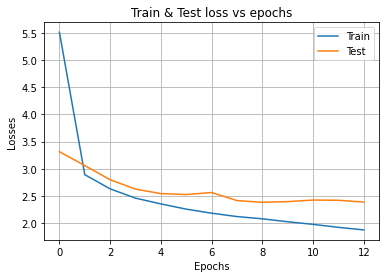

epoch: 13 train loss: 1.84354645962197 Test loss: 2.4357299635616294


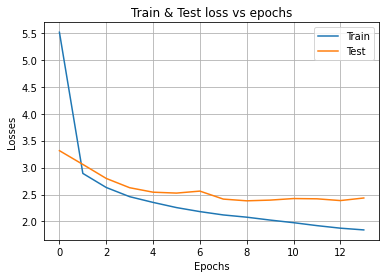

epoch: 14 train loss: 1.8107318176738134 Test loss: 2.3711894623584784


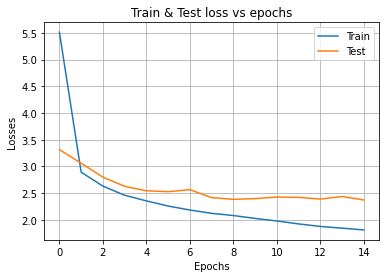

epoch: 15 train loss: 1.7592237867952198 Test loss: 2.3615138981786323


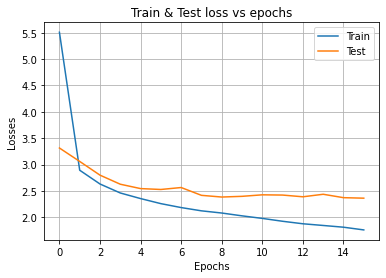

epoch: 16 train loss: 1.7185583713353987 Test loss: 2.397846205978931


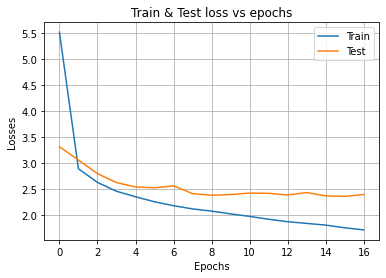

epoch: 17 train loss: 1.6896298215731933 Test loss: 2.366887898824924


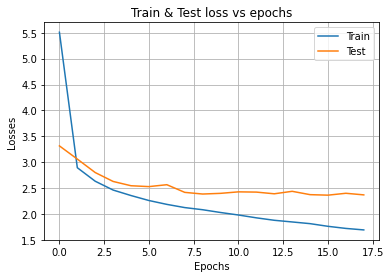

epoch: 18 train loss: 1.6411621508894867 Test loss: 2.4132798982468393


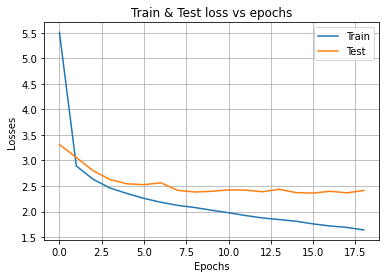

epoch: 19 train loss: 1.62690225315096 Test loss: 2.3990231431286775


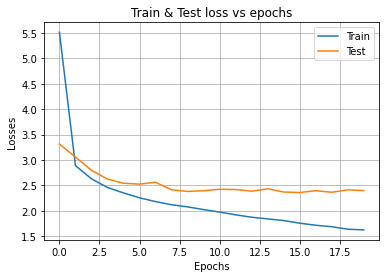

epoch: 20 train loss: 1.5929723961026967 Test loss: 2.4381936269523985


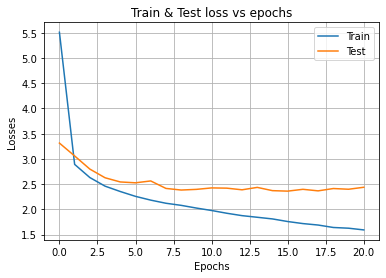

epoch: 21 train loss: 1.5498932657633477 Test loss: 2.4160307292673755


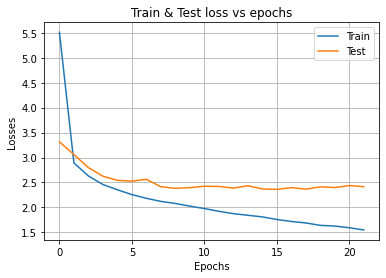

split: 0 test loss: 2.3615138981786323
Mean test loss: 2.3615138981786323


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[5]

print(seq_len)

num_epochs = 50
batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval, datetimes_test, images_trainval, images_test, 
                                                         pv_log_trainval, pv_log_test, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

# Sunny data - SUNSET Architecture

epoch: 0 train loss: 10.511420436139783 Test loss: 4.415275322213784


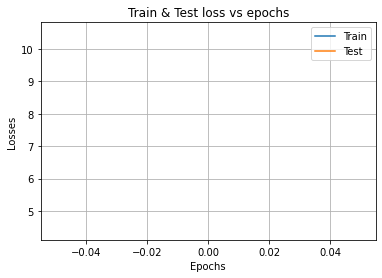

epoch: 1 train loss: 3.3284392297604537 Test loss: 2.521959184676503


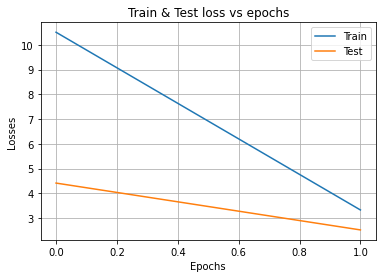

epoch: 2 train loss: 2.69354702159072 Test loss: 2.2423820164592487


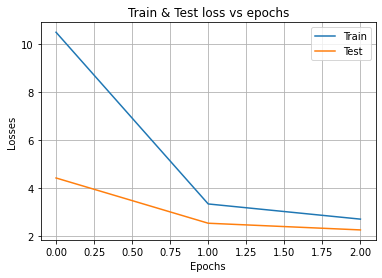

epoch: 3 train loss: 2.4522125804523807 Test loss: 2.009101985112662


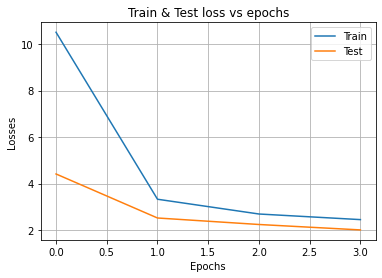

epoch: 4 train loss: 2.286413437777752 Test loss: 1.8319253190182803


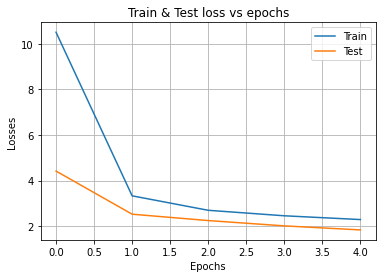

epoch: 5 train loss: 2.167055417243517 Test loss: 1.8113922363455914


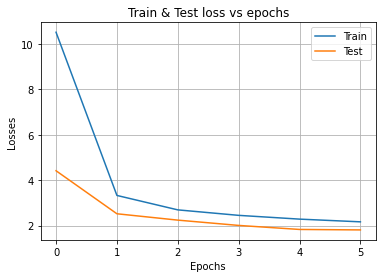

epoch: 6 train loss: 2.092484265179366 Test loss: 1.6709196917791578


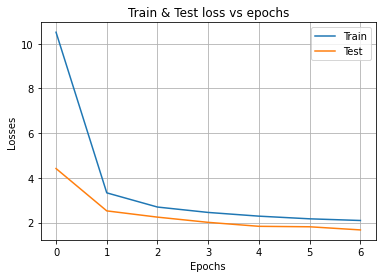

epoch: 7 train loss: 2.0125607808963015 Test loss: 1.6320888010098331


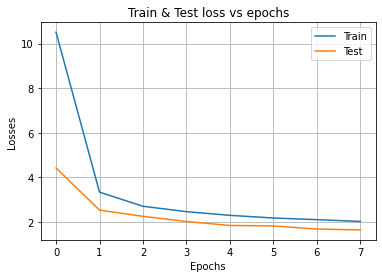

epoch: 8 train loss: 1.958331684248266 Test loss: 1.5329400647541436


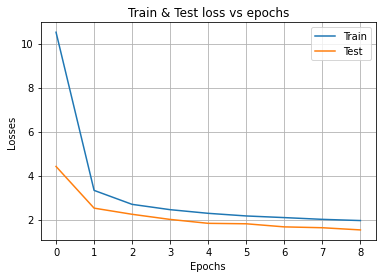

epoch: 9 train loss: 1.9042688749600536 Test loss: 1.4836908297911884


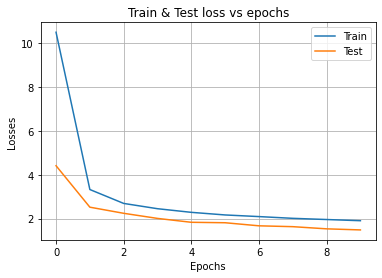

epoch: 10 train loss: 1.8717105539543757 Test loss: 1.4833809363453874


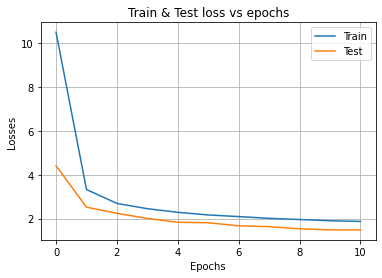

epoch: 11 train loss: 1.8270799548170291 Test loss: 1.4718321274419122


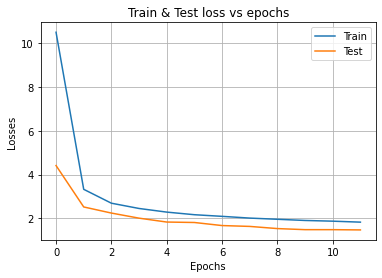

epoch: 12 train loss: 1.7875875061322977 Test loss: 1.436850775985431


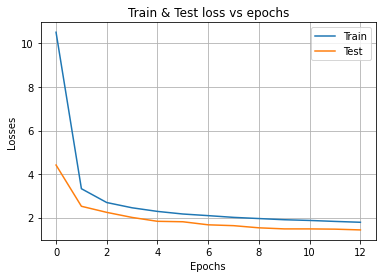

epoch: 13 train loss: 1.766007255616254 Test loss: 1.464943505485372


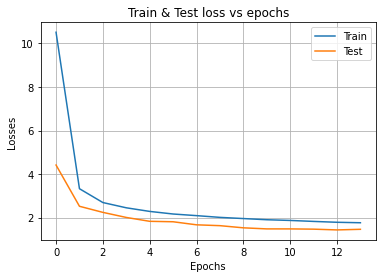

epoch: 14 train loss: 1.7273436976842298 Test loss: 1.4125775260488853


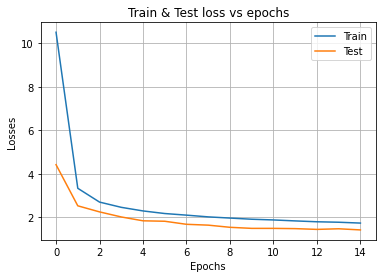

epoch: 15 train loss: 1.7012467038466024 Test loss: 1.4131357145583163


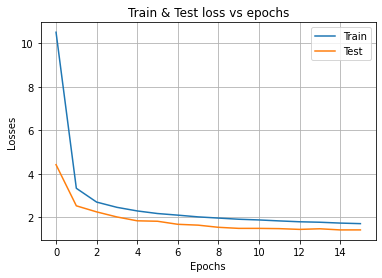

epoch: 16 train loss: 1.676047223552182 Test loss: 1.3915075834300852


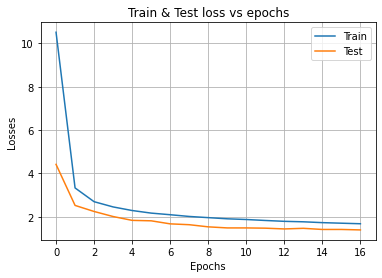

epoch: 17 train loss: 1.6480827087267567 Test loss: 1.405208566910884


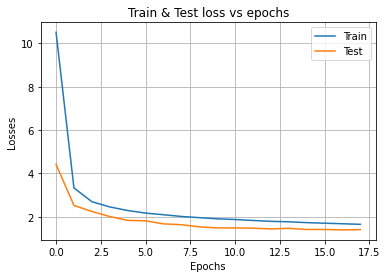

epoch: 18 train loss: 1.6368476162618848 Test loss: 1.3805224371526774


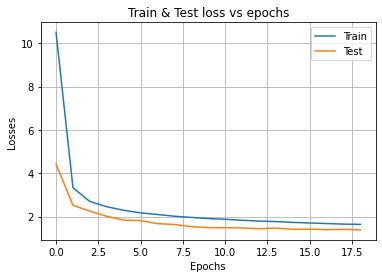

epoch: 19 train loss: 1.6084583330115998 Test loss: 1.3823459057295941


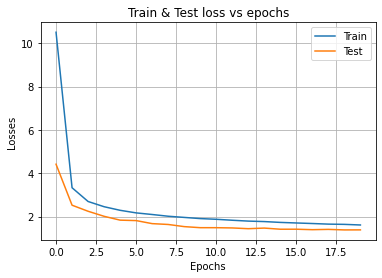

epoch: 20 train loss: 1.585675762963521 Test loss: 1.372015102584592


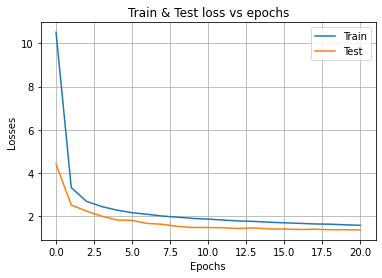

epoch: 21 train loss: 1.5725810502894104 Test loss: 1.3753744950326297


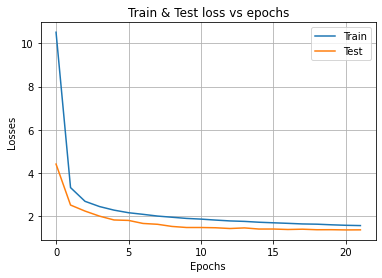

epoch: 22 train loss: 1.5472840217802966 Test loss: 1.376886618811573


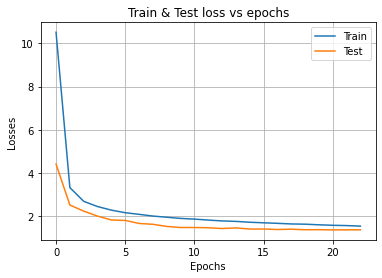

epoch: 23 train loss: 1.527295021301818 Test loss: 1.3709506995387828


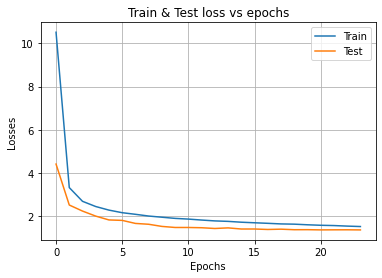

epoch: 24 train loss: 1.516707654895446 Test loss: 1.3954511505274552


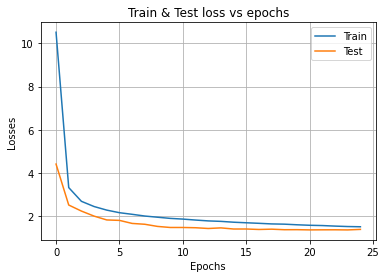

epoch: 25 train loss: 1.5020246598493323 Test loss: 1.3751031483529175


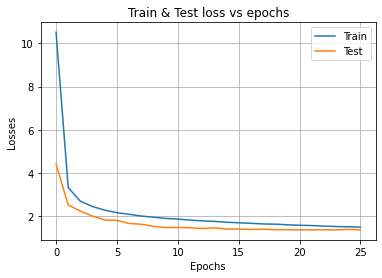

epoch: 26 train loss: 1.4898696330594996 Test loss: 1.3692804668880438


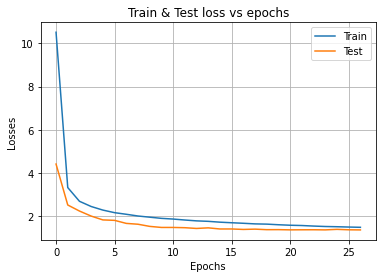

epoch: 27 train loss: 1.4817291126903072 Test loss: 1.3742817969997985


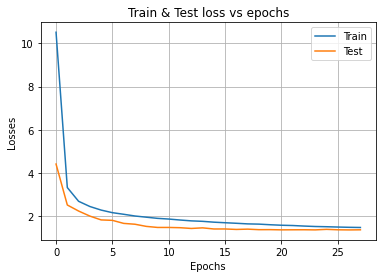

epoch: 28 train loss: 1.4582530104874925 Test loss: 1.363170434872032


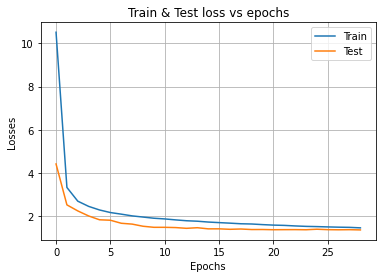

epoch: 29 train loss: 1.4472754635219438 Test loss: 1.3754234650867916


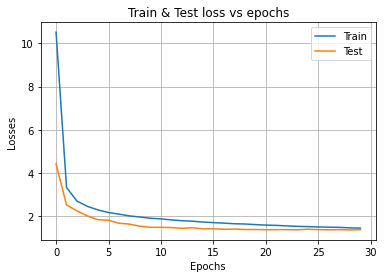

epoch: 30 train loss: 1.4397679494753655 Test loss: 1.3791709071176386


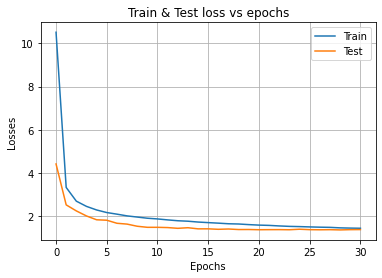

epoch: 31 train loss: 1.4253237303090156 Test loss: 1.3695738083749995


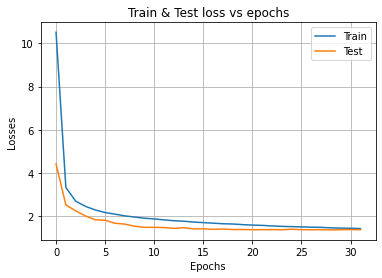

epoch: 32 train loss: 1.4124424845093007 Test loss: 1.3818424542935805


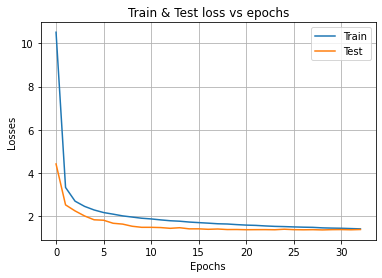

epoch: 33 train loss: 1.403469987545256 Test loss: 1.3642887314487029


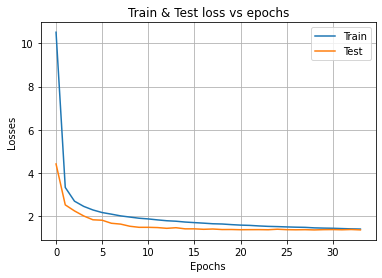

epoch: 34 train loss: 1.3869392112354735 Test loss: 1.3684511140796178


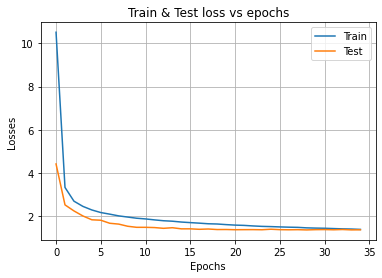

split: 0 test loss: 1.363170434872032
Mean test loss: 1.363170434872032


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[1]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_sunny, datetimes_test_sunny, images_trainval_sunny, images_test_sunny, 
                                                         pv_log_trainval_sunny, pv_log_test_sunny, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

#  Sunny data - ConvGRU (1-1-0) seq len = 2

epoch: 0 train loss: 7.945198367299582 Test loss: 3.9953858749682376


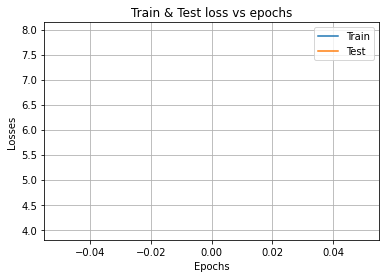

epoch: 1 train loss: 2.9682988607169807 Test loss: 2.6618243704297195


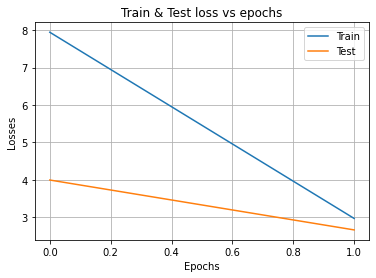

epoch: 2 train loss: 2.3567167977884114 Test loss: 2.3349749575046626


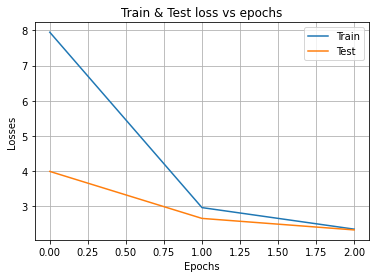

epoch: 3 train loss: 2.1172633920443253 Test loss: 2.1722555871576894


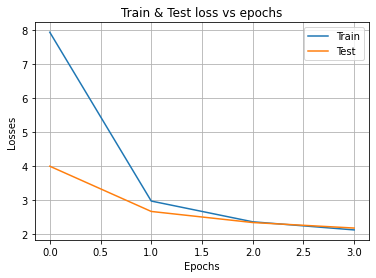

epoch: 4 train loss: 1.965795231984813 Test loss: 2.0323818719914435


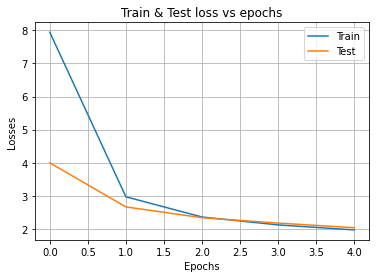

epoch: 5 train loss: 1.853454215401741 Test loss: 1.8674642429619168


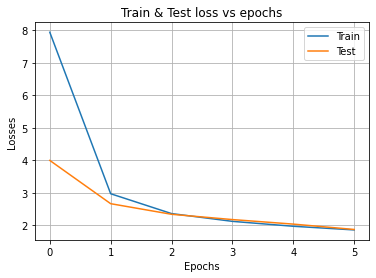

epoch: 6 train loss: 1.7780997276058188 Test loss: 1.8169415771350355


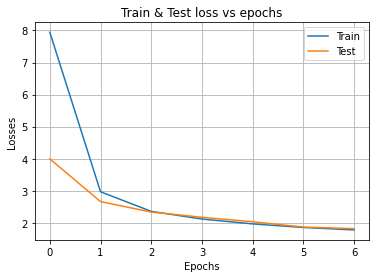

epoch: 7 train loss: 1.7195582318294926 Test loss: 1.7608443621138403


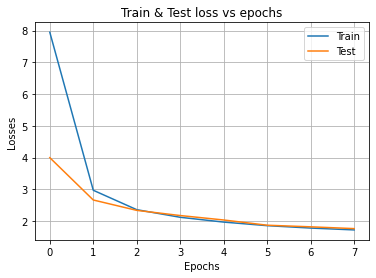

epoch: 8 train loss: 1.6723447453135944 Test loss: 1.699353809190628


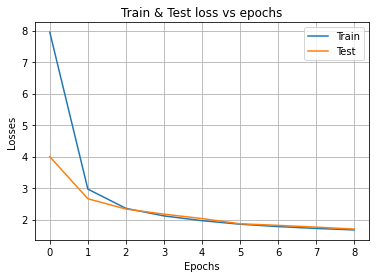

epoch: 9 train loss: 1.6310593079418536 Test loss: 1.6482595726704157


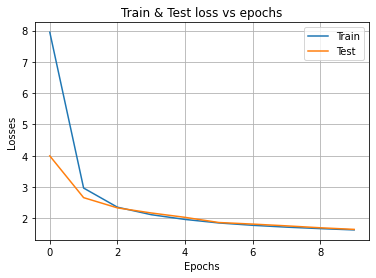

epoch: 10 train loss: 1.5941086976627454 Test loss: 1.6205190971268282


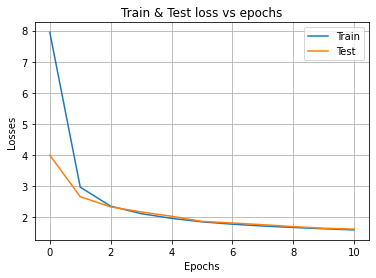

epoch: 11 train loss: 1.5566910602135553 Test loss: 1.5710408210497513


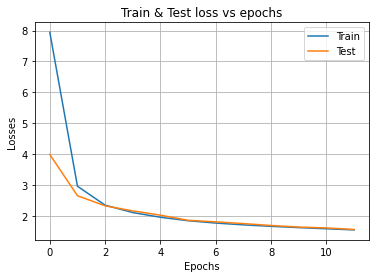

epoch: 12 train loss: 1.5286950158668444 Test loss: 1.5900997210612298


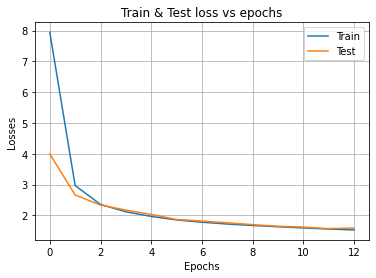

epoch: 13 train loss: 1.5000219186726176 Test loss: 1.5088211180492577


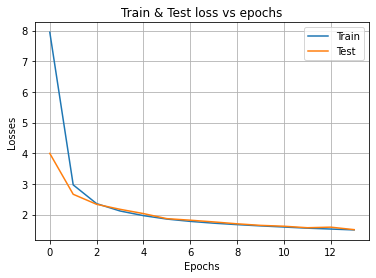

epoch: 14 train loss: 1.475863878841679 Test loss: 1.5574915858250489


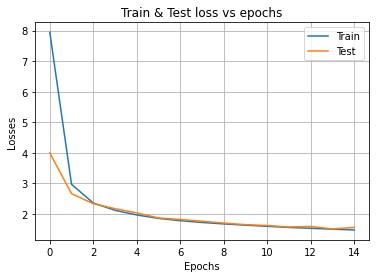

epoch: 15 train loss: 1.45121312261627 Test loss: 1.5195273181468614


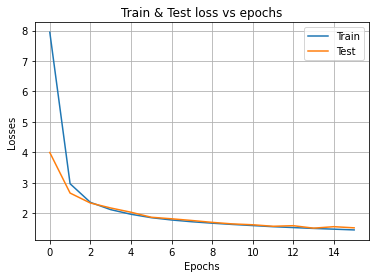

epoch: 16 train loss: 1.4305972593437235 Test loss: 1.4990075553100757


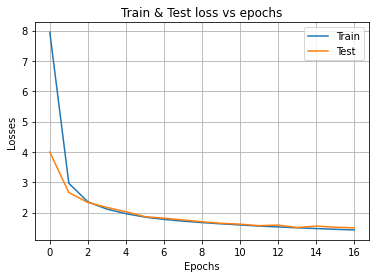

epoch: 17 train loss: 1.4083706629444404 Test loss: 1.4855980955943895


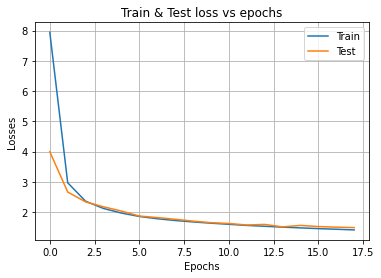

epoch: 18 train loss: 1.3883837639041767 Test loss: 1.4558483142645504


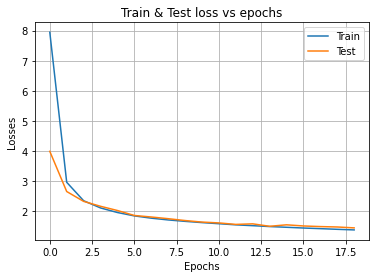

epoch: 19 train loss: 1.372694583950487 Test loss: 1.441440682454417


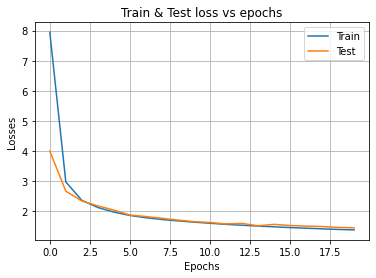

epoch: 20 train loss: 1.365325141924033 Test loss: 1.4096282586700044


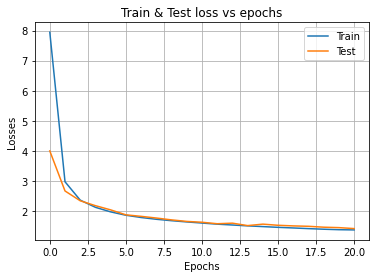

epoch: 21 train loss: 1.3407547269674145 Test loss: 1.4108635271664531


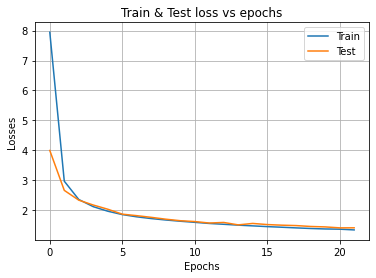

epoch: 22 train loss: 1.3257014641347815 Test loss: 1.3978474684293247


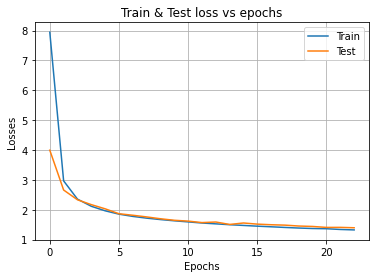

epoch: 23 train loss: 1.3127133926008794 Test loss: 1.3900329306283767


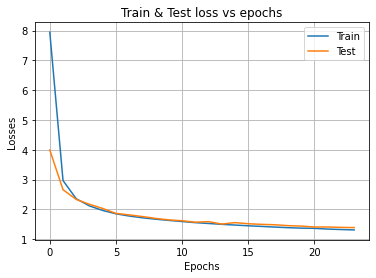

epoch: 24 train loss: 1.3012886878450043 Test loss: 1.3801821775365213


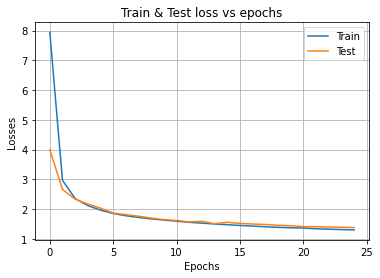

epoch: 25 train loss: 1.2898202486393382 Test loss: 1.3728775579793866


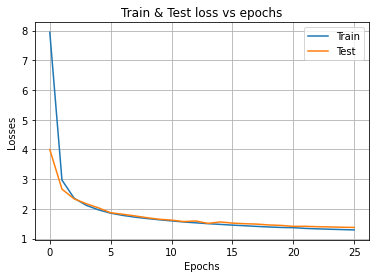

epoch: 26 train loss: 1.275638134180786 Test loss: 1.3940944416828074


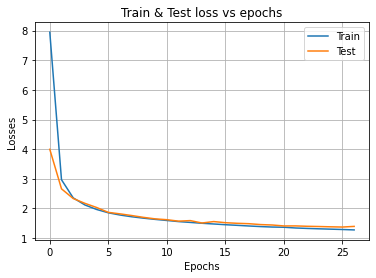

epoch: 27 train loss: 1.2646488257323676 Test loss: 1.3684593275750945


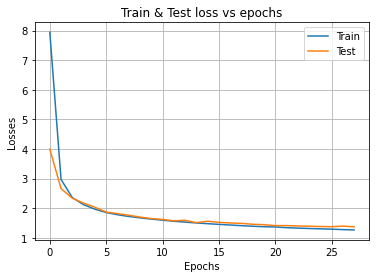

epoch: 28 train loss: 1.2520901518100662 Test loss: 1.35338819523084


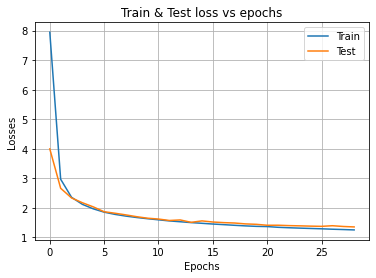

epoch: 29 train loss: 1.238931871782602 Test loss: 1.3495494460548838


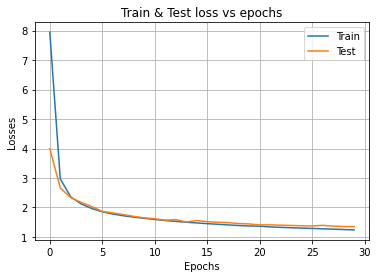

epoch: 30 train loss: 1.2318126452090077 Test loss: 1.3641215432707094


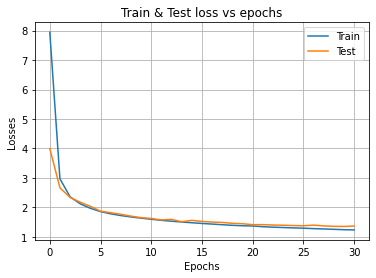

epoch: 31 train loss: 1.223302455245026 Test loss: 1.364845982019326


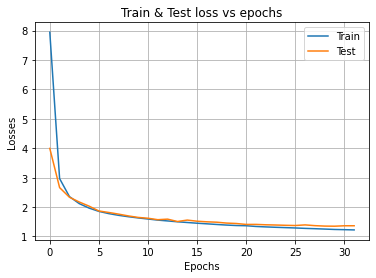

epoch: 32 train loss: 1.213562828518028 Test loss: 1.421132642907057


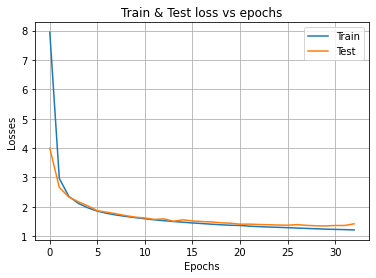

epoch: 33 train loss: 1.2015348334450937 Test loss: 1.3614402239907986


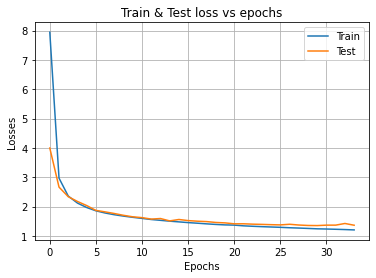

epoch: 34 train loss: 1.1930491240526986 Test loss: 1.3984813967790986


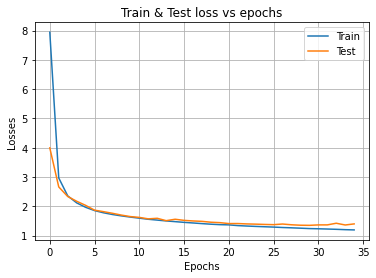

epoch: 35 train loss: 1.185000707281759 Test loss: 1.337632827199256


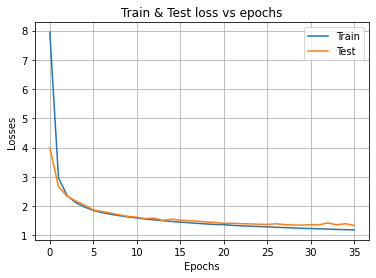

epoch: 36 train loss: 1.1751631577905048 Test loss: 1.349667747206688


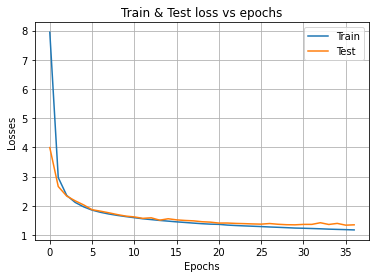

epoch: 37 train loss: 1.1663072715937022 Test loss: 1.3429795015803978


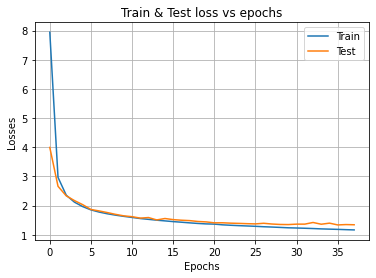

epoch: 38 train loss: 1.159938648767904 Test loss: 1.3345171264612306


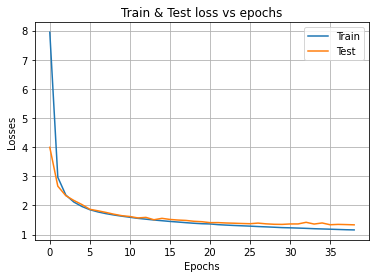

epoch: 39 train loss: 1.1551206137389116 Test loss: 1.3292480779342402


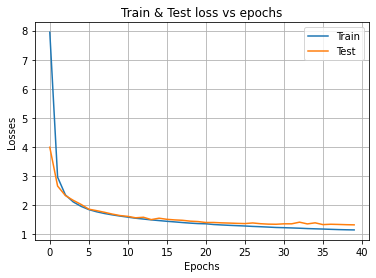

epoch: 40 train loss: 1.1435689263052282 Test loss: 1.3741475327042294


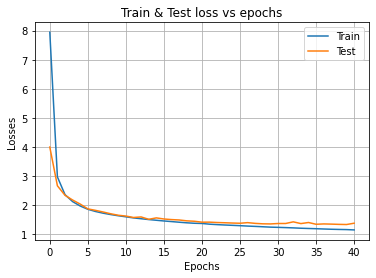

epoch: 41 train loss: 1.1363701212752206 Test loss: 1.3380075728439322


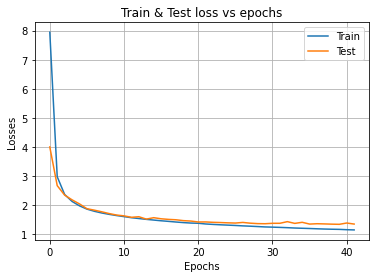

epoch: 42 train loss: 1.132708512148655 Test loss: 1.3200067506192499


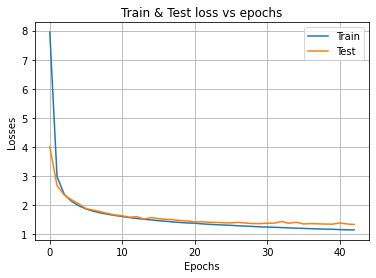

epoch: 43 train loss: 1.12082416641203 Test loss: 1.351443107131092


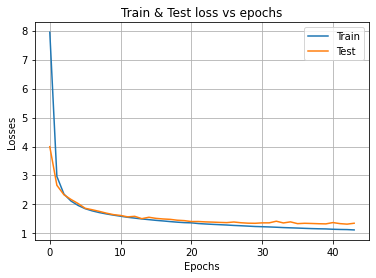

epoch: 44 train loss: 1.116057990928518 Test loss: 1.3304994879136989


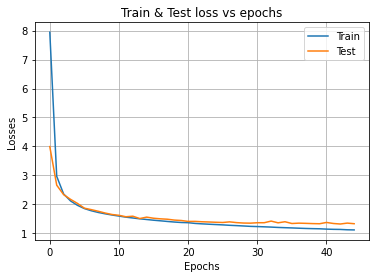

epoch: 45 train loss: 1.1093159550430247 Test loss: 1.337169046068931


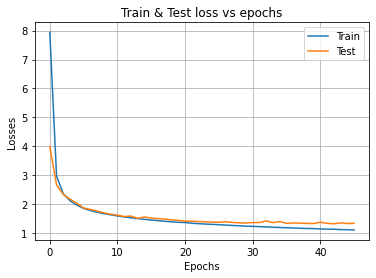

epoch: 46 train loss: 1.1001352015538048 Test loss: 1.3342370165221618


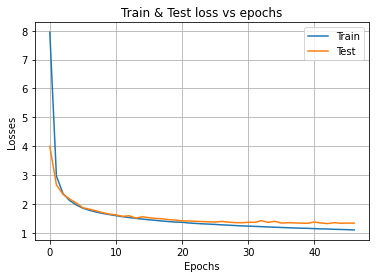

epoch: 47 train loss: 1.0956064944400912 Test loss: 1.3233475478507433


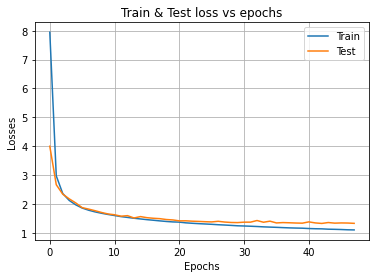

epoch: 48 train loss: 1.0947086336263814 Test loss: 1.3215581004908297


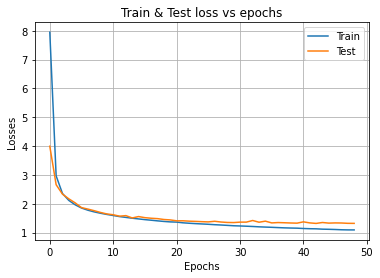

split: 0 test loss: 1.3200067506192499
Mean test loss: 1.3200067506192499


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[13]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_sunny, datetimes_test_sunny, images_trainval_sunny, images_test_sunny, 
                                                         pv_log_trainval_sunny, pv_log_test_sunny, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))

        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

# Cloudy data - ConvGRU (0-3-2) Seq len = 2

epoch: 0 train loss: 7.103996695836042 Test loss: 5.7436501804692295


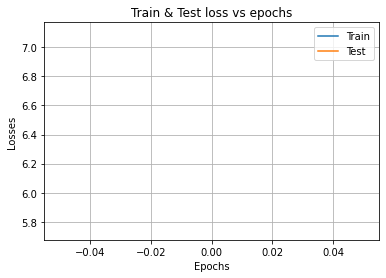

epoch: 1 train loss: 4.380290147142352 Test loss: 4.528527261609094


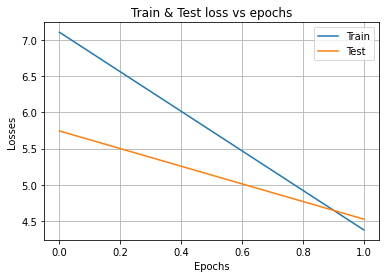

epoch: 2 train loss: 3.852672685140013 Test loss: 4.20386016540135


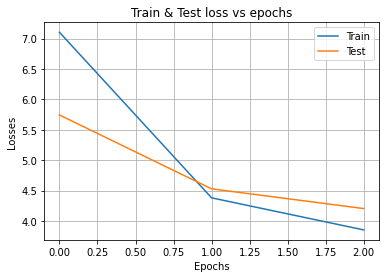

epoch: 3 train loss: 3.598694899738316 Test loss: 4.037992375059253


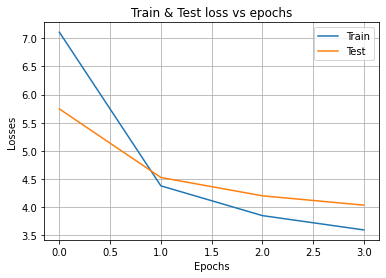

epoch: 4 train loss: 3.367173548994586 Test loss: 3.8695537573309498


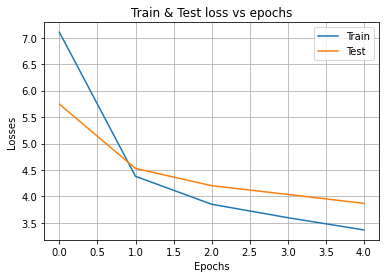

epoch: 5 train loss: 3.2319253935566414 Test loss: 3.8321705549355007


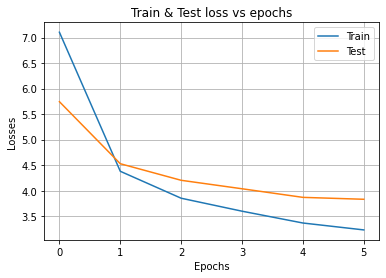

epoch: 6 train loss: 3.107966666720171 Test loss: 3.8101110989706077


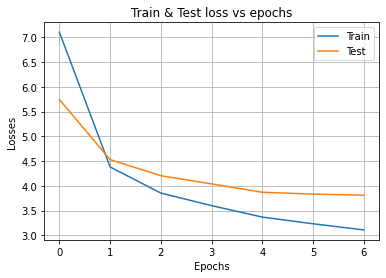

epoch: 7 train loss: 3.0301846201623803 Test loss: 3.7045078057807417


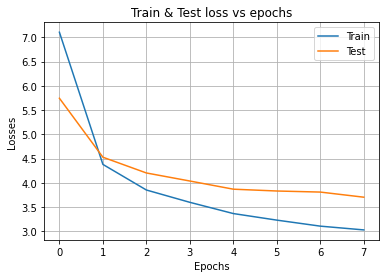

epoch: 8 train loss: 2.9190677110928873 Test loss: 3.783711340379954


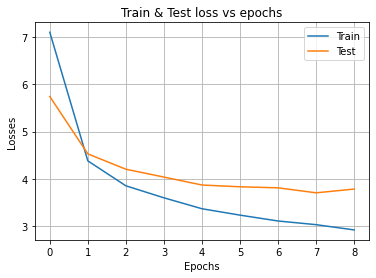

epoch: 9 train loss: 2.8319166084063916 Test loss: 3.5688320638477116


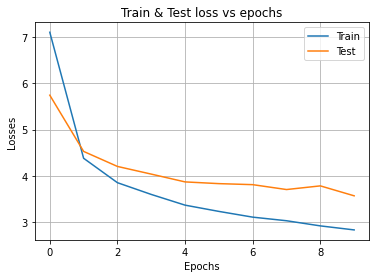

epoch: 10 train loss: 2.733807629538374 Test loss: 3.5788644762442714


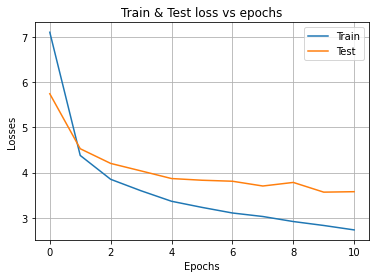

epoch: 11 train loss: 2.6765316674506545 Test loss: 3.6593013525382734


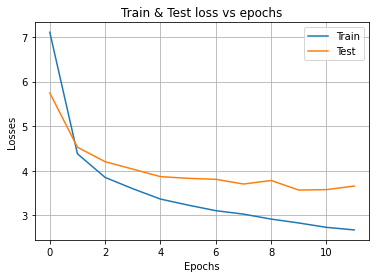

epoch: 12 train loss: 2.604830788420324 Test loss: 3.619119623510066


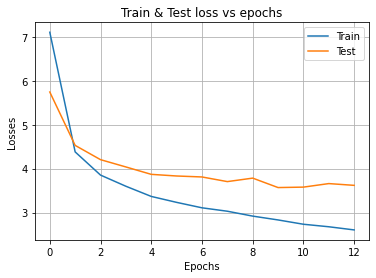

epoch: 13 train loss: 2.5192582463126296 Test loss: 3.7236734094926924


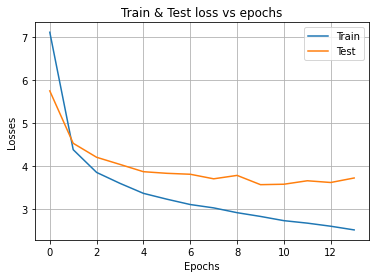

epoch: 14 train loss: 2.420192601433629 Test loss: 3.6828965537823257


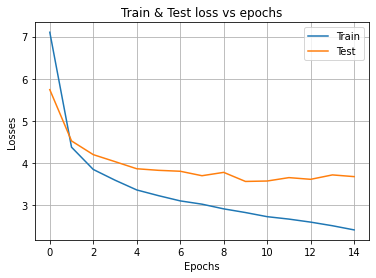

epoch: 15 train loss: 2.3598150955348816 Test loss: 3.7583056933910197


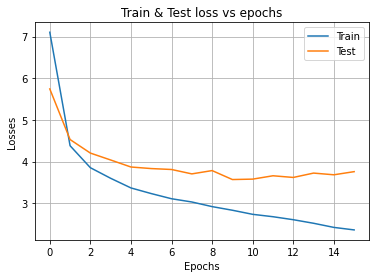

split: 0 test loss: 3.5688320638477116
Mean test loss: 3.5688320638477116


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[7]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_cloudy, datetimes_test_cloudy, images_trainval_cloudy, images_test_cloudy, 
                                                         pv_log_trainval_cloudy, pv_log_test_cloudy, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

epoch: 0 train loss: 8.021305127262208 Test loss: 6.5768028460541945


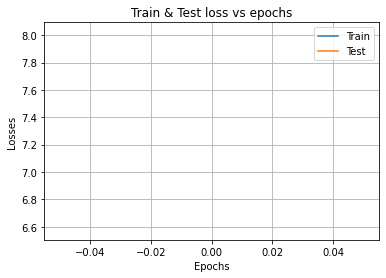

epoch: 1 train loss: 5.134504648097713 Test loss: 5.3401385481474435


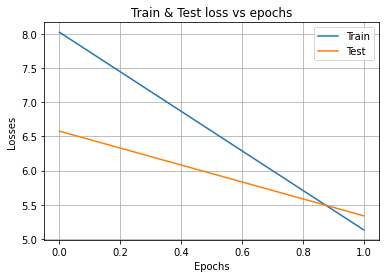

epoch: 2 train loss: 4.451699768079721 Test loss: 4.8274090675734636


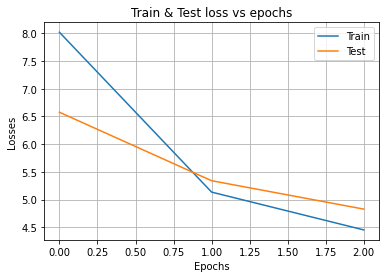

epoch: 3 train loss: 4.128552573933442 Test loss: 4.626198848174186


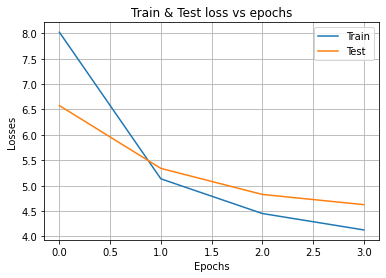

epoch: 4 train loss: 3.9168999593903817 Test loss: 4.442932443449388


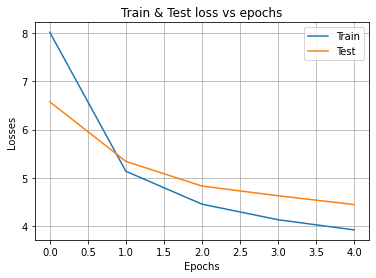

epoch: 5 train loss: 3.732739819254653 Test loss: 4.3406261363912195


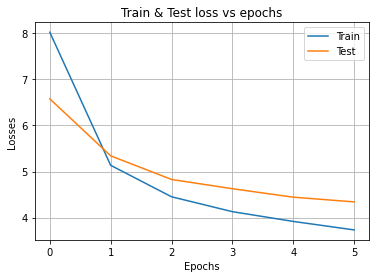

epoch: 6 train loss: 3.597780993796745 Test loss: 4.300125802743202


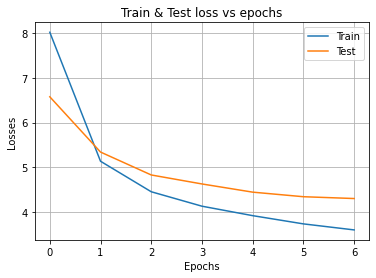

epoch: 7 train loss: 3.4626215698858234 Test loss: 4.182709342502765


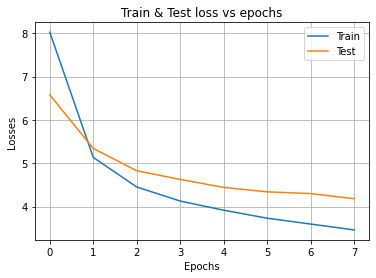

epoch: 8 train loss: 3.370829730855391 Test loss: 4.088461494325206


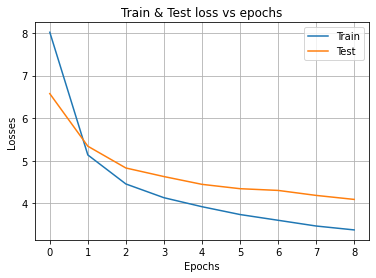

epoch: 9 train loss: 3.2800128364414864 Test loss: 4.021572763198644


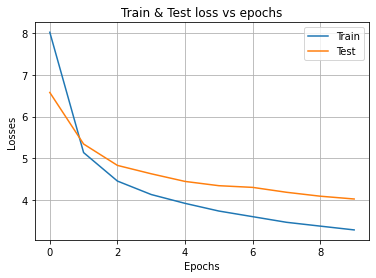

epoch: 10 train loss: 3.198755598083456 Test loss: 3.9560169611155787


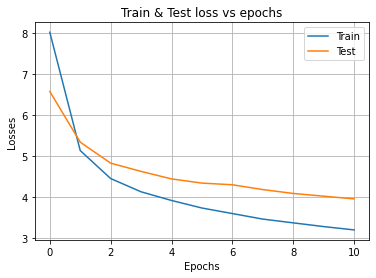

epoch: 11 train loss: 3.132295821514214 Test loss: 3.9238986777480336


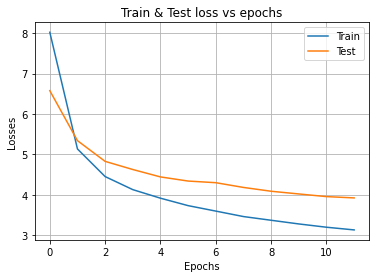

epoch: 12 train loss: 3.0568664811613036 Test loss: 3.8396616879794525


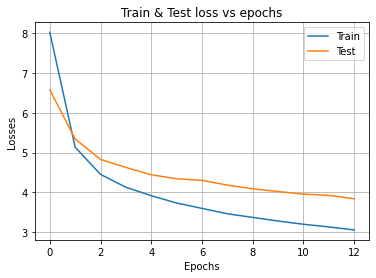

epoch: 13 train loss: 2.978577811185504 Test loss: 3.8006146147505118


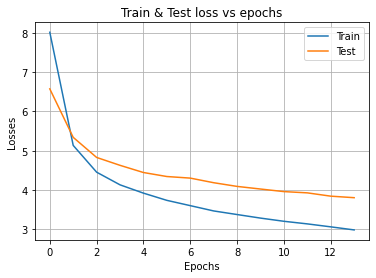

epoch: 14 train loss: 2.9240208422111125 Test loss: 3.834703127965765


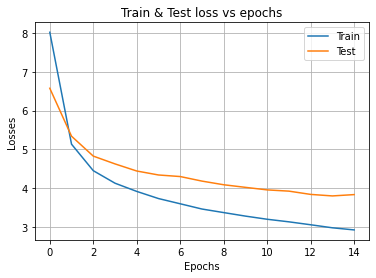

epoch: 15 train loss: 2.8688710873589747 Test loss: 3.7224644661230784


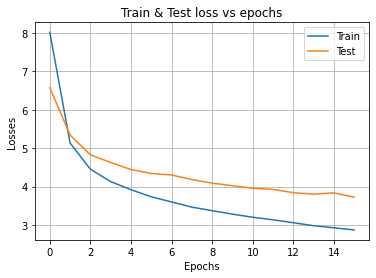

epoch: 16 train loss: 2.7964321254677977 Test loss: 3.748775039235075


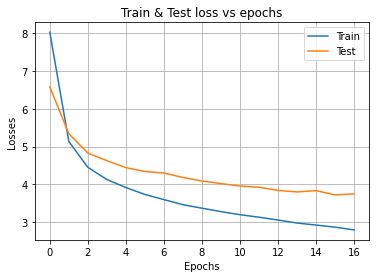

epoch: 17 train loss: 2.7801387885389963 Test loss: 3.69671899578704


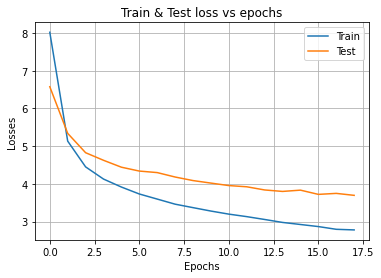

epoch: 18 train loss: 2.7172359672577464 Test loss: 3.7165351431170905


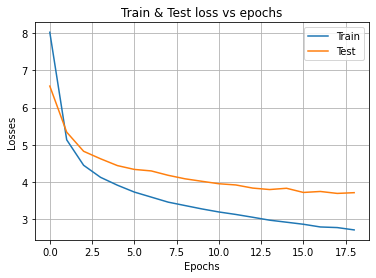

epoch: 19 train loss: 2.665044047008391 Test loss: 3.6943013902789827


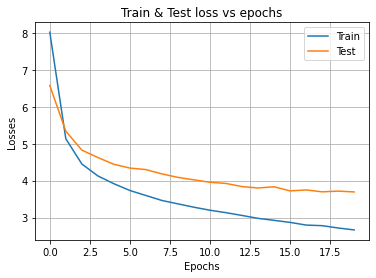

epoch: 20 train loss: 2.609866440228208 Test loss: 3.652730728980509


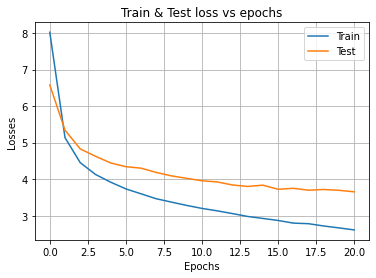

epoch: 21 train loss: 2.586201678631392 Test loss: 3.7291693059705175


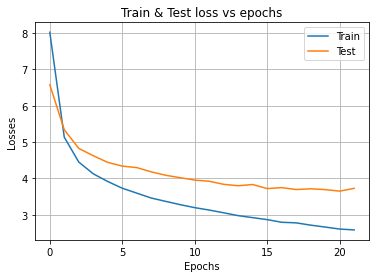

epoch: 22 train loss: 2.5342051397942966 Test loss: 3.6680981308997556


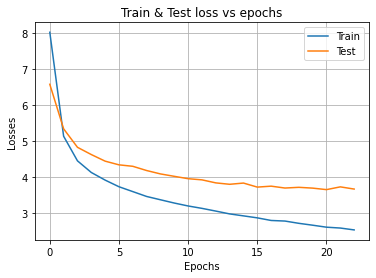

epoch: 23 train loss: 2.4988099349180892 Test loss: 3.7030305169187874


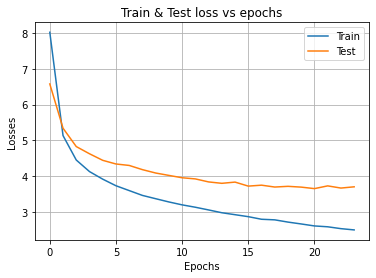

epoch: 24 train loss: 2.4672893417688178 Test loss: 3.6685355380819065


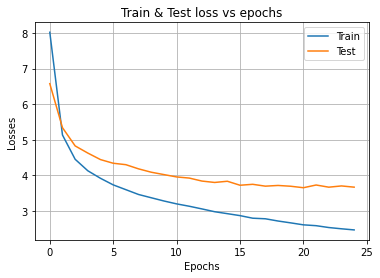

epoch: 25 train loss: 2.4489647160841357 Test loss: 3.707089968659429


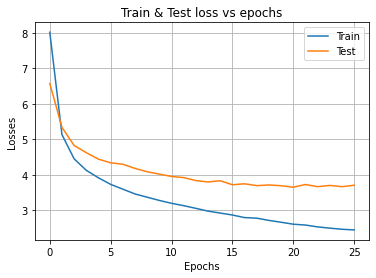

epoch: 26 train loss: 2.36772963008861 Test loss: 3.7585150034717287


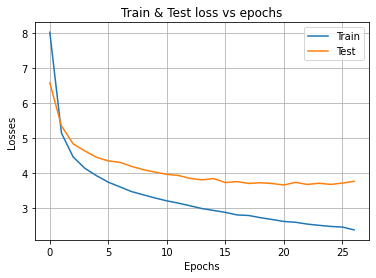

split: 0 test loss: 3.652730728980509
Mean test loss: 3.652730728980509


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[7]

learning_rate = 2e-5

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_cloudy, datetimes_test_cloudy, images_trainval_cloudy, images_test_cloudy, 
                                                         pv_log_trainval_cloudy, pv_log_test_cloudy, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

epoch: 0 train loss: 6.899527013346493 Test loss: 5.583937029367011


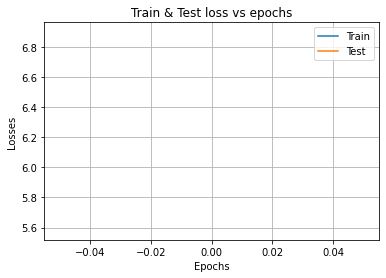

epoch: 1 train loss: 4.349444286849686 Test loss: 4.633995085214636


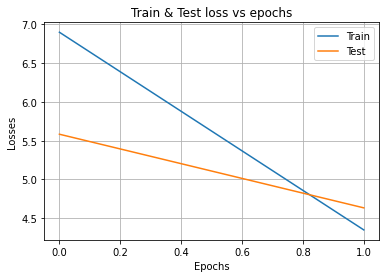

epoch: 2 train loss: 3.857740375846419 Test loss: 4.318744446008117


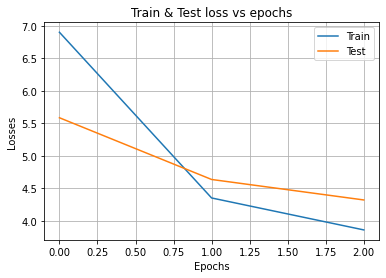

epoch: 3 train loss: 3.5673629626030907 Test loss: 4.046590687953663


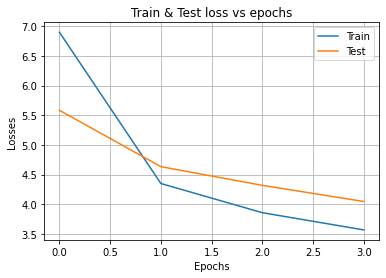

epoch: 4 train loss: 3.3598971465999483 Test loss: 4.003263379047677


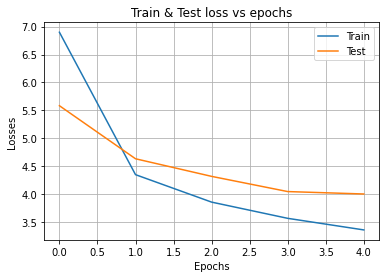

epoch: 5 train loss: 3.2013840023372198 Test loss: 3.7985216550932708


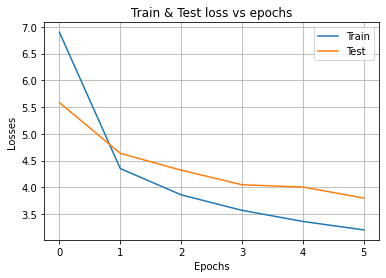

epoch: 6 train loss: 3.0801062341927468 Test loss: 3.8985472541940167


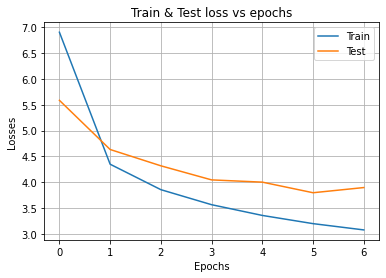

epoch: 7 train loss: 2.9662246380672954 Test loss: 3.68187627287591


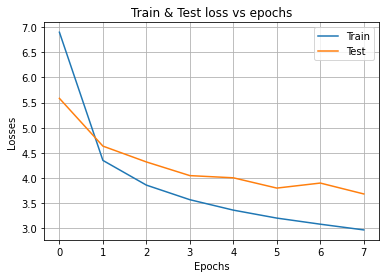

epoch: 8 train loss: 2.8752613169376353 Test loss: 3.7100128770468146


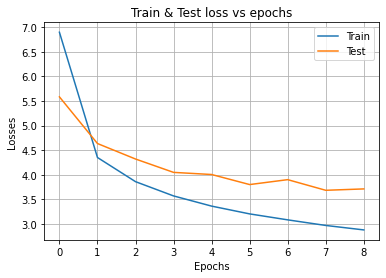

epoch: 9 train loss: 2.744031717380707 Test loss: 3.6424522966050987


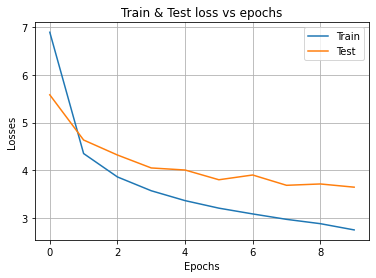

epoch: 10 train loss: 2.652116628598432 Test loss: 3.6846576506321647


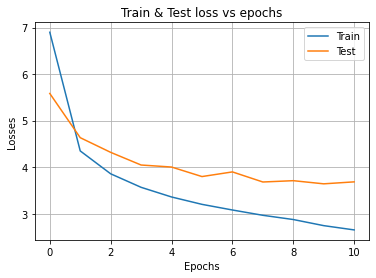

epoch: 11 train loss: 2.6170975497953433 Test loss: 3.8697731094628396


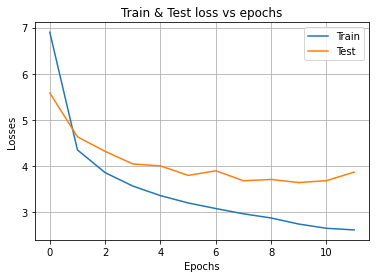

epoch: 12 train loss: 2.4783059122559847 Test loss: 3.812363287035759


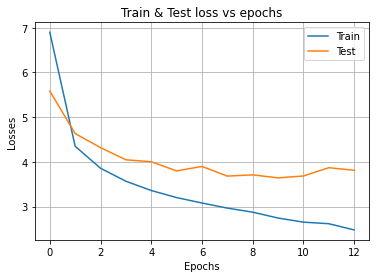

epoch: 13 train loss: 2.4009889523062986 Test loss: 3.6803783383446365


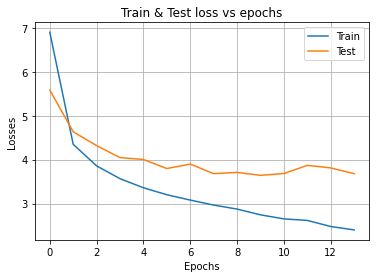

epoch: 14 train loss: 2.3416750996611118 Test loss: 3.7223741710793705


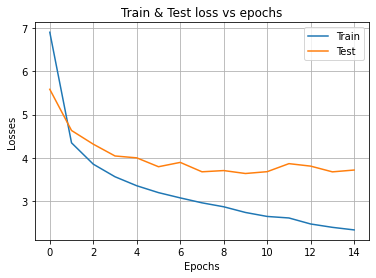

epoch: 15 train loss: 2.242434252487287 Test loss: 3.86444594219575


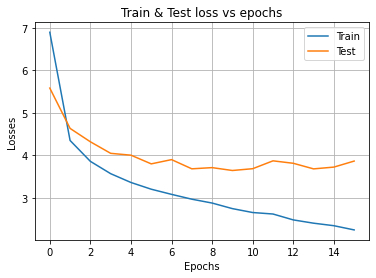

split: 0 test loss: 3.6424522966050987
Mean test loss: 3.6424522966050987


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[7]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_cloudy, datetimes_test_cloudy, images_trainval_cloudy, images_test_cloudy, 
                                                         pv_log_trainval_cloudy, pv_log_test_cloudy, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

# Cloudy data - SUNSET Cloudy architecture (4-0-0)

epoch: 0 train loss: 12.071592151319386 Test loss: 10.450258692928243


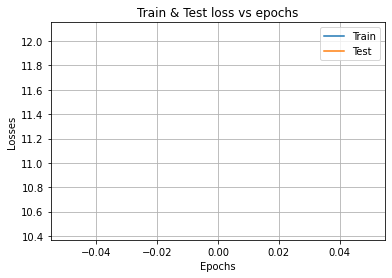

epoch: 1 train loss: 7.732834796860206 Test loss: 7.97295384670788


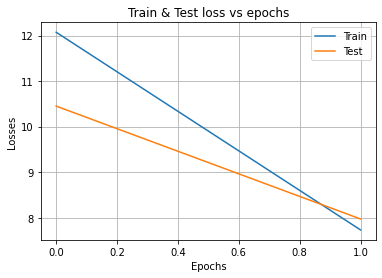

epoch: 2 train loss: 6.145327585652548 Test loss: 7.005955603402764


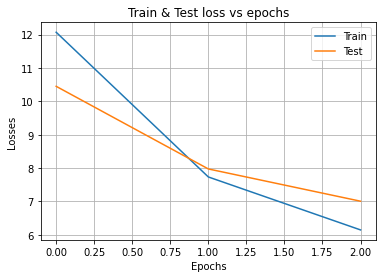

epoch: 3 train loss: 5.544045234120752 Test loss: 6.43747117511789


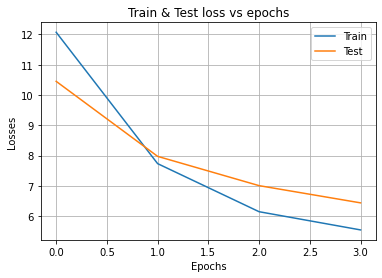

epoch: 4 train loss: 5.122059114743534 Test loss: 5.946616320485049


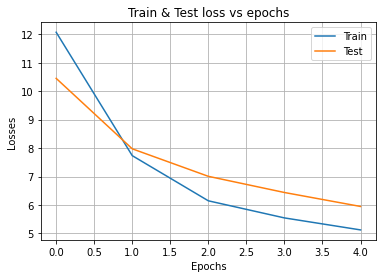

epoch: 5 train loss: 4.756520537910755 Test loss: 5.5218547697771765


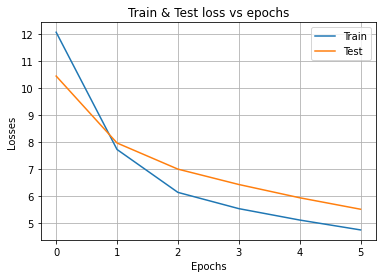

epoch: 6 train loss: 4.452250695570928 Test loss: 5.181799513133973


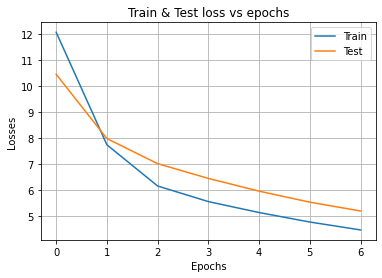

epoch: 7 train loss: 4.225759628797143 Test loss: 4.9350254372294735


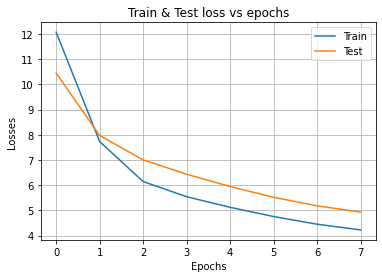

epoch: 8 train loss: 4.058112810106384 Test loss: 4.76517765078156


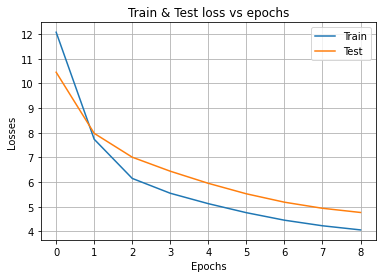

epoch: 9 train loss: 3.932817547967111 Test loss: 4.661059853459887


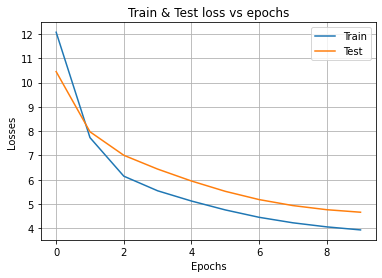

epoch: 10 train loss: 3.8338402959197952 Test loss: 4.566634353738654


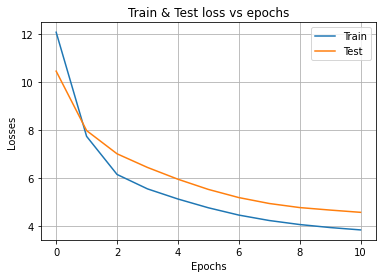

epoch: 11 train loss: 3.7516913196848267 Test loss: 4.487009471690556


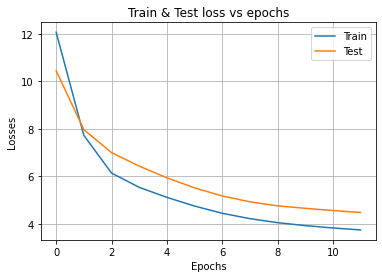

epoch: 12 train loss: 3.6733213269110236 Test loss: 4.429056284430131


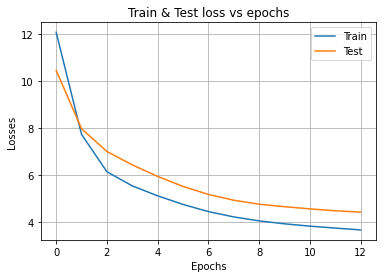

epoch: 13 train loss: 3.6010085407835586 Test loss: 4.372453550089366


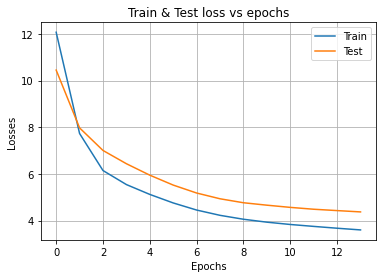

epoch: 14 train loss: 3.5389819970296856 Test loss: 4.323940002737896


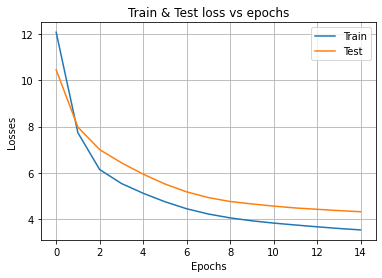

epoch: 15 train loss: 3.4803097458106254 Test loss: 4.294301393021663


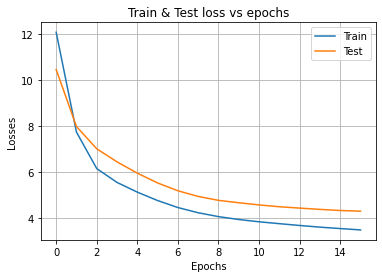

epoch: 16 train loss: 3.4207847206185886 Test loss: 4.246747904130919


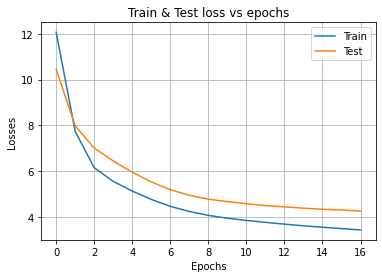

epoch: 17 train loss: 3.3686302478527517 Test loss: 4.23969868070669


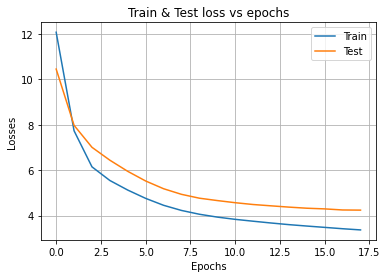

epoch: 18 train loss: 3.320447017500385 Test loss: 4.213201718700652


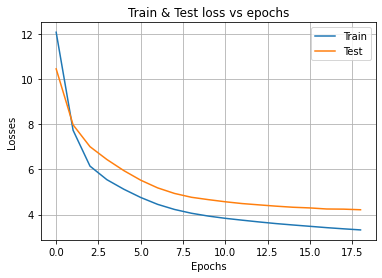

epoch: 19 train loss: 3.2785128886351824 Test loss: 4.186768894326302


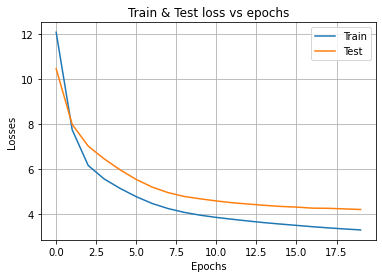

epoch: 20 train loss: 3.2297292408387555 Test loss: 4.1952586133407435


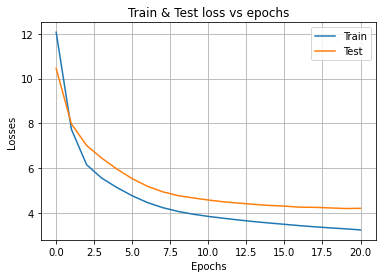

epoch: 21 train loss: 3.1882582226067493 Test loss: 4.162293230872123


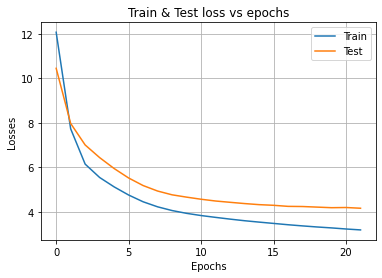

epoch: 22 train loss: 3.1492884457426022 Test loss: 4.145984920453117


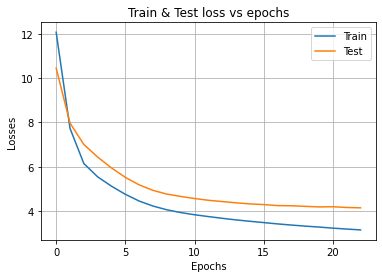

epoch: 23 train loss: 3.1071750920625836 Test loss: 4.133691605959685


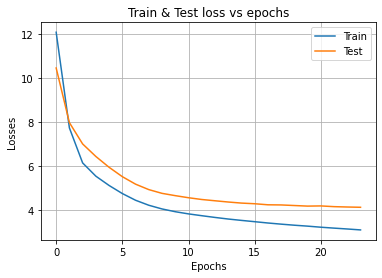

epoch: 24 train loss: 3.068685947836394 Test loss: 4.109737189443041


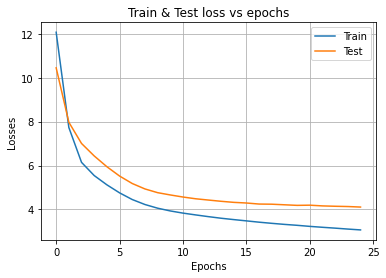

epoch: 25 train loss: 3.0286405820079922 Test loss: 4.126916745609145


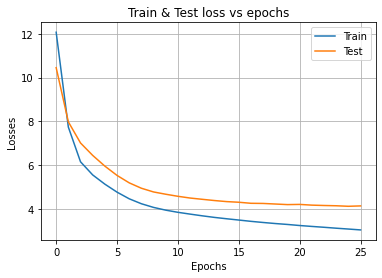

epoch: 26 train loss: 2.992899869066151 Test loss: 4.087052737592924


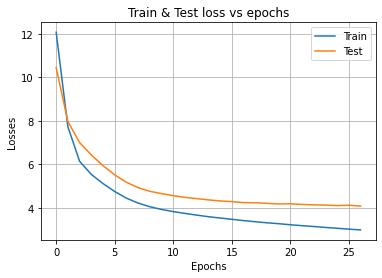

epoch: 27 train loss: 2.9648353259239673 Test loss: 4.088894133348369


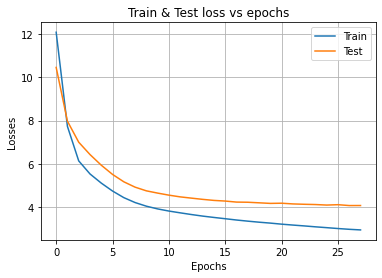

epoch: 28 train loss: 2.9317895214626133 Test loss: 4.0901082323777675


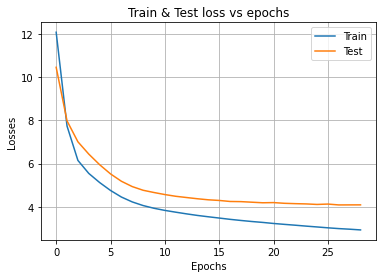

epoch: 29 train loss: 2.894593812551473 Test loss: 4.102749852808897


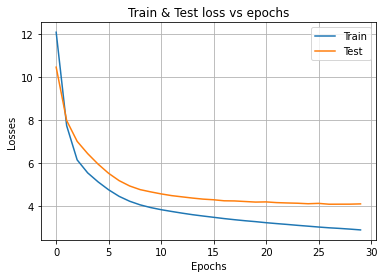

epoch: 30 train loss: 2.8698277176271785 Test loss: 4.081839553094589


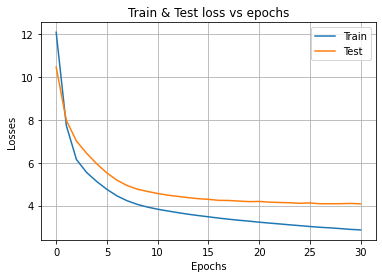

epoch: 31 train loss: 2.842659435082223 Test loss: 4.084358701075689


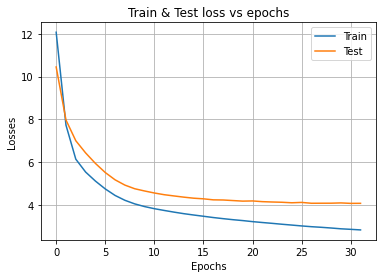

epoch: 32 train loss: 2.810005878563587 Test loss: 4.0616768634433615


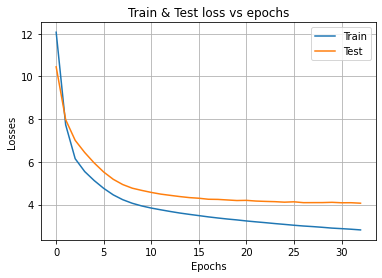

epoch: 33 train loss: 2.7798530104160464 Test loss: 4.066645550595808


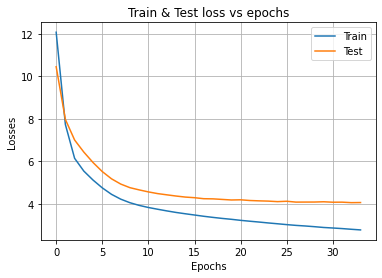

epoch: 34 train loss: 2.7526514750011994 Test loss: 4.0490090574561926


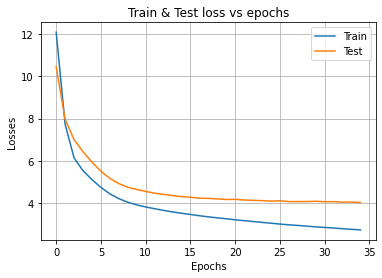

epoch: 35 train loss: 2.718602848458343 Test loss: 4.054628729531618


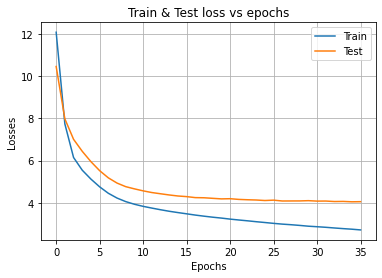

epoch: 36 train loss: 2.6915473463865336 Test loss: 4.047333471018897


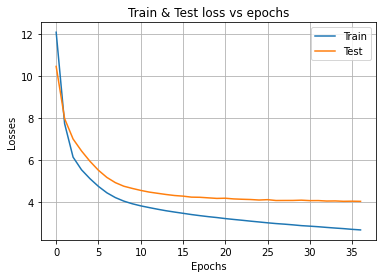

epoch: 37 train loss: 2.665545520123753 Test loss: 4.059255749363642


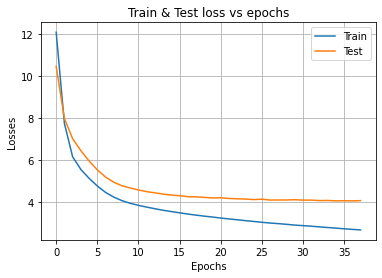

epoch: 38 train loss: 2.638305686737318 Test loss: 4.03888096651368


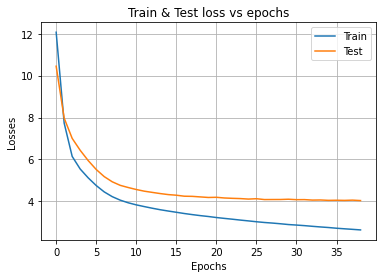

epoch: 39 train loss: 2.6197959882080806 Test loss: 4.024398489139587


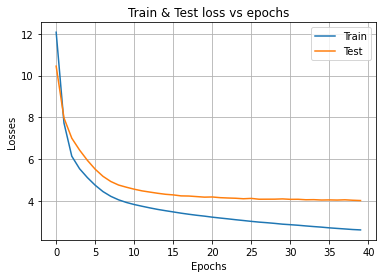

epoch: 40 train loss: 2.5878809618060696 Test loss: 4.031439430778755


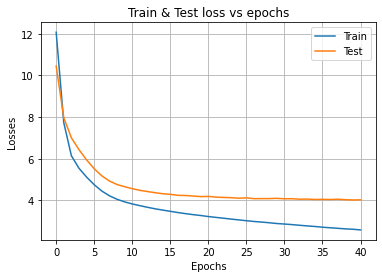

epoch: 41 train loss: 2.560924041688967 Test loss: 4.034628486123186


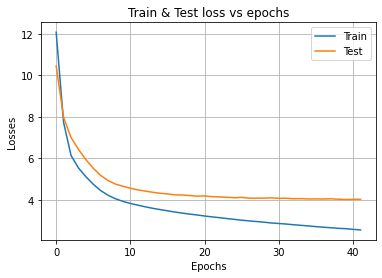

epoch: 42 train loss: 2.537805808442309 Test loss: 4.043209153412735


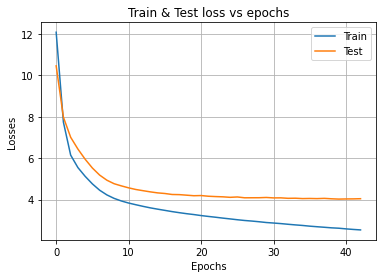

epoch: 43 train loss: 2.5148989998729423 Test loss: 4.085947003785597


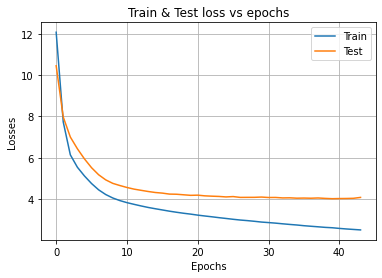

epoch: 44 train loss: 2.492599973078512 Test loss: 4.047353003309993


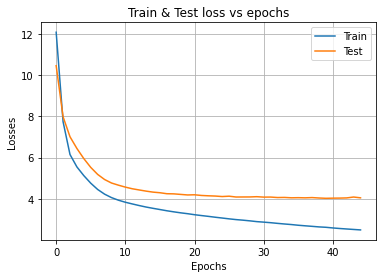

epoch: 45 train loss: 2.468198139163764 Test loss: 4.069120832601649


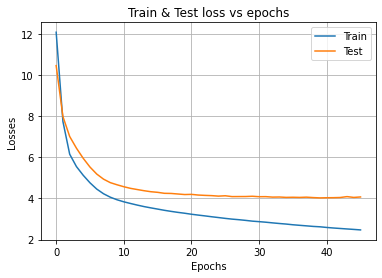

split: 0 test loss: 4.024398489139587
Mean test loss: 4.024398489139587


In [ ]:
seq_len = 1
num_epochs = 100
learning_rate = 3e-6
learning_rate = 1e-5
batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_Cloudy().to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_cloudy, datetimes_test_cloudy, images_trainval_cloudy, images_test_cloudy, 
                                                         pv_log_trainval_cloudy, pv_log_test_cloudy, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)): 
   
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

In [ ]:
seq_len, num_epochs, learning_rate, learning_rate, conv_layers, convGRU_layers, fc_layers, title = configs[1]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_Cloudy().to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_cloudy, datetimes_test_cloudy, images_trainval_cloudy, images_test_cloudy, 
                                                         pv_log_trainval_cloudy, pv_log_test_cloudy, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' valid loss: ' + str(Valid_losses[-1]) )
        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

epoch: 0 train loss: 13.911405969351074 valid loss: 13.403866727006758
epoch: 1 train loss: 11.815471930889649 valid loss: 11.550013060200488
epoch: 2 train loss: 10.014104117215117 valid loss: 10.064509017420692
epoch: 3 train loss: 8.610998816293876 valid loss: 8.990603103433738
epoch: 4 train loss: 7.606979987019564 valid loss: 8.242775357846098
epoch: 5 train loss: 6.912843004280149 valid loss: 7.716985347753692
epoch: 6 train loss: 6.440950453361969 valid loss: 7.352576924401632
epoch: 7 train loss: 6.115166662927609 valid loss: 7.058017439307612
epoch: 8 train loss: 5.873514681090438 valid loss: 6.8260420820438625
epoch: 9 train loss: 5.672200856975657 valid loss: 6.629594703823261
epoch: 10 train loss: 5.499185089087835 valid loss: 6.4264912792759885
epoch: 11 train loss: 5.335905298698519 valid loss: 6.240807852409227
epoch: 12 train loss: 5.181556191267301 valid loss: 6.060029062074113
epoch: 13 train loss: 5.03540431089321 valid loss: 5.892599566120304
epoch: 14 train loss: 4

# Cloudy data - SUNSET architecture (2-0-2)

epoch: 0 train loss: 12.031432836043471 Test loss: 8.775601166353033


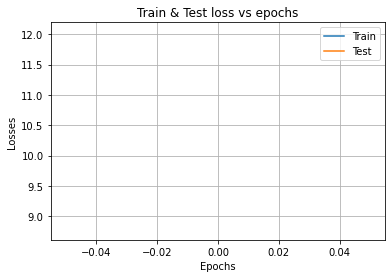

epoch: 1 train loss: 6.962871443202632 Test loss: 7.439426547789923


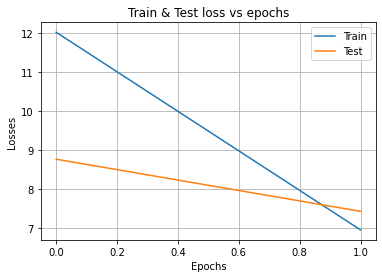

epoch: 2 train loss: 5.969291356232183 Test loss: 6.8332867236873085


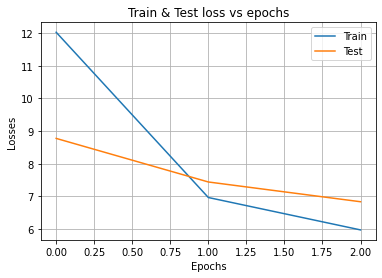

epoch: 3 train loss: 5.416695364817788 Test loss: 6.241239355384822


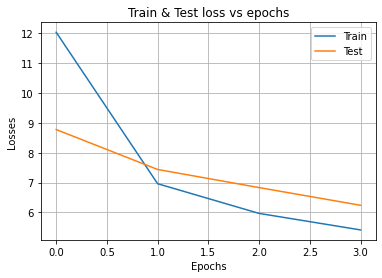

epoch: 4 train loss: 5.003147902360479 Test loss: 5.737215174618675


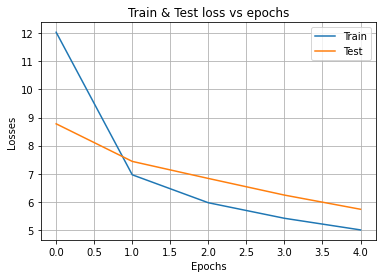

epoch: 5 train loss: 4.674636748369879 Test loss: 5.375160220335949


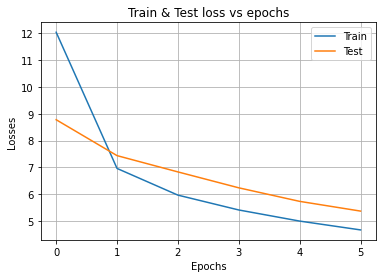

epoch: 6 train loss: 4.431594516504965 Test loss: 5.154037413072154


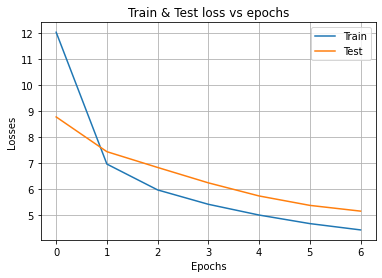

epoch: 7 train loss: 4.279066737903019 Test loss: 4.9827746758178755


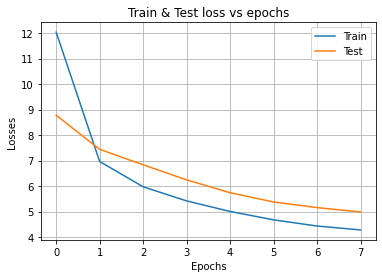

epoch: 8 train loss: 4.126275861948479 Test loss: 4.860737788089171


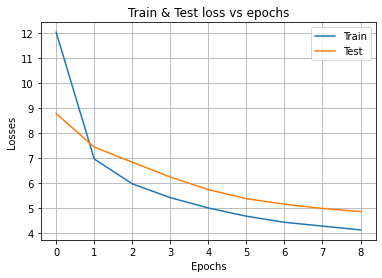

epoch: 9 train loss: 4.029021401735998 Test loss: 4.768071422298614


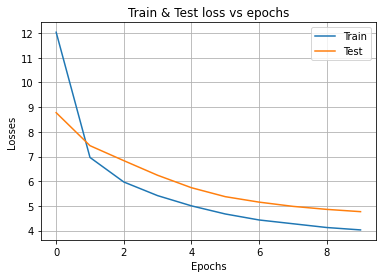

epoch: 10 train loss: 3.9250125796669804 Test loss: 4.666711231238401


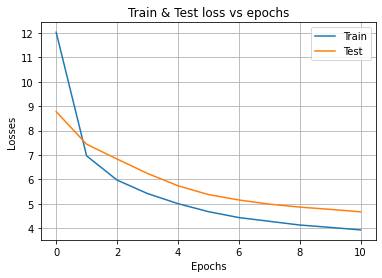

epoch: 11 train loss: 3.8426896318326973 Test loss: 4.610465170997341


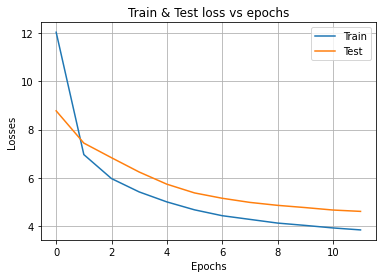

epoch: 12 train loss: 3.7600200210677706 Test loss: 4.5341954347831654


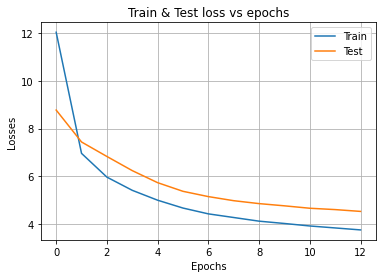

epoch: 13 train loss: 3.698862613485644 Test loss: 4.4711757965374614


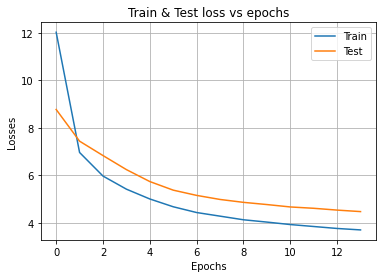

epoch: 14 train loss: 3.651348186716818 Test loss: 4.453985993349638


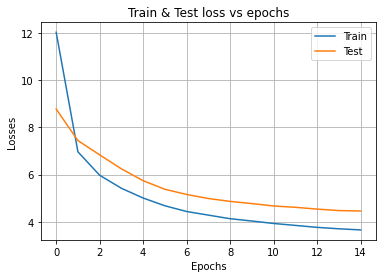

epoch: 15 train loss: 3.5875614828739266 Test loss: 4.411292959270635


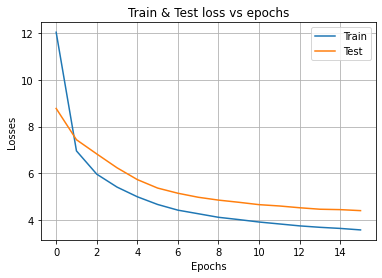

epoch: 16 train loss: 3.5490341533621854 Test loss: 4.359000941337618


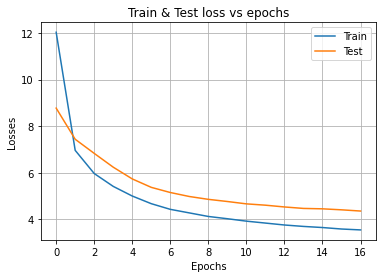

epoch: 17 train loss: 3.504522653625733 Test loss: 4.2945992630169405


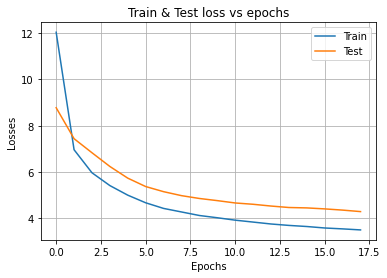

epoch: 18 train loss: 3.453807578017533 Test loss: 4.2568383431263


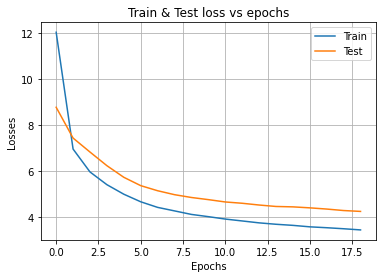

epoch: 19 train loss: 3.4251755969900826 Test loss: 4.219559249223701


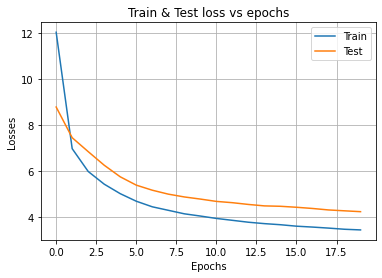

epoch: 20 train loss: 3.386145899692408 Test loss: 4.199457347558503


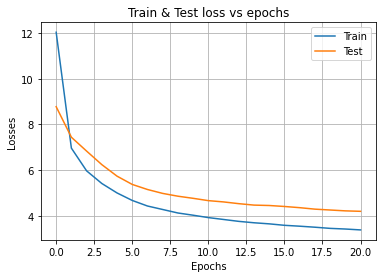

epoch: 21 train loss: 3.3574468807659668 Test loss: 4.166138664284492


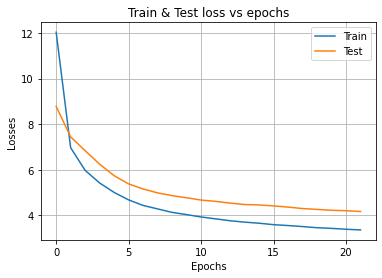

epoch: 22 train loss: 3.3152846792671626 Test loss: 4.137635186790276


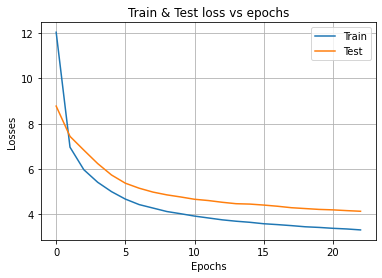

epoch: 23 train loss: 3.2919843014722963 Test loss: 4.113892173085457


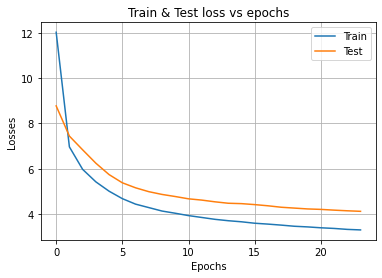

epoch: 24 train loss: 3.243826292970164 Test loss: 4.0800246116892485


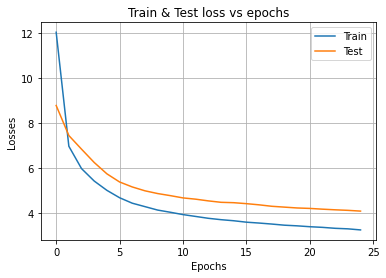

epoch: 25 train loss: 3.2197400800556344 Test loss: 4.071701220959942


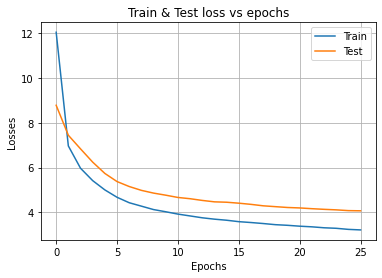

epoch: 26 train loss: 3.2104580833269716 Test loss: 4.074933845842468


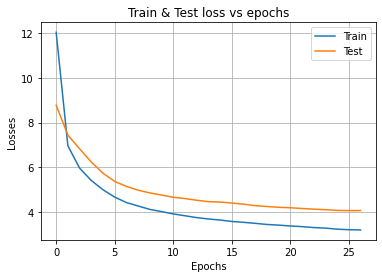

epoch: 27 train loss: 3.166580801740527 Test loss: 4.015186213166014


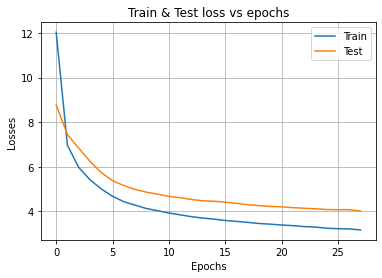

epoch: 28 train loss: 3.144091365131255 Test loss: 4.007950681720788


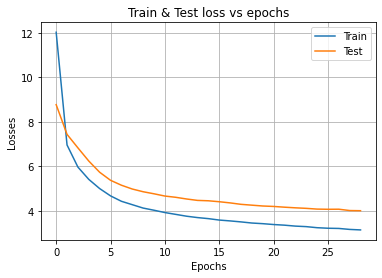

epoch: 29 train loss: 3.1148614625869544 Test loss: 3.966872343897552


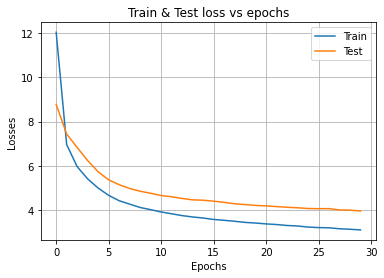

epoch: 30 train loss: 3.087747409701157 Test loss: 3.9578017444498936


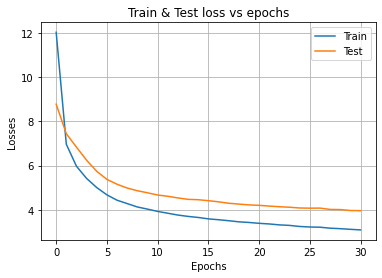

epoch: 31 train loss: 3.0579684334289925 Test loss: 3.954577273876643


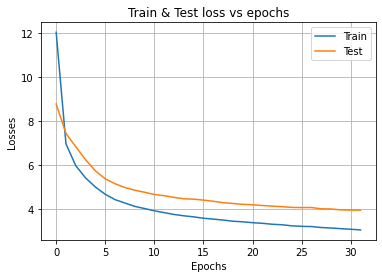

epoch: 32 train loss: 3.036615936994567 Test loss: 3.9143897808088632


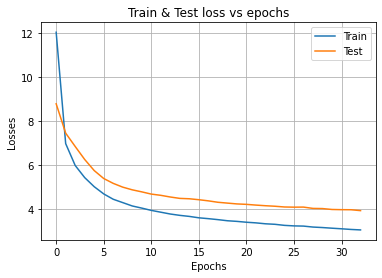

epoch: 33 train loss: 3.0117809521446106 Test loss: 3.9034730529483532


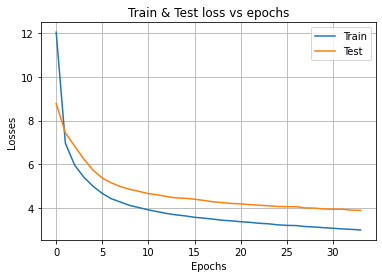

epoch: 34 train loss: 2.981021022962161 Test loss: 3.8742271342473535


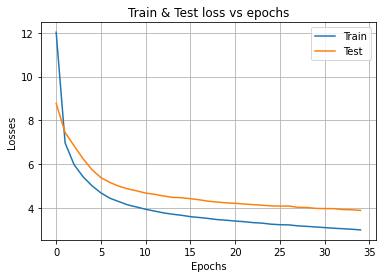

epoch: 35 train loss: 2.9615898941881524 Test loss: 3.8718995261190496


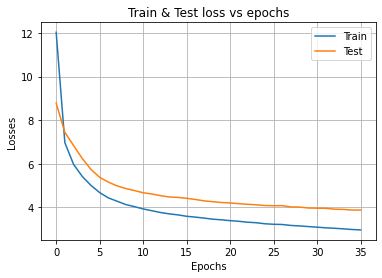

epoch: 36 train loss: 2.938054099620948 Test loss: 3.8686280557282053


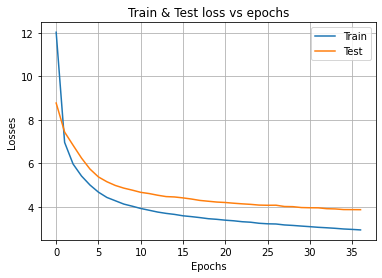

epoch: 37 train loss: 2.909665243033619 Test loss: 3.842544626678616


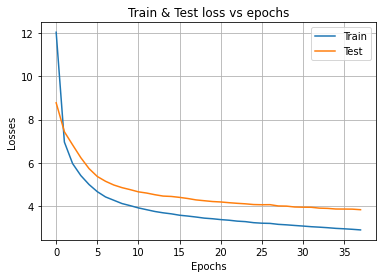

epoch: 38 train loss: 2.8832819373891856 Test loss: 3.829126343923381


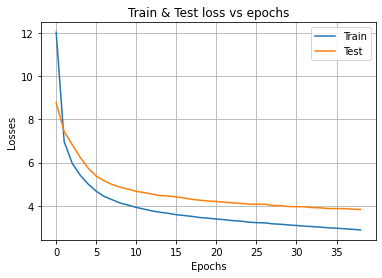

epoch: 39 train loss: 2.864353808292461 Test loss: 3.8013144295539116


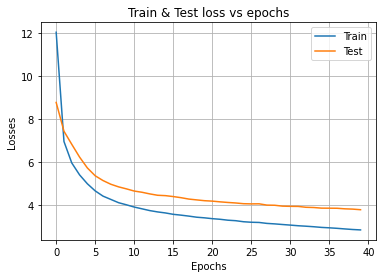

epoch: 40 train loss: 2.857549446144212 Test loss: 3.8172053718991927


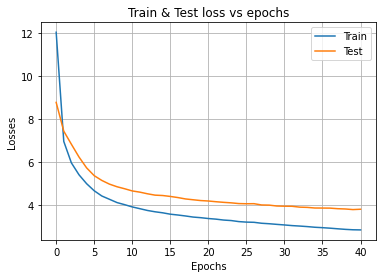

epoch: 41 train loss: 2.826603512773612 Test loss: 3.81022257948674


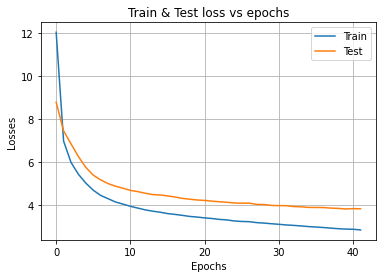

epoch: 42 train loss: 2.825853614711955 Test loss: 3.7878714259941137


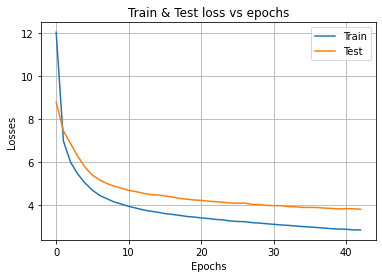

epoch: 43 train loss: 2.7884836889733657 Test loss: 3.8116362495620906


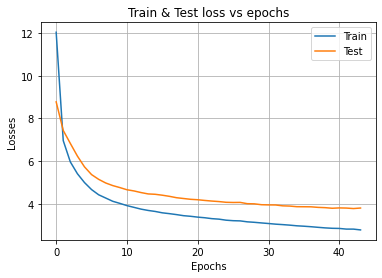

epoch: 44 train loss: 2.7553645259136346 Test loss: 3.797043910920436


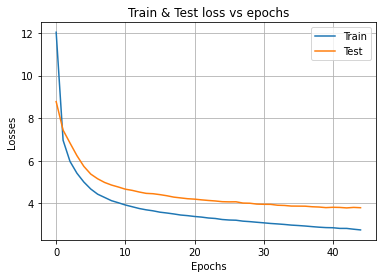

epoch: 45 train loss: 2.7438527884256225 Test loss: 3.787101702175737


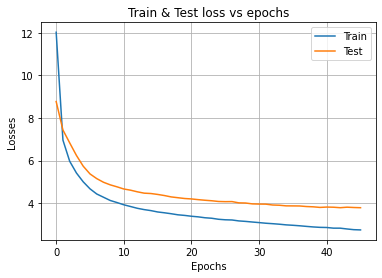

epoch: 46 train loss: 2.730994747030897 Test loss: 3.7945492401189815


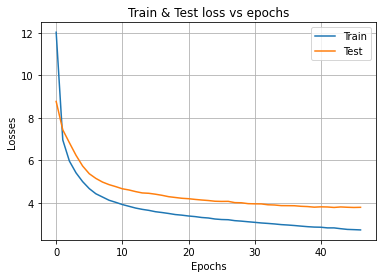

epoch: 47 train loss: 2.681594974575564 Test loss: 3.7791733784225077


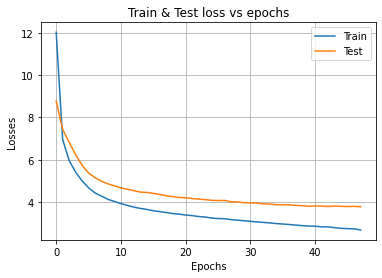

epoch: 48 train loss: 2.680382797920189 Test loss: 3.7430035364544496


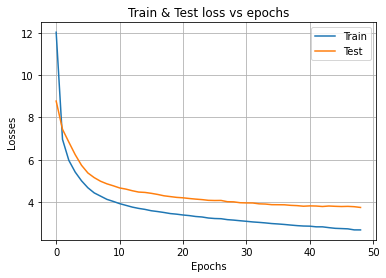

epoch: 49 train loss: 2.675095182552161 Test loss: 3.768519671969009


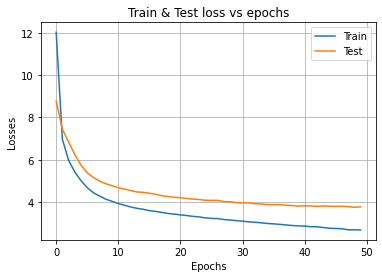

epoch: 50 train loss: 2.637996027485288 Test loss: 3.7687311078500207


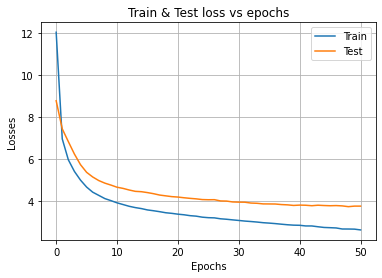

epoch: 51 train loss: 2.6235899343943823 Test loss: 3.7641555172532644


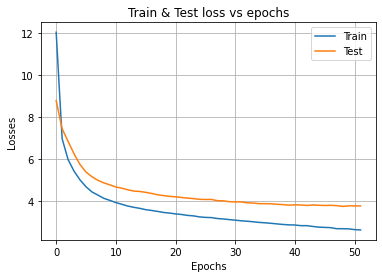

epoch: 52 train loss: 2.6107806956306177 Test loss: 3.8212343843904812


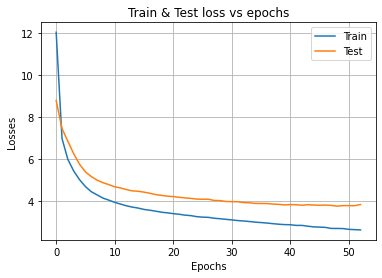

epoch: 53 train loss: 2.5852837571677267 Test loss: 3.778073713194313


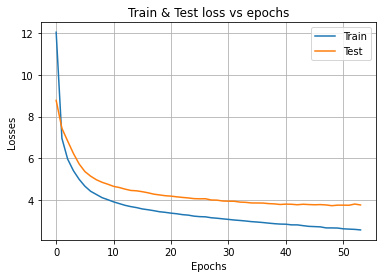

epoch: 54 train loss: 2.5685010468636285 Test loss: 3.757789712178944


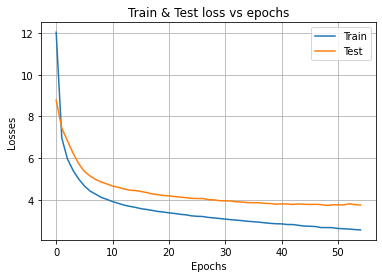

split: 0 test loss: 3.7430035364544496
Mean test loss: 3.7430035364544496


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[1]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_cloudy, datetimes_test_cloudy, images_trainval_cloudy, images_test_cloudy, 
                                                         pv_log_trainval_cloudy, pv_log_test_cloudy, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)): 
   
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

# Overcast data SUNSET Overcast architecture ()

epoch: 0 train loss: 5.695830946735545 Test loss: 3.5978817786797173


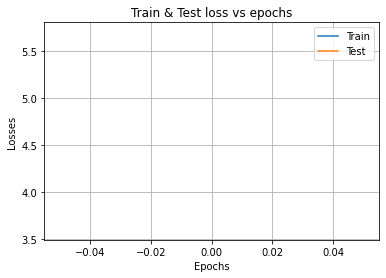

epoch: 1 train loss: 4.339533029493808 Test loss: 2.9066962481296073


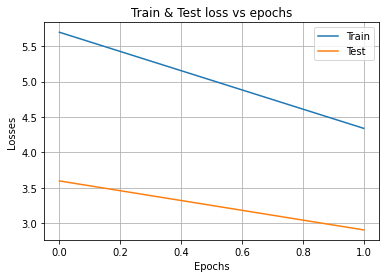

epoch: 2 train loss: 3.5870534244914736 Test loss: 3.243564252648553


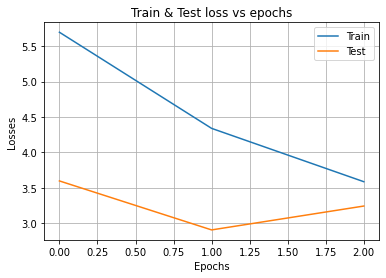

epoch: 3 train loss: 3.53924678890961 Test loss: 3.121645447805062


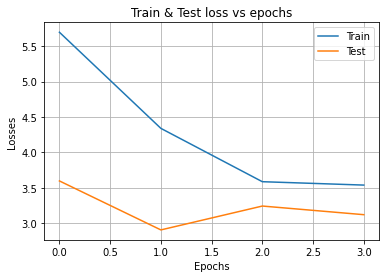

epoch: 4 train loss: 3.519631662834619 Test loss: 3.0669942407392963


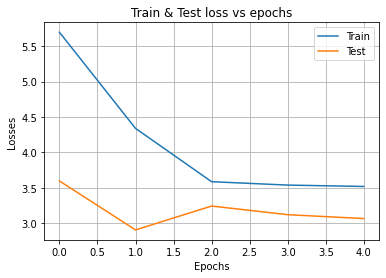

epoch: 5 train loss: 3.486279817803106 Test loss: 3.0435943198119424


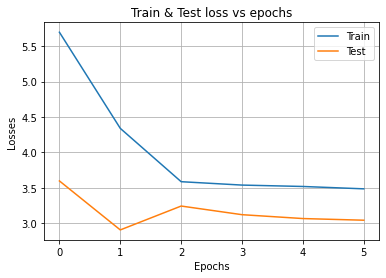

epoch: 6 train loss: 3.448136032206894 Test loss: 2.998302711363633


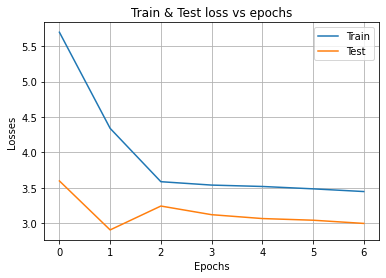

epoch: 7 train loss: 3.4311029955039034 Test loss: 2.9832259108168007


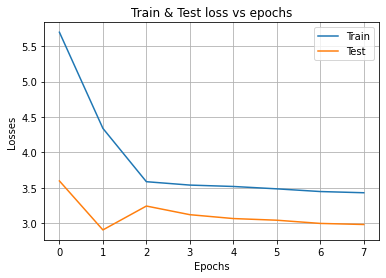

epoch: 8 train loss: 3.4000903567076306 Test loss: 2.925938507915771


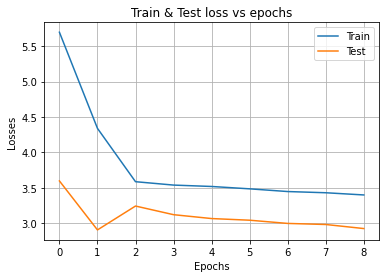

epoch: 9 train loss: 3.380981015914656 Test loss: 2.8770809833570734


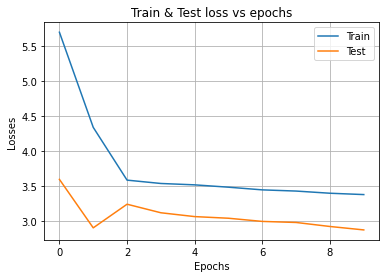

epoch: 10 train loss: 3.353573108894818 Test loss: 2.857560528866475


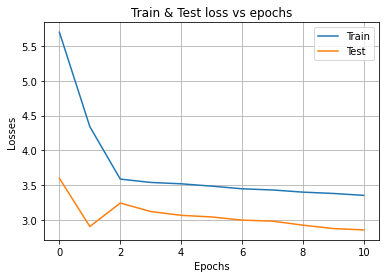

epoch: 11 train loss: 3.32465038959056 Test loss: 2.840331945449298


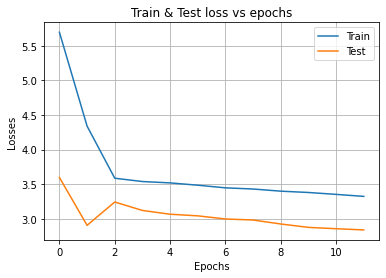

epoch: 12 train loss: 3.3130228921080547 Test loss: 2.820127872112137


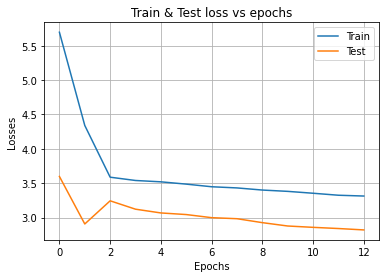

epoch: 13 train loss: 3.2744134993907807 Test loss: 2.7616298774766537


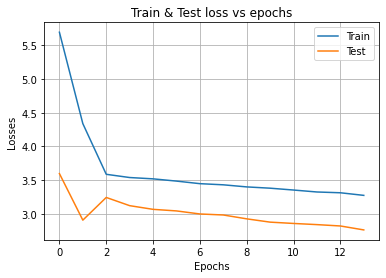

epoch: 14 train loss: 3.2343420650511567 Test loss: 2.7735326570737984


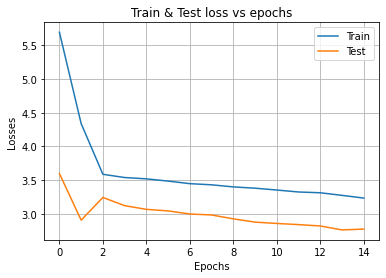

epoch: 15 train loss: 3.196471610740418 Test loss: 2.7370978183175936


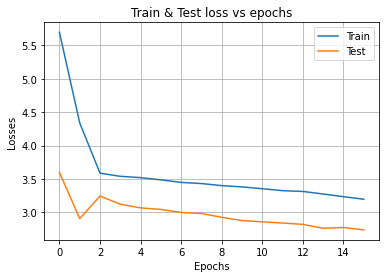

epoch: 16 train loss: 3.15604554950214 Test loss: 2.7241293539361027


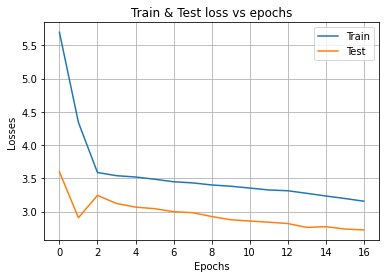

epoch: 17 train loss: 3.1081548670808767 Test loss: 2.665221307152248


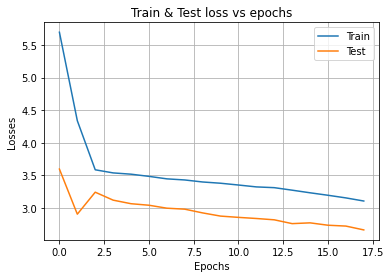

epoch: 18 train loss: 3.066983297993056 Test loss: 2.6705105850793673


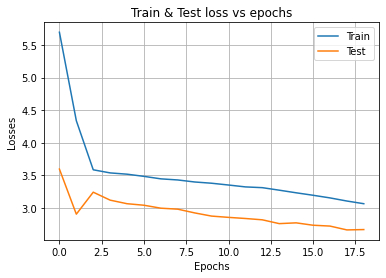

epoch: 19 train loss: 3.0153656929229857 Test loss: 2.6524958792200484


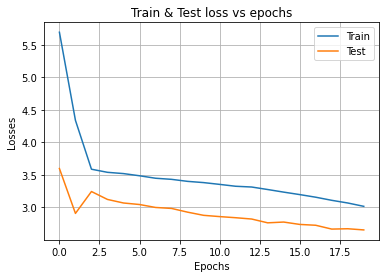

epoch: 20 train loss: 2.9641417816142632 Test loss: 2.551943131718379


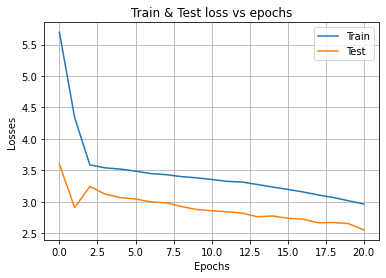

epoch: 21 train loss: 2.9038873098593476 Test loss: 2.564541693001678


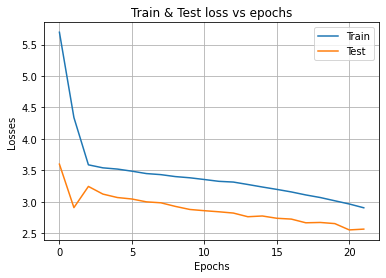

epoch: 22 train loss: 2.843488713797905 Test loss: 2.5178477395605805


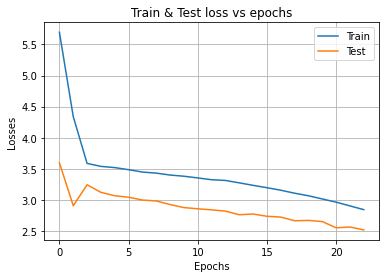

epoch: 23 train loss: 2.7881622215905955 Test loss: 2.505292750007144


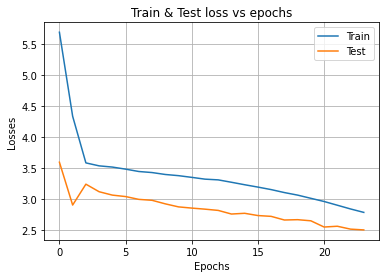

epoch: 24 train loss: 2.732239436977854 Test loss: 2.4289084898221858


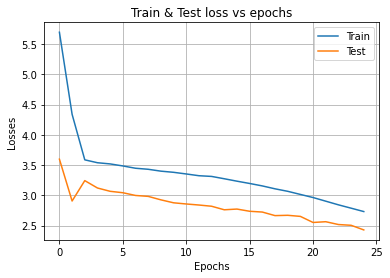

epoch: 25 train loss: 2.678134975326164 Test loss: 2.5077920002697685


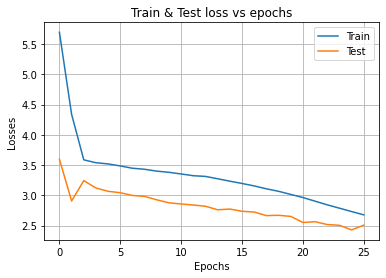

epoch: 26 train loss: 2.621644471547159 Test loss: 2.4228557748391415


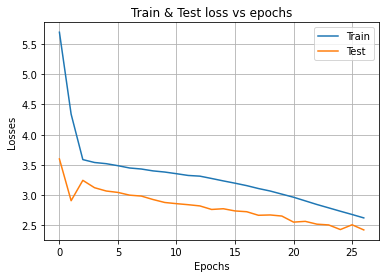

epoch: 27 train loss: 2.5890960954950835 Test loss: 2.4133089572482183


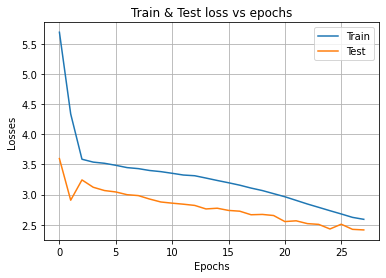

epoch: 28 train loss: 2.548990491563162 Test loss: 2.369157870845825


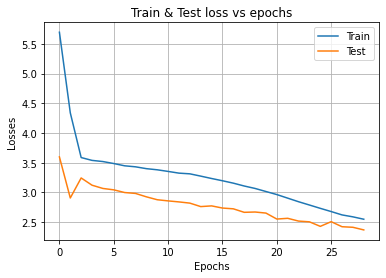

epoch: 29 train loss: 2.507128286768494 Test loss: 2.346819429395403


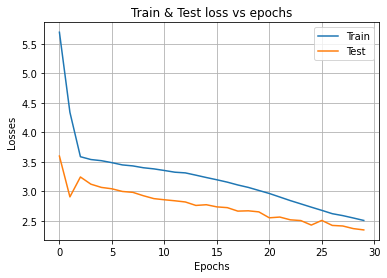

epoch: 30 train loss: 2.4602822055354467 Test loss: 2.3398418439663313


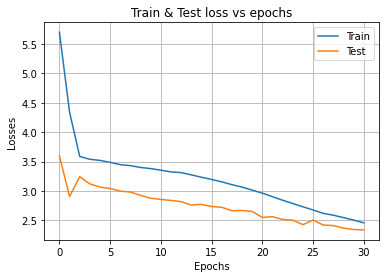

epoch: 31 train loss: 2.444603882227494 Test loss: 2.3233971743779382


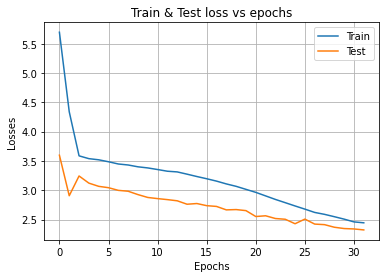

epoch: 32 train loss: 2.415795048682245 Test loss: 2.326666428770526


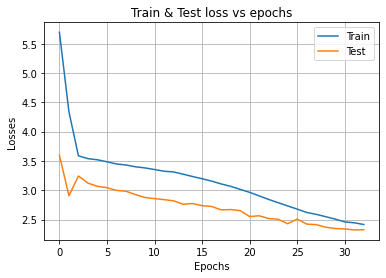

epoch: 33 train loss: 2.370886211696503 Test loss: 2.2701721713223026


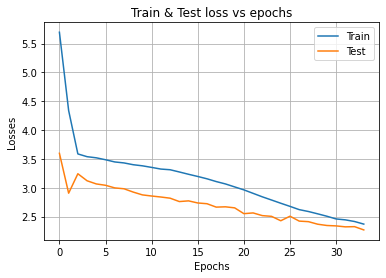

epoch: 34 train loss: 2.3597679078189544 Test loss: 2.3123306171747955


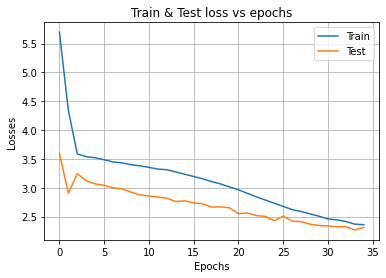

epoch: 35 train loss: 2.330540502209196 Test loss: 2.2678905099051305


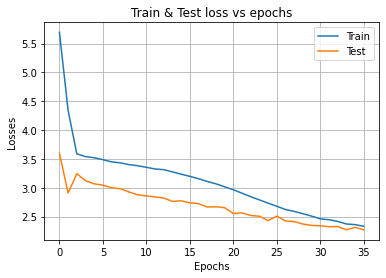

epoch: 36 train loss: 2.2984989323240494 Test loss: 2.230384275435913


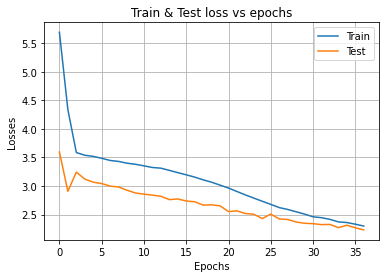

epoch: 37 train loss: 2.2935442745184598 Test loss: 2.2880751217288893


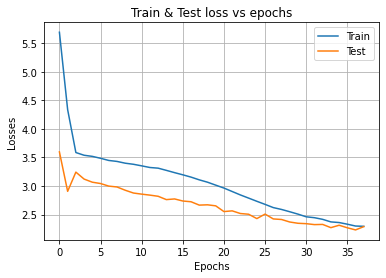

epoch: 38 train loss: 2.2599373584093296 Test loss: 2.206218814103352


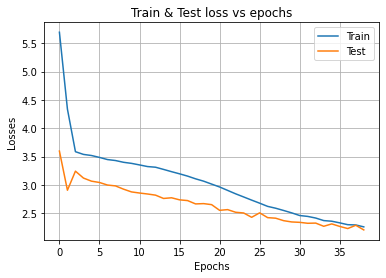

epoch: 39 train loss: 2.2386768411118805 Test loss: 2.24331279493497


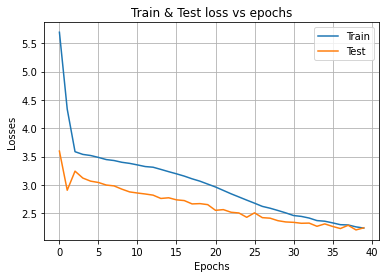

epoch: 40 train loss: 2.214605708392976 Test loss: 2.193047090814686


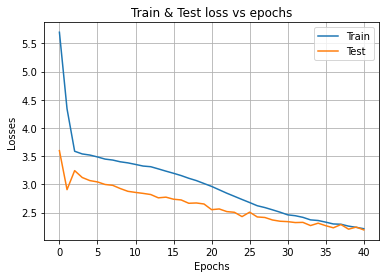

epoch: 41 train loss: 2.1938777999542696 Test loss: 2.178642383893337


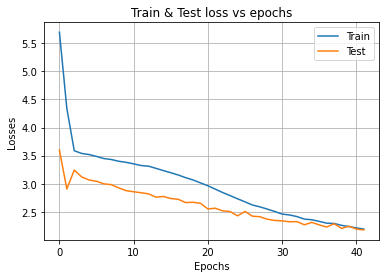

epoch: 42 train loss: 2.170180098378286 Test loss: 2.181385517107406


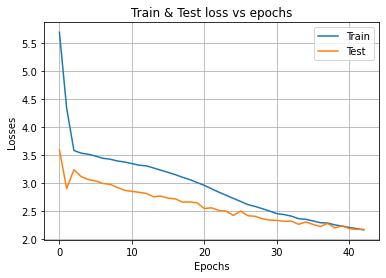

epoch: 43 train loss: 2.1406816063051086 Test loss: 2.15692384587473


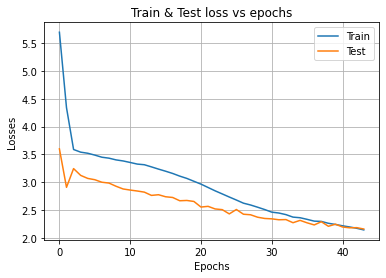

epoch: 44 train loss: 2.1326000512084833 Test loss: 2.1830905267206737


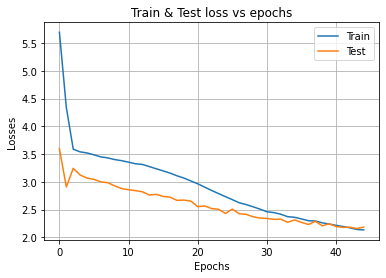

epoch: 45 train loss: 2.0980930246574094 Test loss: 2.1561161226274677


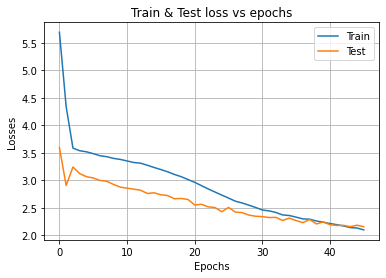

epoch: 46 train loss: 2.0807191869076846 Test loss: 2.1786136697373264


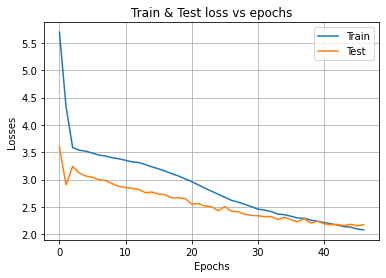

epoch: 47 train loss: 2.0781385435207347 Test loss: 2.1463106843167554


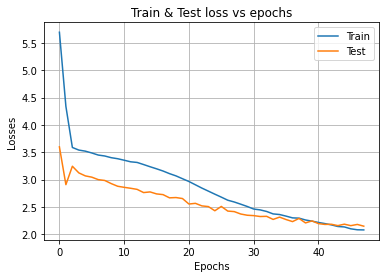

epoch: 48 train loss: 2.0397041934143103 Test loss: 2.108569174816307


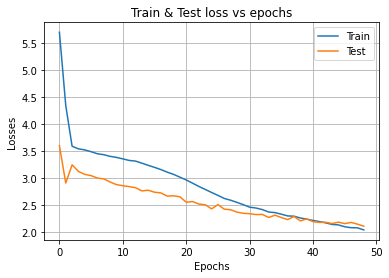

epoch: 49 train loss: 2.0293817245205883 Test loss: 2.0677600421870292


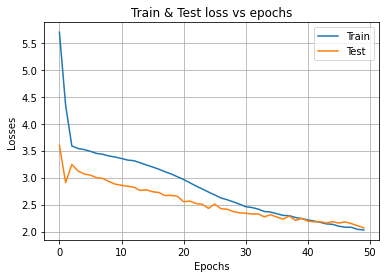

epoch: 50 train loss: 2.0126355527846354 Test loss: 2.053002423846699


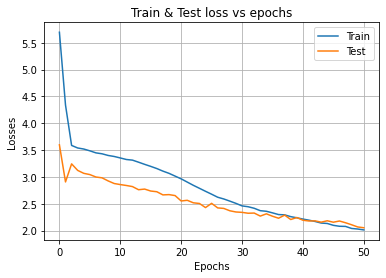

epoch: 51 train loss: 1.9970995786577312 Test loss: 2.0594437857811116


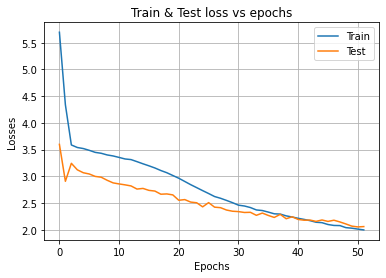

epoch: 52 train loss: 1.9639837063347507 Test loss: 2.093467649911114


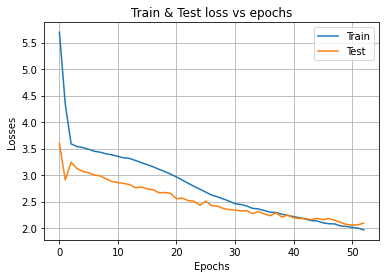

epoch: 53 train loss: 1.955867958661267 Test loss: 2.0368539268434547


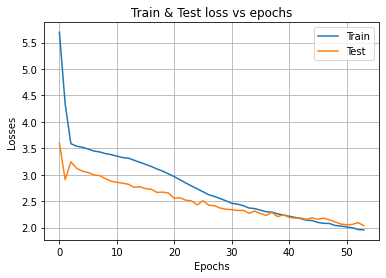

epoch: 54 train loss: 1.9368261896761663 Test loss: 2.029458265162963


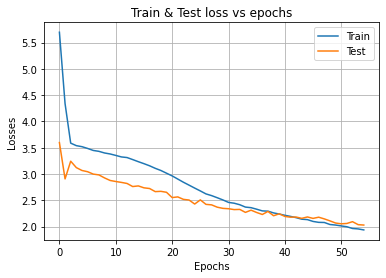

epoch: 55 train loss: 1.9231031471243 Test loss: 2.040666095161432


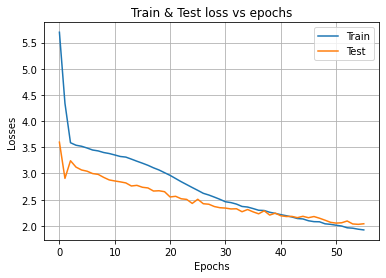

epoch: 56 train loss: 1.9016737345117363 Test loss: 2.031293499447957


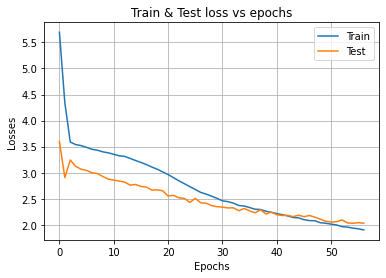

epoch: 57 train loss: 1.8861789729869674 Test loss: 2.017973103381807


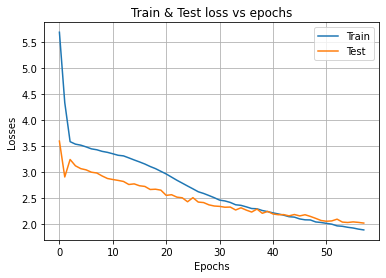

epoch: 58 train loss: 1.8723542479517776 Test loss: 2.0273063217878105


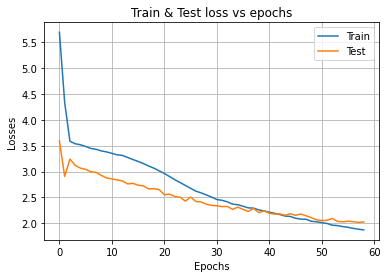

epoch: 59 train loss: 1.859014350329111 Test loss: 1.9984464231502548


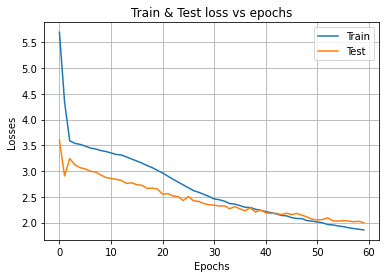

epoch: 60 train loss: 1.845535562623334 Test loss: 2.0172081927440764


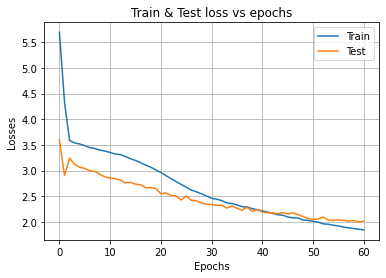

epoch: 61 train loss: 1.8215111379862359 Test loss: 1.969330193931096


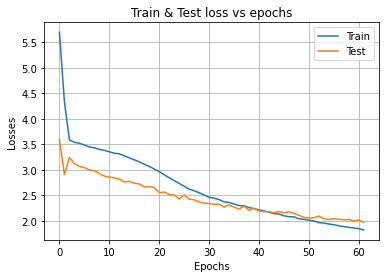

epoch: 62 train loss: 1.811153695017097 Test loss: 1.9820866625632845


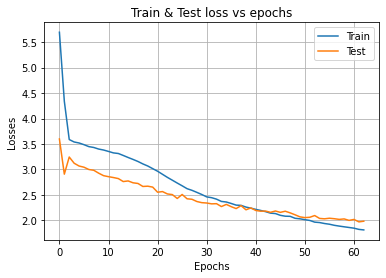

epoch: 63 train loss: 1.7936248948966749 Test loss: 1.987454875340538


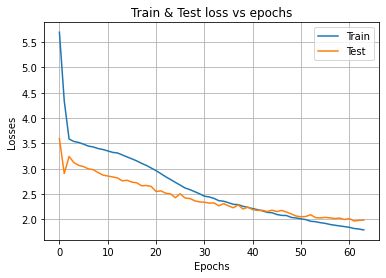

epoch: 64 train loss: 1.7870303463908854 Test loss: 1.9504836440504378


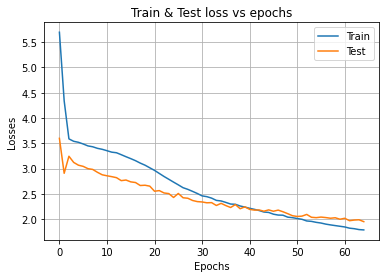

epoch: 65 train loss: 1.7650470898607065 Test loss: 1.9670141225459705


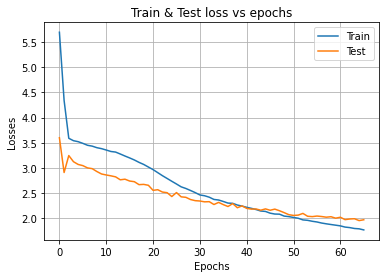

epoch: 66 train loss: 1.7526727074391801 Test loss: 1.994262332647104


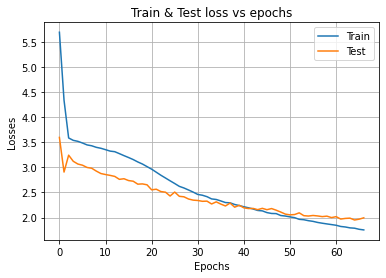

epoch: 67 train loss: 1.7356433482695826 Test loss: 1.988784820668192


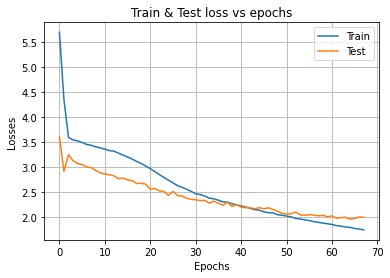

epoch: 68 train loss: 1.7242944145100991 Test loss: 1.9590159711089163


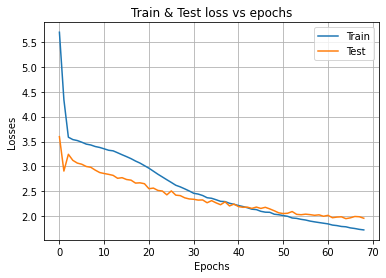

epoch: 69 train loss: 1.7075567102935276 Test loss: 1.938412630163266


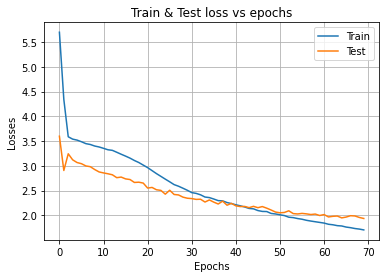

epoch: 70 train loss: 1.6980623649088975 Test loss: 1.9119447560753045


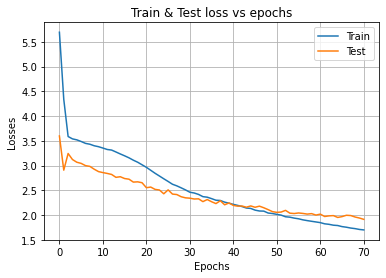

epoch: 71 train loss: 1.6784400402057023 Test loss: 1.9232996279297845


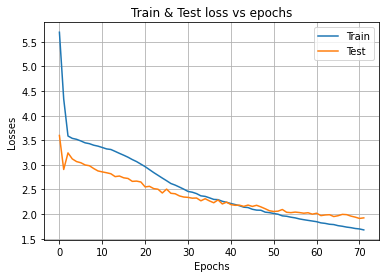

epoch: 72 train loss: 1.666497566957436 Test loss: 1.9023277716697842


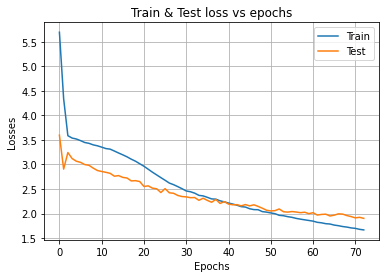

epoch: 73 train loss: 1.6515337137790913 Test loss: 1.9509765772895313


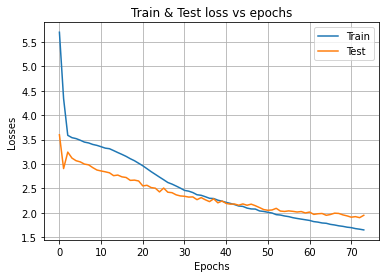

epoch: 74 train loss: 1.6477449209819783 Test loss: 1.9261440020077276


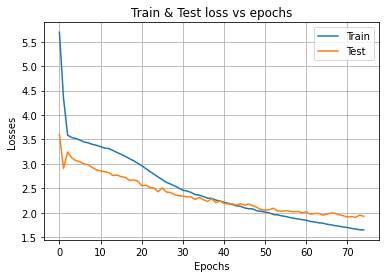

epoch: 75 train loss: 1.6408388290301092 Test loss: 1.93526789696404


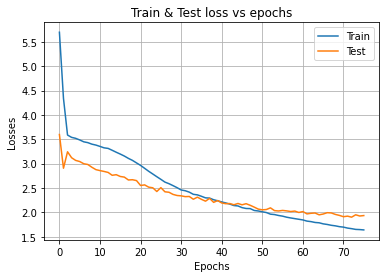

epoch: 76 train loss: 1.6176532598713587 Test loss: 1.9361069995613747


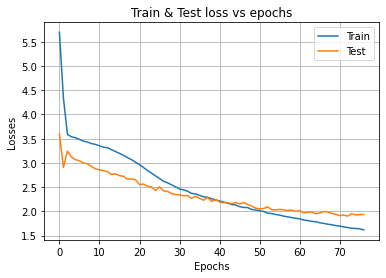

epoch: 77 train loss: 1.5966799349564245 Test loss: 1.8831419746015596


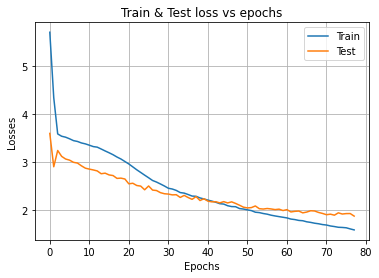

epoch: 78 train loss: 1.5862054649459456 Test loss: 1.9113303336433796


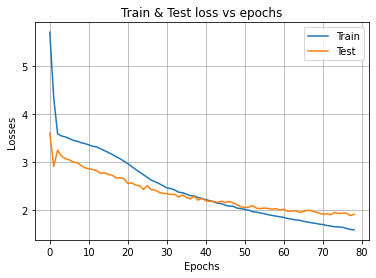

epoch: 79 train loss: 1.5787277287971953 Test loss: 1.8687921637789289


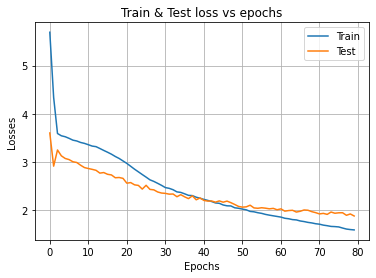

epoch: 80 train loss: 1.5667344449674883 Test loss: 1.9152590378355256


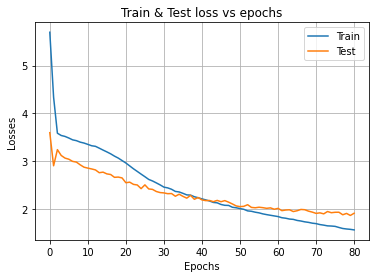

epoch: 81 train loss: 1.566484768320022 Test loss: 1.888247568280383


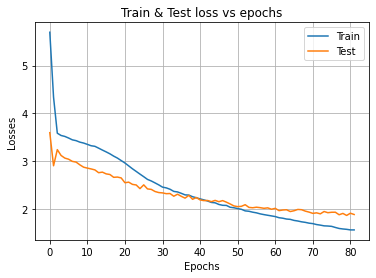

epoch: 82 train loss: 1.5374784351848234 Test loss: 1.9104358537910615


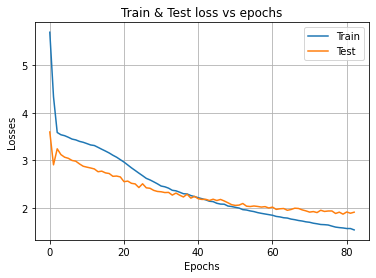

epoch: 83 train loss: 1.5211006348305085 Test loss: 1.8791480192365118


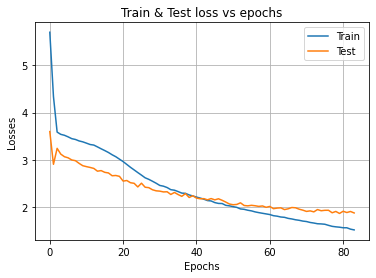

epoch: 84 train loss: 1.5187255245150735 Test loss: 1.8922666237717936


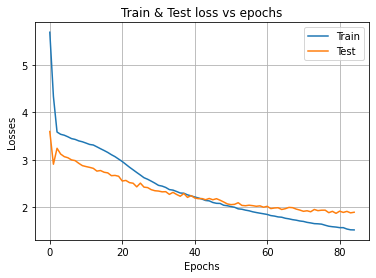

epoch: 85 train loss: 1.5238753050518976 Test loss: 1.8951302087324942


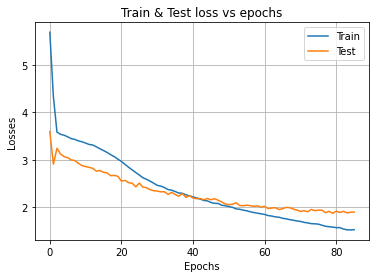

split: 0 test loss: 1.8687921637789289
Mean test loss: 1.8687921637789289


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[3]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_overcast, datetimes_test_overcast, images_trainval_overcast, images_test_overcast, 
                                                         pv_log_trainval_overcast, pv_log_test_overcast, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):
   
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

# Overcast Run 2 (Baseline architecture)

epoch: 0 train loss: 5.446149499981063 Test loss: 3.5987627094683283


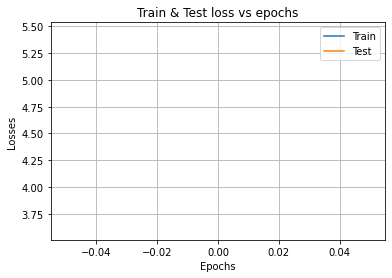

epoch: 1 train loss: 4.200795216219277 Test loss: 2.8245866545149187


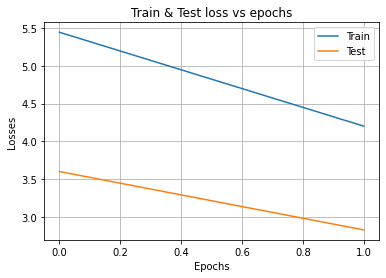

epoch: 2 train loss: 3.5860473742417396 Test loss: 3.076226286457902


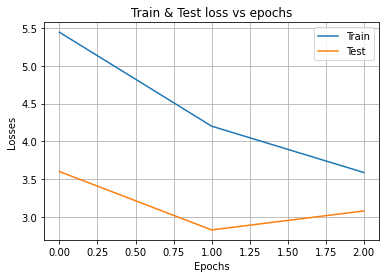

epoch: 3 train loss: 3.502274220310362 Test loss: 2.9864419068656325


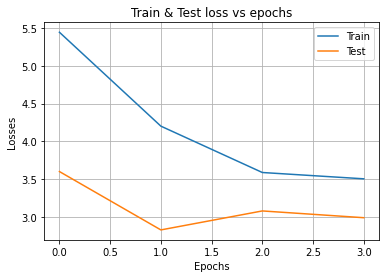

epoch: 4 train loss: 3.432790649970862 Test loss: 2.936033379788911


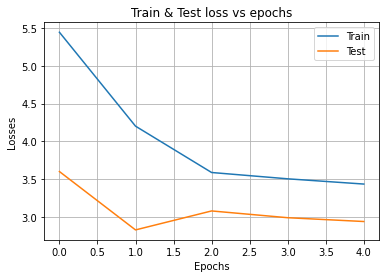

epoch: 5 train loss: 3.386698820774838 Test loss: 2.8858893151944676


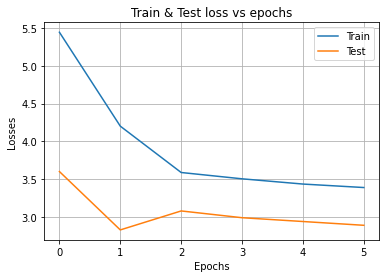

epoch: 6 train loss: 3.3324995575676737 Test loss: 2.8705401358014715


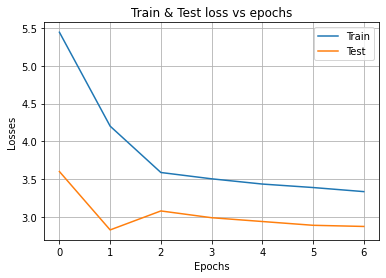

epoch: 7 train loss: 3.2788864785559717 Test loss: 2.8035390816445687


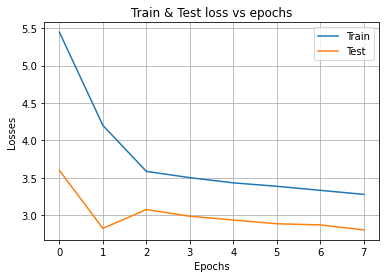

epoch: 8 train loss: 3.2116714534561583 Test loss: 2.7640962180840933


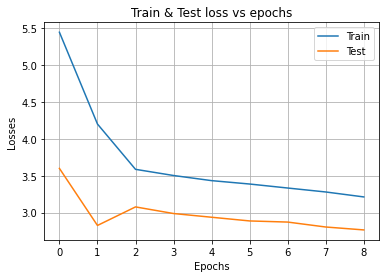

epoch: 9 train loss: 3.169020786427554 Test loss: 2.737114203918462


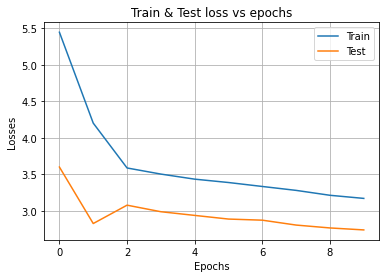

epoch: 10 train loss: 3.117571092335917 Test loss: 2.737395828077568


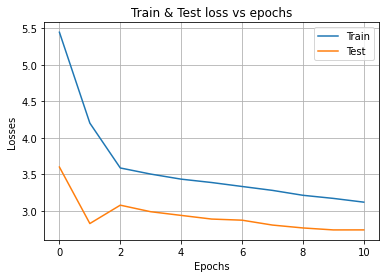

epoch: 11 train loss: 3.0611273162261643 Test loss: 2.6668911128256125


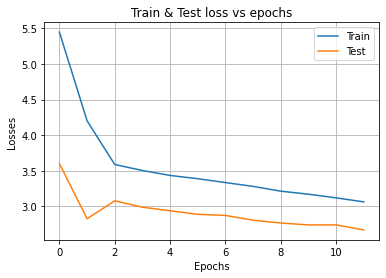

epoch: 12 train loss: 3.0256420790013556 Test loss: 2.662856965445701


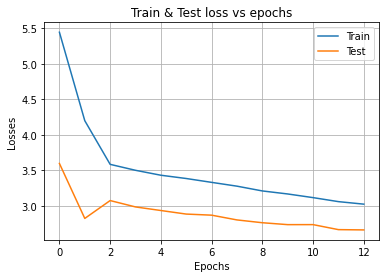

epoch: 13 train loss: 2.975543729232676 Test loss: 2.5891888104250094


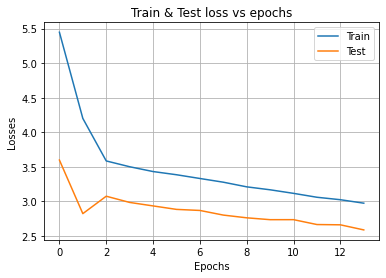

epoch: 14 train loss: 2.9231966115719676 Test loss: 2.5676410900354973


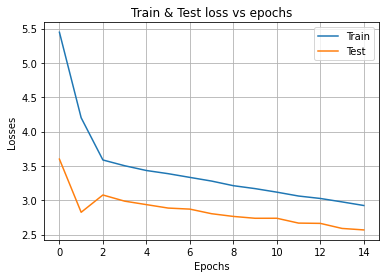

epoch: 15 train loss: 2.8847011942954595 Test loss: 2.5325351164755374


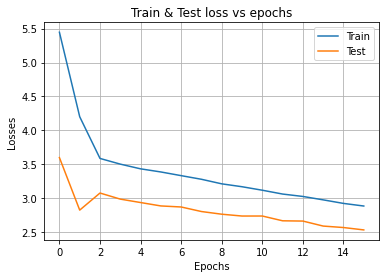

epoch: 16 train loss: 2.8323232148075332 Test loss: 2.5216710226314896


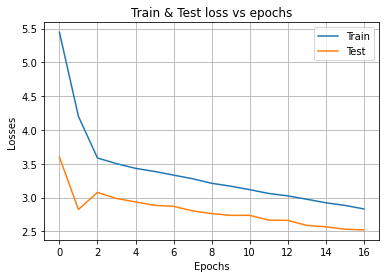

epoch: 17 train loss: 2.799876659555125 Test loss: 2.476766110704267


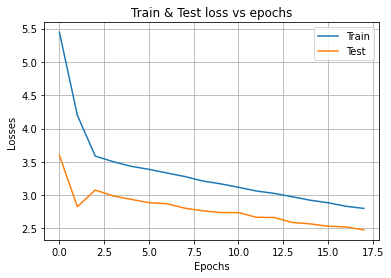

epoch: 18 train loss: 2.753159856910937 Test loss: 2.4646470532562645


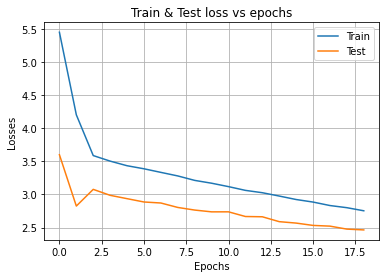

epoch: 19 train loss: 2.701497142604755 Test loss: 2.4447576407590565


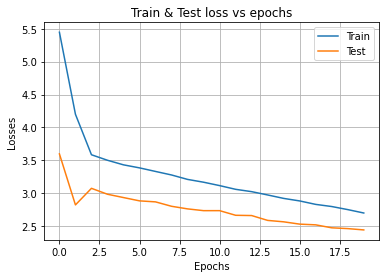

epoch: 20 train loss: 2.6768999073748088 Test loss: 2.4134142849851647


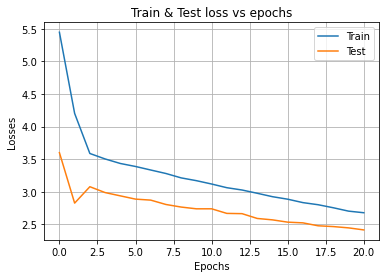

epoch: 21 train loss: 2.6236459633050746 Test loss: 2.4045973736036768


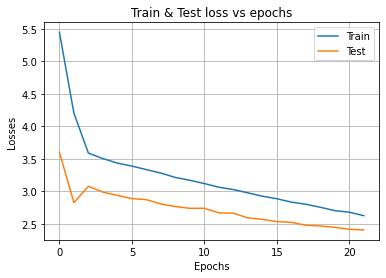

epoch: 22 train loss: 2.5927310967923476 Test loss: 2.4217673166865996


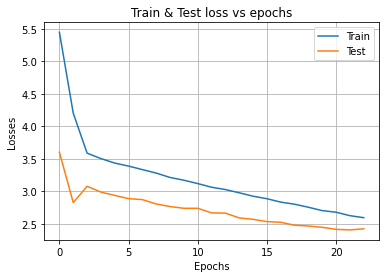

epoch: 23 train loss: 2.555118703898735 Test loss: 2.3770144674056937


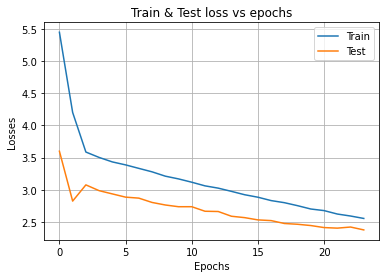

epoch: 24 train loss: 2.5059479200090453 Test loss: 2.391432664601544


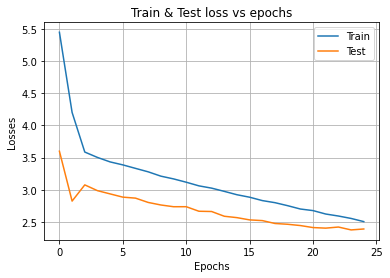

epoch: 25 train loss: 2.4670043603283314 Test loss: 2.3662045017237756


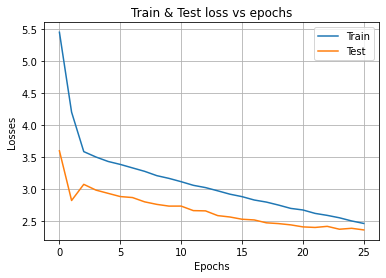

epoch: 26 train loss: 2.4306502935022403 Test loss: 2.330784562352033


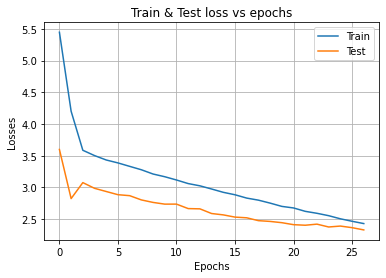

epoch: 27 train loss: 2.3941024783776506 Test loss: 2.2551831401995015


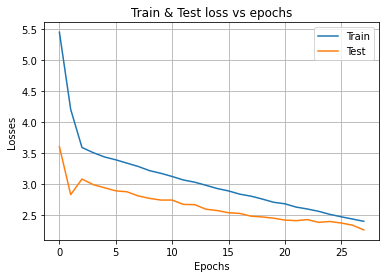

epoch: 28 train loss: 2.3631518075014473 Test loss: 2.321653056218527


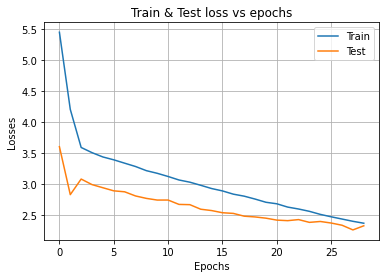

epoch: 29 train loss: 2.328097212906947 Test loss: 2.2360533373774585


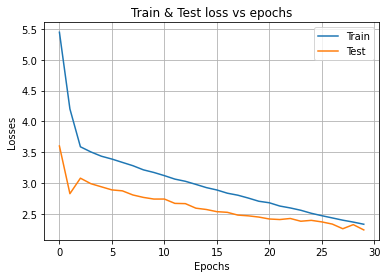

epoch: 30 train loss: 2.2834680753881904 Test loss: 2.217848260188


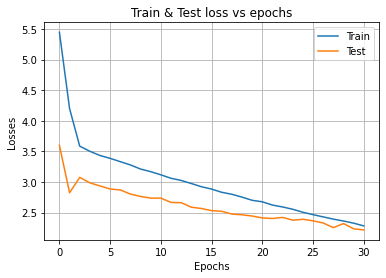

epoch: 31 train loss: 2.2596457871718356 Test loss: 2.199430291581249


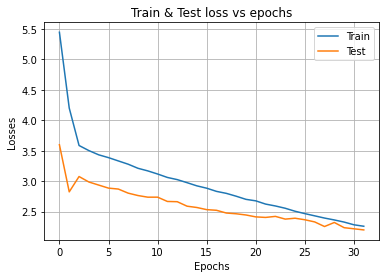

epoch: 32 train loss: 2.2369544103502874 Test loss: 2.1876239491162535


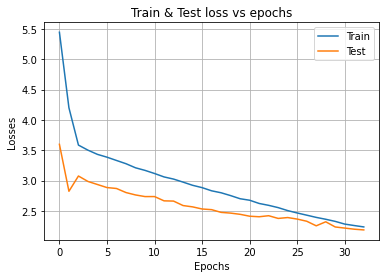

epoch: 33 train loss: 2.183967556431671 Test loss: 2.19002033264144


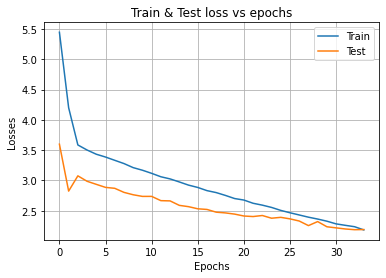

epoch: 34 train loss: 2.1596087328707094 Test loss: 2.178692159694441


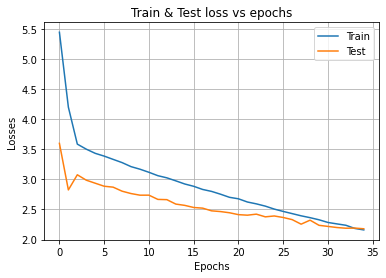

epoch: 35 train loss: 2.1237669527866565 Test loss: 2.151278900521376


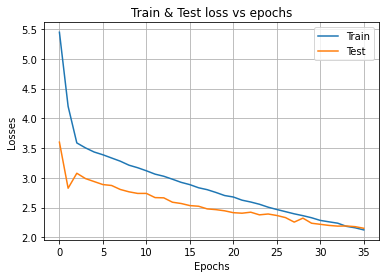

epoch: 36 train loss: 2.102952108250789 Test loss: 2.201323217450772


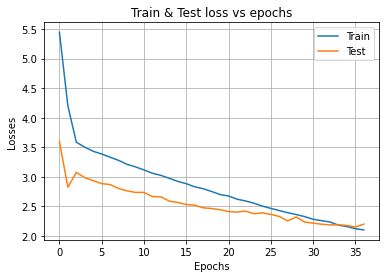

epoch: 37 train loss: 2.079642924240788 Test loss: 2.1406962932387565


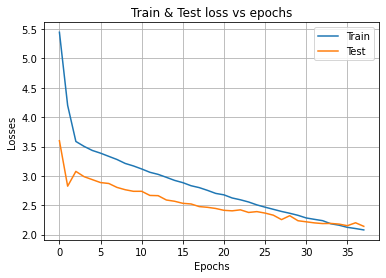

epoch: 38 train loss: 2.0442770361759117 Test loss: 2.1353321671848584


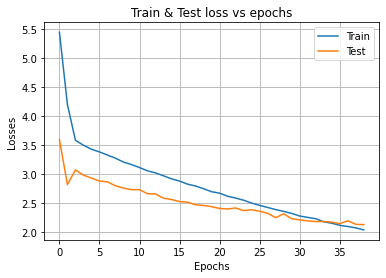

epoch: 39 train loss: 2.031530521852059 Test loss: 2.0950848447099677


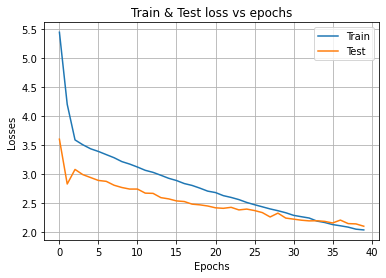

epoch: 40 train loss: 1.9953705897579397 Test loss: 2.147355231116475


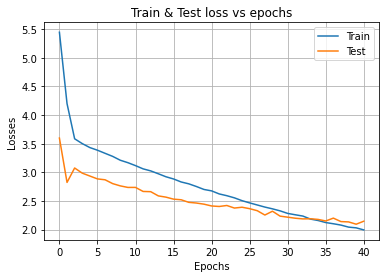

epoch: 41 train loss: 1.978780344761462 Test loss: 2.0571903836172694


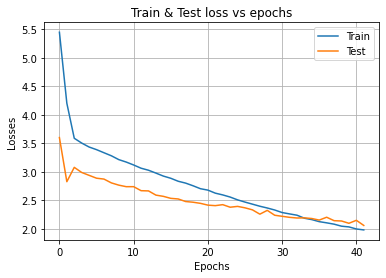

epoch: 42 train loss: 1.952536754385263 Test loss: 2.0714348315379243


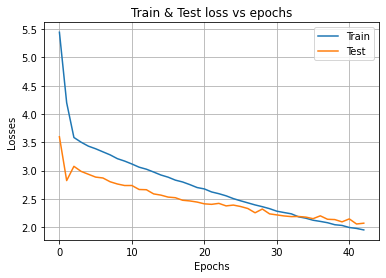

epoch: 43 train loss: 1.9183101731289716 Test loss: 2.0254982336771232


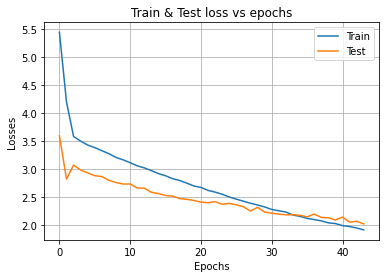

epoch: 44 train loss: 1.8970551255950185 Test loss: 2.0758889213840406


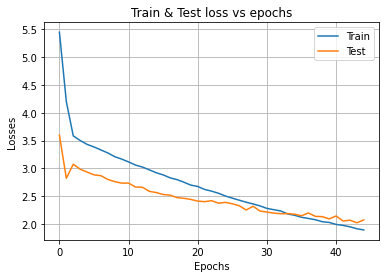

epoch: 45 train loss: 1.8626376007356267 Test loss: 2.0542718999693994


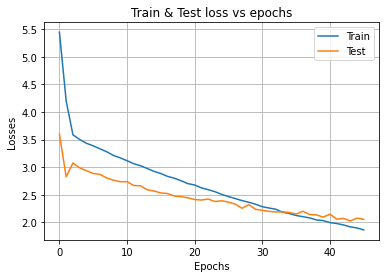

epoch: 46 train loss: 1.8575942517380688 Test loss: 2.0334837734285816


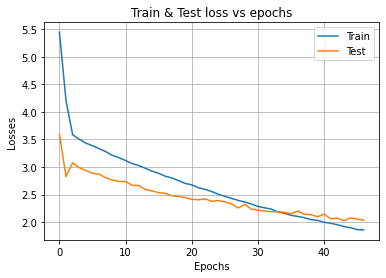

epoch: 47 train loss: 1.8452423051627609 Test loss: 2.0459618315676344


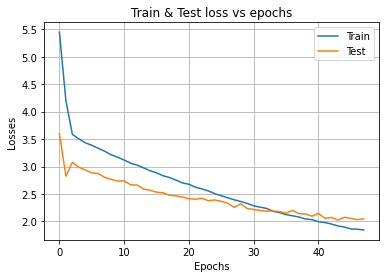

epoch: 48 train loss: 1.8195006094228248 Test loss: 2.0436990086640505


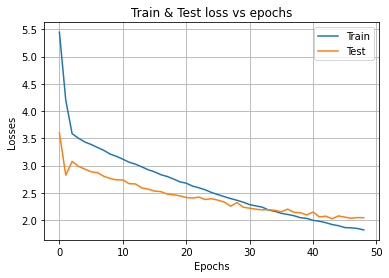

epoch: 49 train loss: 1.8062544855088394 Test loss: 2.000510522561621


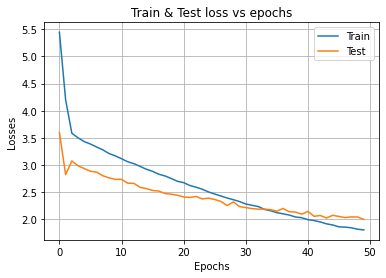

epoch: 50 train loss: 1.7809232074450043 Test loss: 2.060003100679784


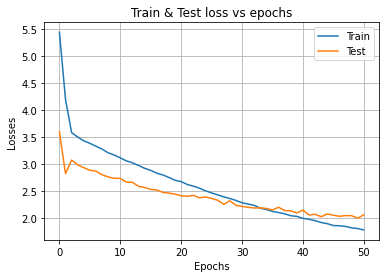

epoch: 51 train loss: 1.7600622817194034 Test loss: 2.0698912469204074


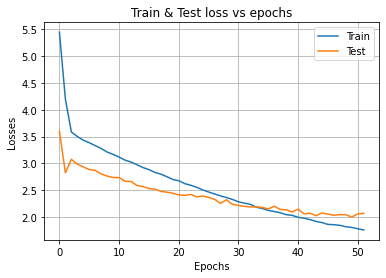

epoch: 52 train loss: 1.7350761345532308 Test loss: 2.0191972808358893


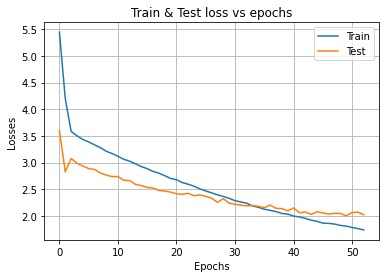

epoch: 53 train loss: 1.7217696269462381 Test loss: 1.9999300258897672


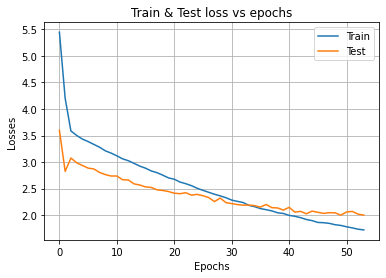

epoch: 54 train loss: 1.7087815335296723 Test loss: 1.94580794707406


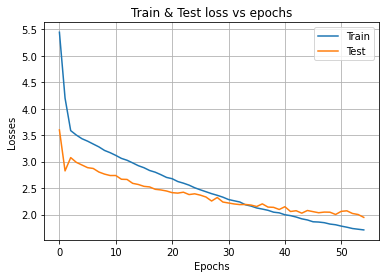

epoch: 55 train loss: 1.6997213563065392 Test loss: 2.0095765231455203


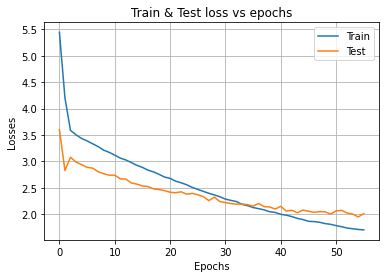

epoch: 56 train loss: 1.670902547231365 Test loss: 1.916973342432934


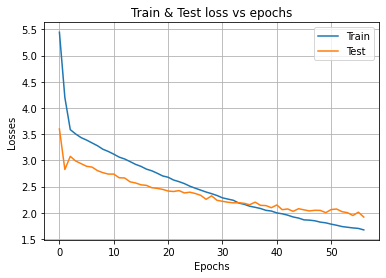

epoch: 57 train loss: 1.6453494581322912 Test loss: 1.9954282283096652


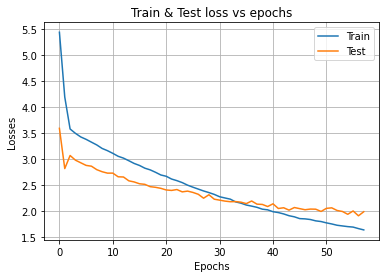

epoch: 58 train loss: 1.6518132624021966 Test loss: 1.9539202376010287


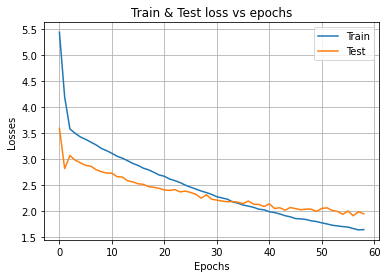

epoch: 59 train loss: 1.6212743050697607 Test loss: 1.983307744942695


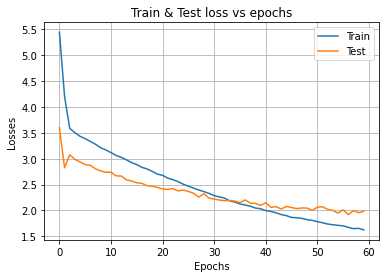

epoch: 60 train loss: 1.6031637807690398 Test loss: 1.969030442847236


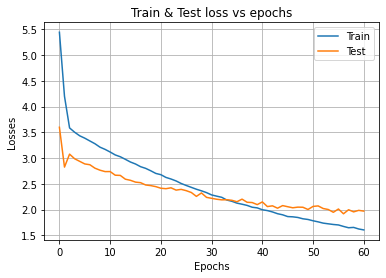

epoch: 61 train loss: 1.5836235825984166 Test loss: 1.9800034346573068


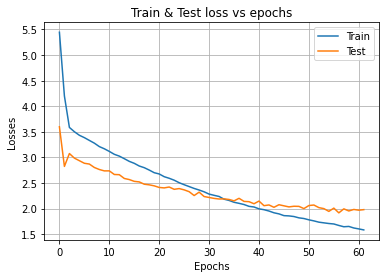

epoch: 62 train loss: 1.6030526413217496 Test loss: 1.9636437472796604


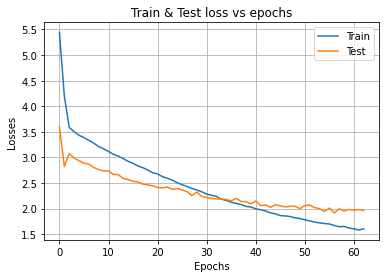

split: 0 test loss: 1.916973342432934
Mean test loss: 1.916973342432934


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[1]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_overcast, datetimes_test_overcast, images_trainval_overcast, images_test_overcast, 
                                                         pv_log_trainval_overcast, pv_log_test_overcast, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):
   
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

epoch: 0 train loss: 3.9820802681519396 Test loss: 2.924582626760082


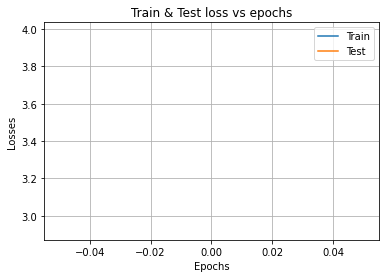

epoch: 1 train loss: 3.3965060407128527 Test loss: 2.9097663033623498


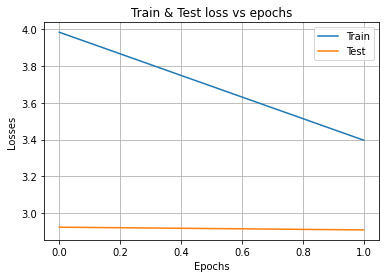

epoch: 2 train loss: 3.233792826009326 Test loss: 2.8245757191287106


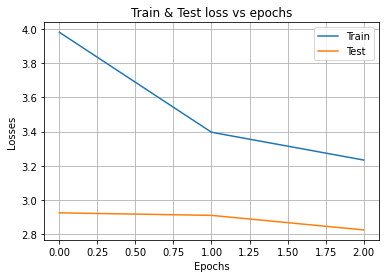

epoch: 3 train loss: 3.0570439052484297 Test loss: 2.8057495462880313


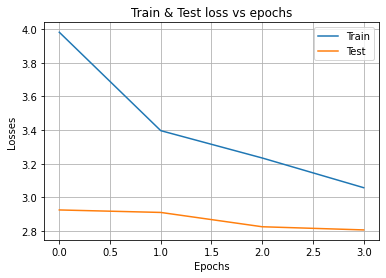

epoch: 4 train loss: 2.873697032171023 Test loss: 2.5757882838269706


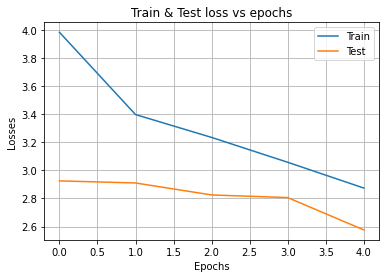

epoch: 5 train loss: 2.69227368486552 Test loss: 2.708903452466673


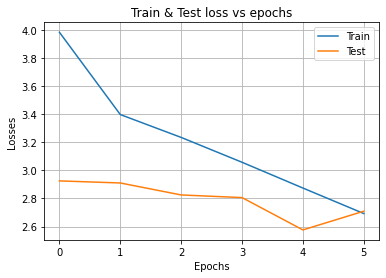

epoch: 6 train loss: 2.543590783180906 Test loss: 2.6516643761008605


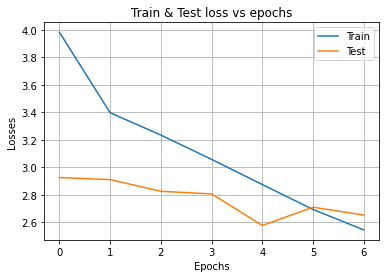

epoch: 7 train loss: 2.3797071164753714 Test loss: 2.503636429591412


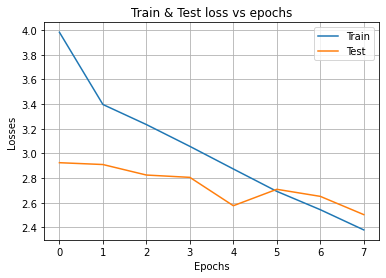

epoch: 8 train loss: 2.2548122356366074 Test loss: 2.3287619935345285


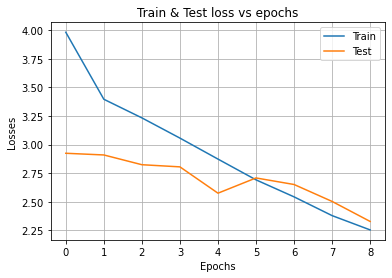

epoch: 9 train loss: 2.1435801886764088 Test loss: 2.4840753006072234


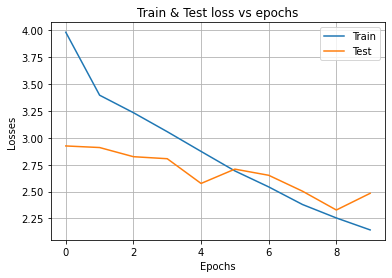

epoch: 10 train loss: 2.043032482960719 Test loss: 2.27695790053654


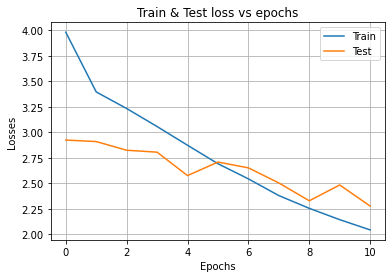

epoch: 11 train loss: 1.9410265691855861 Test loss: 2.2113568366996077


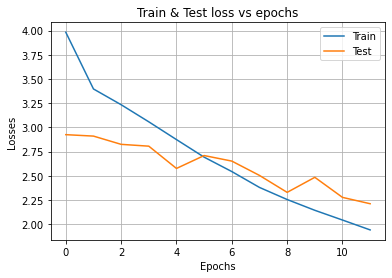

epoch: 12 train loss: 1.8698269692093241 Test loss: 2.2651034315956324


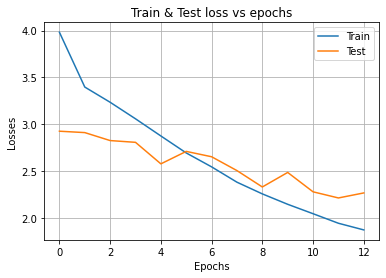

epoch: 13 train loss: 1.819929311432142 Test loss: 2.229790835607667


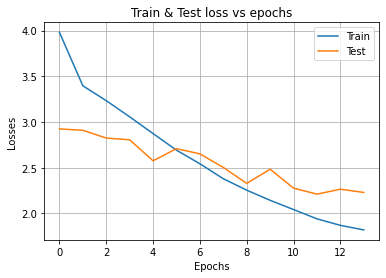

epoch: 14 train loss: 1.7692005540005853 Test loss: 2.370988902504124


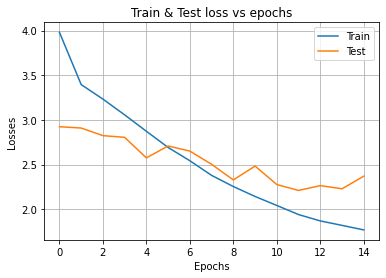

epoch: 15 train loss: 1.6959901900191556 Test loss: 2.301826739475324


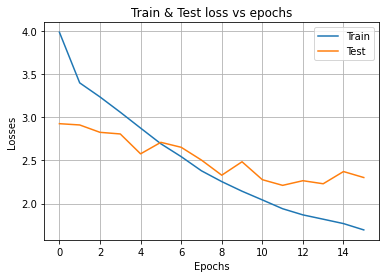

epoch: 16 train loss: 1.6534551840524714 Test loss: 2.1635788573548327


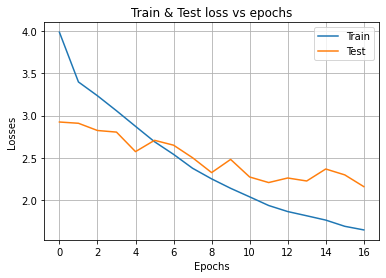

epoch: 17 train loss: 1.6074088050339455 Test loss: 2.097260357207567


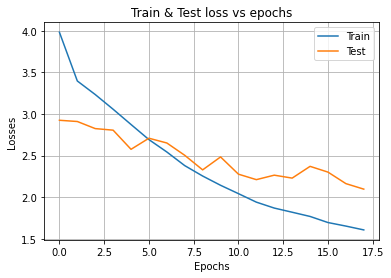

epoch: 18 train loss: 1.5381766683747389 Test loss: 2.270901569633607


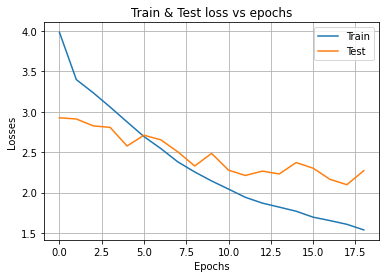

epoch: 19 train loss: 1.4912981562534224 Test loss: 2.0574820876285753


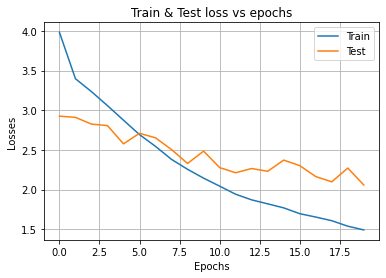

epoch: 20 train loss: 1.4399673885710778 Test loss: 2.0518243106708494


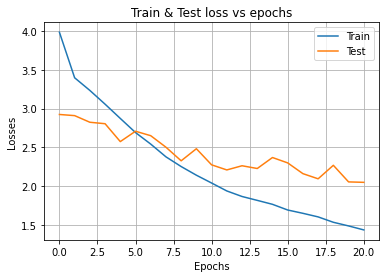

epoch: 21 train loss: 1.4107338405571521 Test loss: 2.1158134510663404


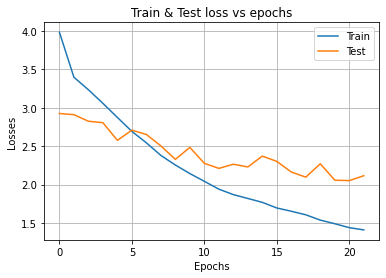

epoch: 22 train loss: 1.3739872145263623 Test loss: 2.0516559369508744


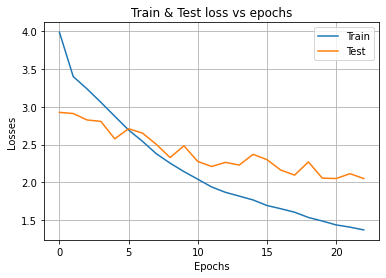

epoch: 23 train loss: 1.344308707600984 Test loss: 2.2766317305858363


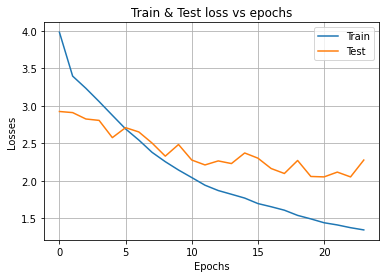

epoch: 24 train loss: 1.2981216561764612 Test loss: 2.089628865017268


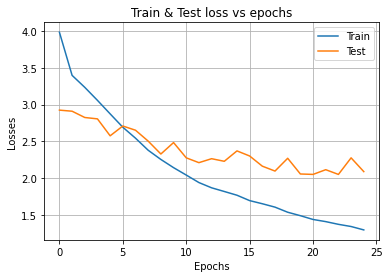

epoch: 25 train loss: 1.2741025361773415 Test loss: 2.164452369027062


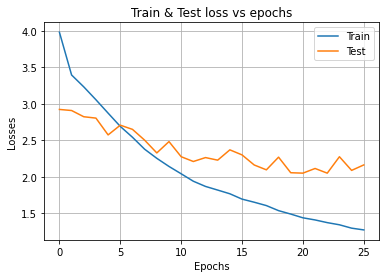

epoch: 26 train loss: 1.223409003392813 Test loss: 2.116218618510187


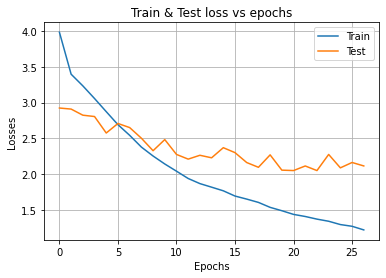

epoch: 27 train loss: 1.2134456029622243 Test loss: 2.1514695446011136


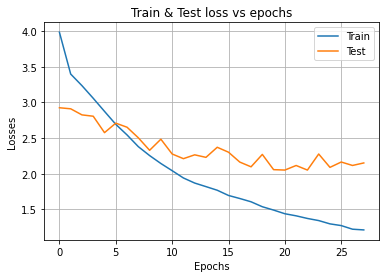

epoch: 28 train loss: 1.2217421839954536 Test loss: 2.0376388281734505


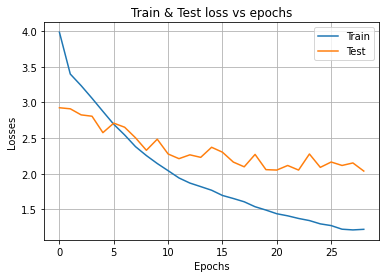

epoch: 29 train loss: 1.150864303911574 Test loss: 2.1245501963735407


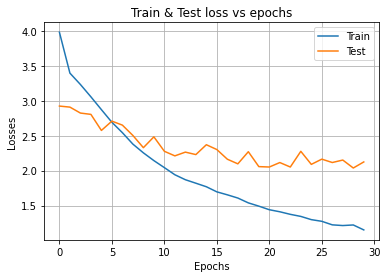

epoch: 30 train loss: 1.1215547215435973 Test loss: 2.0245791981951453


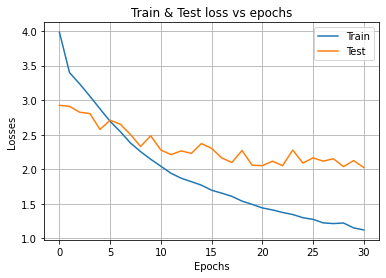

epoch: 31 train loss: 1.076653724373892 Test loss: 2.1454308813410146


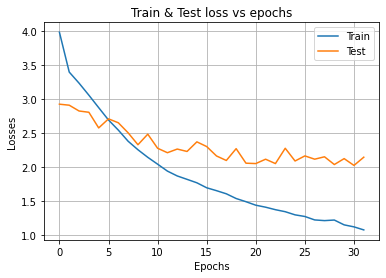

epoch: 32 train loss: 1.1183702393173156 Test loss: 2.031120115339812


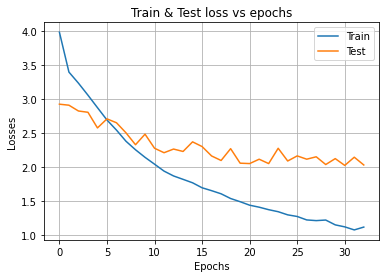

epoch: 33 train loss: 1.0375897765276982 Test loss: 2.108031531380921


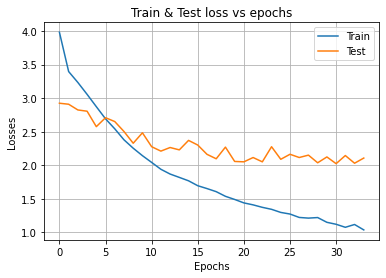

epoch: 34 train loss: 1.034374055064237 Test loss: 2.1621049260365806


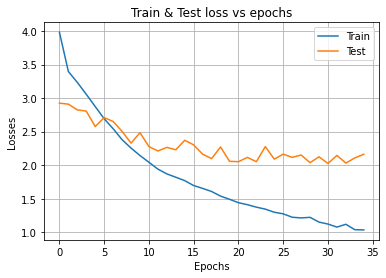

epoch: 35 train loss: 1.0381647183395102 Test loss: 2.009655690378617


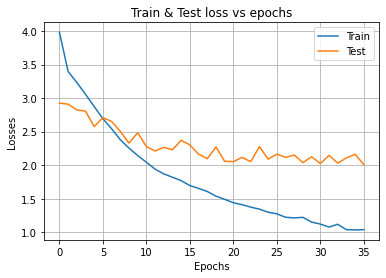

epoch: 36 train loss: 0.9866222427977878 Test loss: 2.008213017950514


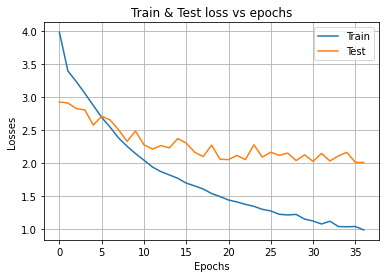

epoch: 37 train loss: 0.9774397473820884 Test loss: 2.039831974813248


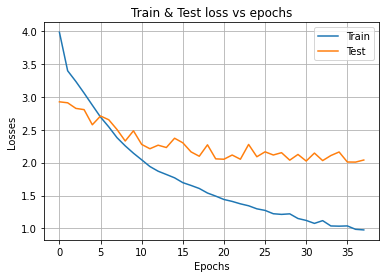

epoch: 38 train loss: 0.9763102733292092 Test loss: 1.9997964192566702


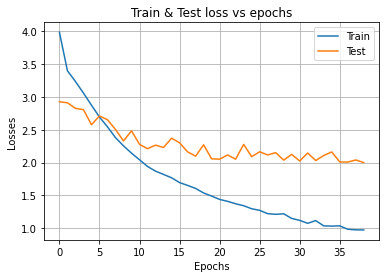

epoch: 39 train loss: 0.9621555584754826 Test loss: 2.0186694703145345


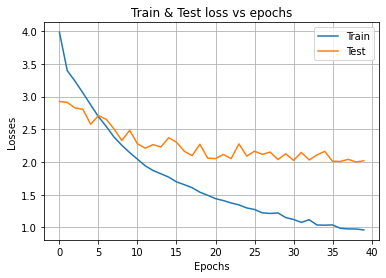

epoch: 40 train loss: 0.9627989590208134 Test loss: 2.2033779976160752


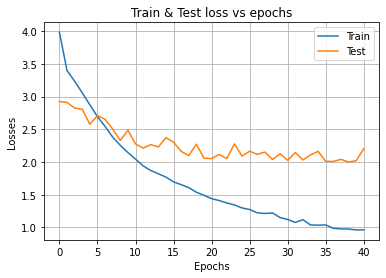

epoch: 41 train loss: 0.9614035810513168 Test loss: 2.0055061110782835


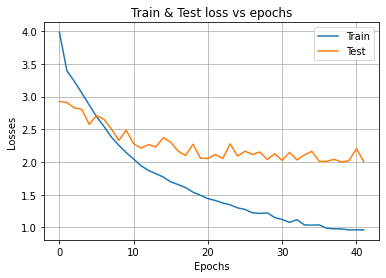

epoch: 42 train loss: 0.9204862063010043 Test loss: 2.0373566414697915


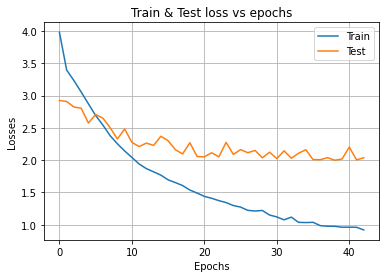

epoch: 43 train loss: 0.8898082910664419 Test loss: 2.094906551389975


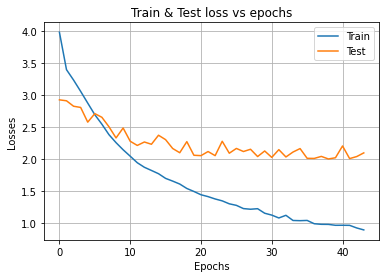

epoch: 44 train loss: 0.8680897977846149 Test loss: 2.036522660428939


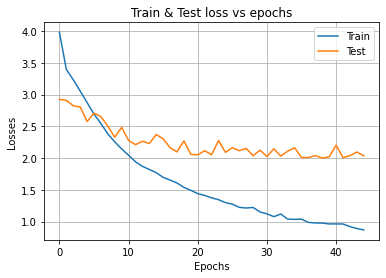

split: 0 test loss: 1.9997964192566702
Mean test loss: 1.9997964192566702


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[4]

learning_rate = 2e-5
batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_overcast, datetimes_test_overcast, images_trainval_overcast, images_test_overcast, 
                                                         pv_log_trainval_overcast, pv_log_test_overcast, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):
   
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

epoch: 0 train loss: 3.5074401298880864 Test loss: 2.7226789842645496


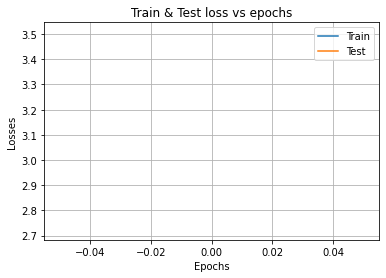

epoch: 1 train loss: 2.8193579406106233 Test loss: 2.631251199305074


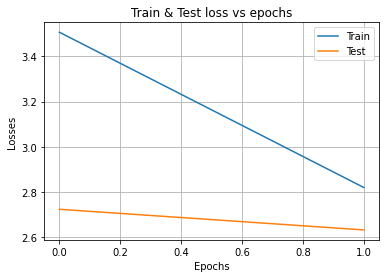

epoch: 2 train loss: 2.497061078262322 Test loss: 2.562872692078379


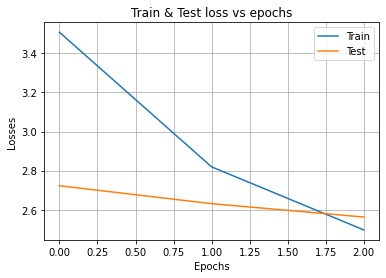

epoch: 3 train loss: 2.241203924805084 Test loss: 2.4729487274861603


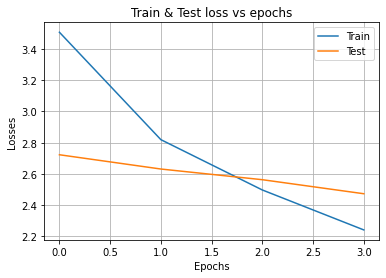

epoch: 4 train loss: 2.0585776527493174 Test loss: 2.4385167362264735


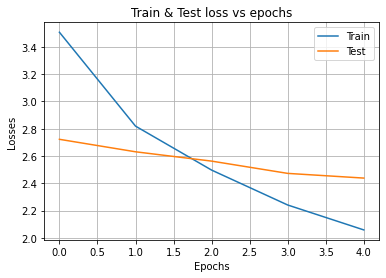

epoch: 5 train loss: 1.91097808557151 Test loss: 2.291363167958031


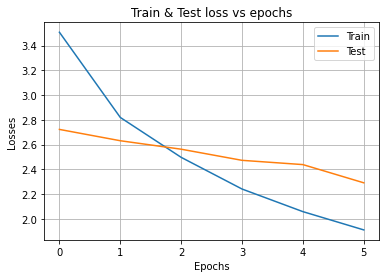

epoch: 6 train loss: 1.811207810765842 Test loss: 2.142179345981303


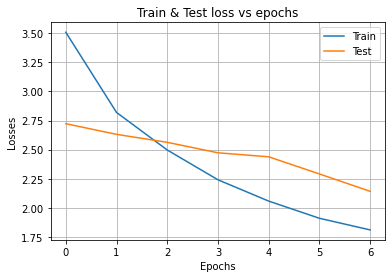

epoch: 7 train loss: 1.7334423428624803 Test loss: 2.1370400380544985


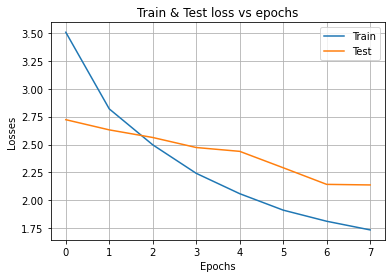

epoch: 8 train loss: 1.660455743593785 Test loss: 2.3913468324483422


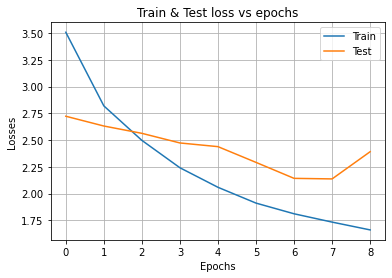

epoch: 9 train loss: 1.6056685176630316 Test loss: 2.0731614407873407


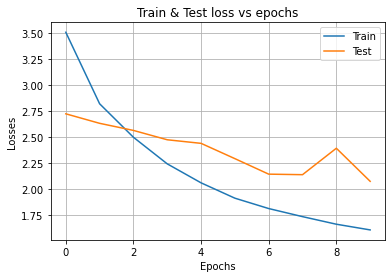

epoch: 10 train loss: 1.526602730681103 Test loss: 2.217654879312605


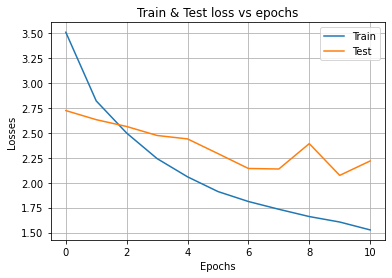

epoch: 11 train loss: 1.4512946098365067 Test loss: 2.250414948780939


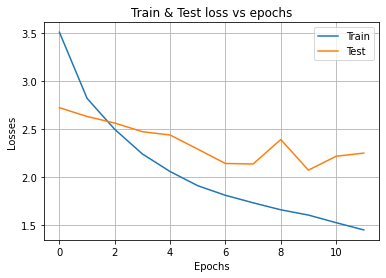

epoch: 12 train loss: 1.399401164319381 Test loss: 2.033633521354675


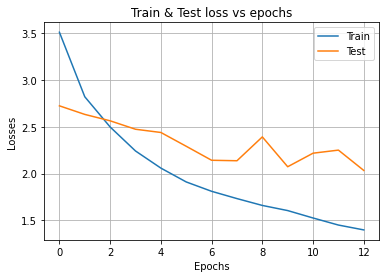

epoch: 13 train loss: 1.3941630638549298 Test loss: 2.1223725708497625


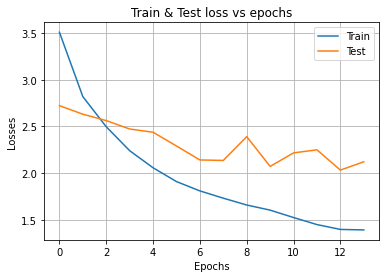

epoch: 14 train loss: 1.3143724110188693 Test loss: 2.1220268389989707


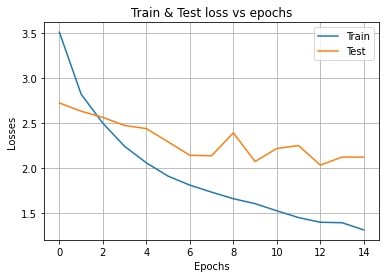

epoch: 15 train loss: 1.2837557969130644 Test loss: 1.99367141205759


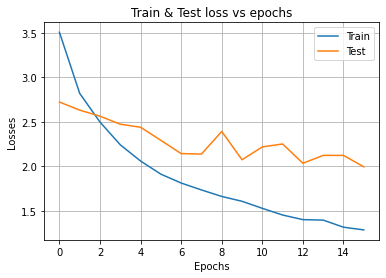

epoch: 16 train loss: 1.2354997390218576 Test loss: 2.016468715737201


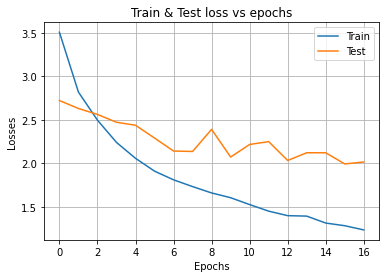

epoch: 17 train loss: 1.1778224187728925 Test loss: 2.0013859845311712


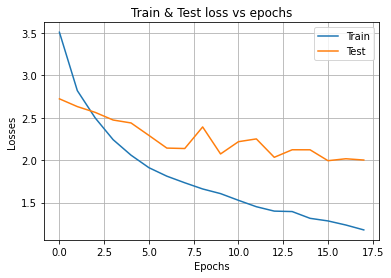

epoch: 18 train loss: 1.1607181363063266 Test loss: 1.9589651479500811


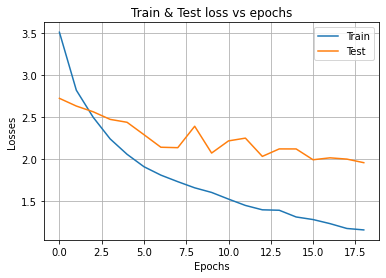

epoch: 19 train loss: 1.137524534952422 Test loss: 1.9469691295991665


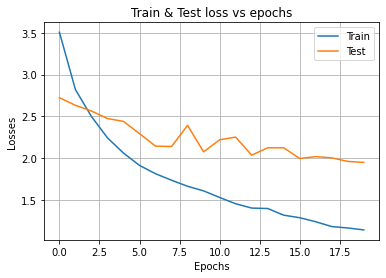

epoch: 20 train loss: 1.0911817201460277 Test loss: 2.2321281845157164


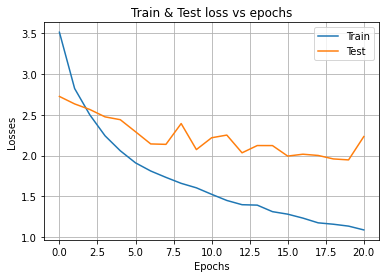

epoch: 21 train loss: 1.0718979699166715 Test loss: 1.9769582232502703


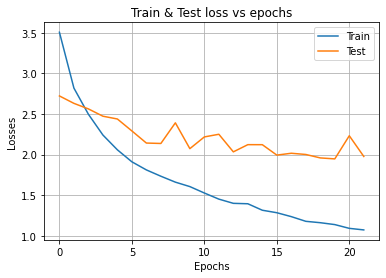

epoch: 22 train loss: 1.0152929054307611 Test loss: 2.0351748791976707


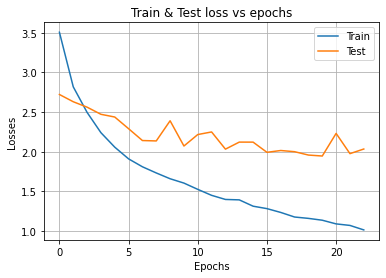

epoch: 23 train loss: 1.0125112697097451 Test loss: 1.923771454683674


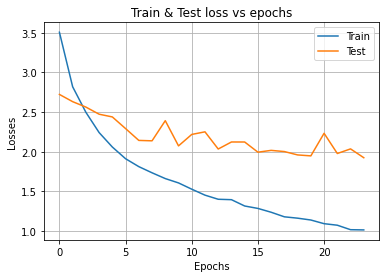

epoch: 24 train loss: 1.021919714331272 Test loss: 2.0312432467653627


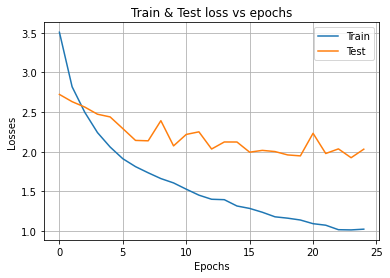

epoch: 25 train loss: 0.9841245218438804 Test loss: 2.1879440727832007


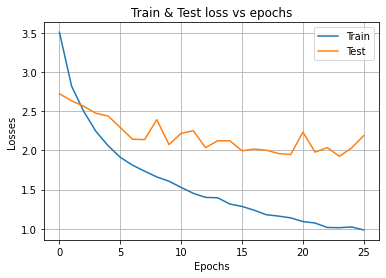

epoch: 26 train loss: 0.9355054171051039 Test loss: 2.0206694834014045


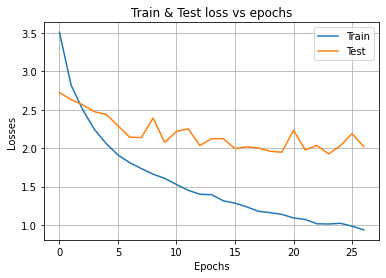

epoch: 27 train loss: 0.9086000592745542 Test loss: 1.9886370605262762


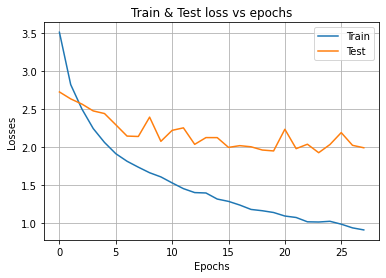

epoch: 28 train loss: 0.8790663590884874 Test loss: 1.9493316546969073


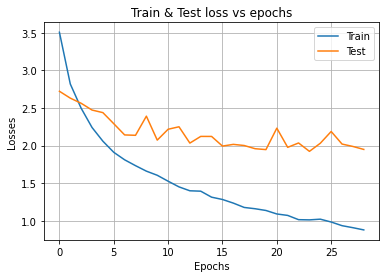

epoch: 29 train loss: 0.8762626130825825 Test loss: 1.94917689213104


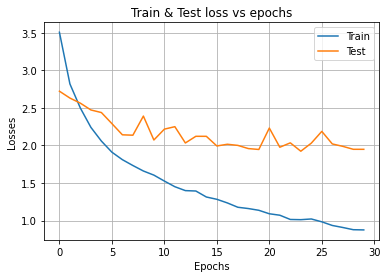

split: 0 test loss: 1.923771454683674
Mean test loss: 1.923771454683674


In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[4]

fc_layers = 1

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_overcast, datetimes_test_overcast, images_trainval_overcast, images_test_overcast, 
                                                         pv_log_trainval_overcast, pv_log_test_overcast, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):
   
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' Test loss: ' + str(Valid_losses[-1]) )

        x = np.arange(0, epoch + 1)
        plt.plot(x, Train_losses, label='Train')
        plt.plot(x, Test_losses, label='Test')
        plt.xlabel('Epochs')
        plt.ylabel('Losses')
        plt.title('Train & Test loss vs epochs')
        plt.grid(True)
        plt.legend()
        plt.show()

        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

In [ ]:
seq_len, num_epochs, learning_rate, weight_decay, conv_layers, convGRU_layers, fc_layers, title = configs[1]

batch_size = 256
batch_size_eval = 256

model = SUNSET.SUNSET_GRU4(conv_layers=conv_layers, convGRU_layers = convGRU_layers, fc_layers = fc_layers ).to(device)
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters() , lr=learning_rate, weight_decay=weight_decay)

train_loaders = [] 
valid_loaders = [] 

train_loaders, valid_loaders, test_loader = load_creator.create_dataloaders(seq_len, datetimes_trainval_overcast, datetimes_test_overcast, images_trainval_overcast, images_test_overcast, 
                                                         pv_log_trainval_overcast, pv_log_test_overcast, batch_size = batch_size , batch_size_eval = batch_size_eval, split=False)

Train_epoch_losses = []
Valid_epoch_losses = []
Test_epoch_losses = []

for split in range(len(train_loaders)):  
    
    model.apply(weight_reset)
    
    Train_losses = []
    Valid_losses = []
    Test_losses = []

    for epoch in range(num_epochs):

        l_train   =  utils.train_gru(model, train_loaders[split], optimizer, loss_fn, device, seq_len)
        l_val     =  utils.test_gru(model, valid_loaders[split], optimizer, loss_fn, device, seq_len)     
        l_test    =  utils.test_gru(model, test_loader, optimizer, loss_fn, device, seq_len)

        Train_losses.append(math.sqrt(l_train))
        Valid_losses.append(math.sqrt(l_val))
        Test_losses.append(math.sqrt(l_test))
        
        print('epoch: ' + str(epoch) + ' train loss: ' + str(Train_losses[-1]) + ' valid loss: ' + str(Valid_losses[-1]) )
        
        # Early Stopping:
        if epoch > 10 and (epoch - Valid_losses.index(min(Valid_losses)) > 5 ):
            break

    Train_epoch_losses.append(Train_losses) 
    Valid_epoch_losses.append(Valid_losses) 
    Test_epoch_losses.append(Test_losses[Valid_losses.index(min(Valid_losses))]) 
    
    print('split: ' + str(split) + ' test loss: ' + str(Test_epoch_losses[split]) )

print('Mean test loss: ' + str(sum(Test_epoch_losses)/len(Test_epoch_losses)) )

epoch: 0 train loss: 5.608281705252121 valid loss: 3.5850672533483534
epoch: 1 train loss: 4.17693937533387 valid loss: 2.891492150125303
epoch: 2 train loss: 3.5475205204966045 valid loss: 3.2312547103761577
epoch: 3 train loss: 3.4998703189204403 valid loss: 3.0876962483152433
epoch: 4 train loss: 3.4588522288825487 valid loss: 3.03706262682267
epoch: 5 train loss: 3.4110447602940237 valid loss: 2.9904636859470415
epoch: 6 train loss: 3.3559510051070984 valid loss: 2.9498323440618552
epoch: 7 train loss: 3.3099272987465596 valid loss: 2.9054201126941566
epoch: 8 train loss: 3.25673008628525 valid loss: 2.8368679178480987
epoch: 9 train loss: 3.2180367987212892 valid loss: 2.8357496285152846
epoch: 10 train loss: 3.142139633667996 valid loss: 2.7896725798258535
epoch: 11 train loss: 3.08440761576479 valid loss: 2.73990637101564
epoch: 12 train loss: 3.0176419130075383 valid loss: 2.743115781171539
epoch: 13 train loss: 2.947098641777475 valid loss: 2.68977712562292
epoch: 14 train los